# Importing Librairies

In [ ]:
#Libraries
from sklearn.model_selection import KFold
from copy import deepcopy as dc
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.arima_process import ArmaProcess
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import torch
import torch.nn as nn
import os
import pandas as pd
import matplotlib.pyplot as plt
import torch
from scipy.special import comb
import matplotlib.pyplot as plt

In [ ]:
# Load the Excel data from the specified path
df = pd.read_csv("/content/Final5.csv")
print(df.shape)
df

(5982, 39)


,Date,Consumer_Confidence_Index_x,PPI_finished_goods,INDPRO,PCE,IEABC,PI,TCU,ISM_manufacturing,durable_goods_orders,...,Volume utilities,Volume Discretionary,Volume Energy,Volume Financials,Volume Healthcare,Volume industrials,Volume Staples,Volume Materials,Volume Technology,Volume Communication
0,2000-07-14,107.880645,138.074194,92.741548,6782.883871,-104726.311828,8684.967742,81.573155,51.409677,-8.196774,...,0.0,3200.0,3300.0,3800.0,55000.0,400.0,300.0,100.0,48000.0,5700.0
1,2000-07-17,107.783871,138.045161,92.717490,6786.203226,-104784.537634,8689.506452,81.525929,51.158065,-6.880645,...,10200.0,1600.0,1800.0,3000.0,94000.0,0.0,0.0,0.0,27200.0,2200.0
2,2000-07-18,107.751613,138.035484,92.709471,6787.309677,-104803.946237,8691.019355,81.510187,51.074194,-6.441935,...,0.0,0.0,0.0,5200.0,10000.0,0.0,0.0,0.0,16400.0,600.0
3,2000-07-19,107.719355,138.025806,92.701452,6788.416129,-104823.354839,8692.532258,81.494445,50.990323,-6.003226,...,0.0,4000.0,300.0,2200.0,37000.0,200.0,0.0,0.0,26000.0,2500.0
4,2000-07-20,107.687097,138.016129,92.693432,6789.522581,-104842.763441,8694.045161,81.478703,50.906452,-5.564516,...,0.0,0.0,300.0,103600.0,79500.0,200.0,300.0,0.0,167200.0,1600.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5977,2024-04-18,77.200000,258.400000,102.331300,19189.000000,-194810.000000,23694.300000,78.254500,50.300000,2.600000,...,75300.0,36000.0,568600.0,73200.0,217300.0,27700.0,106000.0,12900.0,1468800.0,439100.0
5978,2024-04-19,77.200000,258.400000,102.331300,19189.000000,-194810.000000,23694.300000,78.254500,50.300000,2.600000,...,19500.0,291500.0,786900.0,70000.0,268600.0,39900.0,86700.0,18300.0,2094300.0,329000.0
5979,2024-04-22,77.200000,258.400000,102.331300,19189.000000,-194810.000000,23694.300000,78.254500,50.300000,2.600000,...,17000.0,62700.0,573400.0,90300.0,143300.0,26500.0,51200.0,31300.0,1832600.0,482700.0
5980,2024-04-23,77.200000,258.400000,102.331300,19189.000000,-194810.000000,23694.300000,78.254500,50.300000,2.600000,...,27900.0,64300.0,419100.0,46600.0,115000.0,26400.0,58100.0,13000.0,1326900.0,300500.0


# **Calling Frac diff from Torch**

In [ ]:
class TorchFractionalDifferentiator:

    def __init__(self, order, memory_threshold=1e-4, max_lags=20, verbose=False):
        self.order = order
        self.verbose = verbose
        self.memory_threshold = memory_threshold
        self.max_lags = max_lags
        self.num_lags = len(self._get_memory_weights(order, memory_threshold=self.memory_threshold, max_lags=max_lags)) - 1

    def _get_memory_weights(self, order, memory_threshold, max_lags):
        memory_weights = [1,]
        k = 1
        while True:
            weight = -memory_weights[-1] * (order - k + 1) / k
            if (abs(weight) < memory_threshold) or len(memory_weights)>max_lags:
                if self.verbose:
                  print({'len(memory_weights)':len(memory_weights)})
                break
            memory_weights.append(weight)
            k += 1
        return np.array(list(reversed(memory_weights)))

    def transform(self, data_tensor):
        data_np = data_tensor.numpy()
        frac_diffed = self._frac_diff(data_np, order=self.order)
        return torch.tensor(frac_diffed)

    def _frac_diff(self, ts, order=1, memory_weights=None):
        if memory_weights is None:
            memory_weights = self._get_memory_weights(order, memory_threshold=self.memory_threshold, max_lags=self.max_lags)

        K = len(memory_weights)
        frac_diffed_series = np.array([np.sum(ts[i - K:i] * memory_weights) for i in range(K, len(ts) + 1)])
        return frac_diffed_series

    def inverse_transform(self, frac_diffed_tensor, lag_data_tensor):
        if lag_data_tensor.shape[0] != self.num_lags:
            raise Exception(f'The previous {self.num_lags} values are required.')

        memory_weights = self._get_memory_weights(self.order, memory_threshold=self.memory_threshold, max_lags=self.max_lags)
        memory_weights_tensor = torch.tensor(memory_weights, dtype=torch.float32)
        K = self.num_lags

        ts_lag_data = lag_data_tensor[:K]
        x_tilde = frac_diffed_tensor[K:]
        if K == 0:
            return x_tilde

        x_vals = ts_lag_data.clone()
        for t in range(x_tilde.shape[0]):
            x_current = x_tilde[t] - torch.sum(memory_weights_tensor[:-1] * x_vals[-K:])
            x_vals = torch.cat((x_vals, x_current.unsqueeze(0)), dim=0)

        return torch.tensor(x_vals).float()

# Apply Fractional Differencation on all data


In [ ]:
def apply_fractional_diff(df, features, orders):
    frac_diff_results = {}
    differentiated_df = pd.DataFrame(index=df.index)  # Create an empty DataFrame to store differentiated data

    for feature, order in zip(features, orders):
        torch_frac_diff = TorchFractionalDifferentiator(order, memory_threshold=1e-5, max_lags=20)
        print(f'Processing feature: {feature} with order: {order}')

        original_data_tensor = torch.tensor(df[feature].values, dtype=torch.float32)
        frac_diffed_tensor = torch_frac_diff.transform(original_data_tensor)

        lag_data_tensor = original_data_tensor[:torch_frac_diff.num_lags]
        reconstructed_tensor = torch_frac_diff.inverse_transform(frac_diffed_tensor, lag_data_tensor)

        frac_diff_results[feature] = {
            'frac_diffed': frac_diffed_tensor.numpy(),
            'reconstructed': reconstructed_tensor.numpy(),
            'reconstruction_error': df[feature].values[torch_frac_diff.num_lags:] - reconstructed_tensor.numpy()
        }

        # Add the differentiated data to the new DataFrame
        differentiated_column_name = f'{feature}_frac_diff'
        differentiated_df[differentiated_column_name] = np.nan
        differentiated_df[differentiated_column_name].iloc[torch_frac_diff.num_lags:] = frac_diffed_tensor.numpy()

        # Plot the results
        plt.figure(figsize=(18, 6))

        plt.subplot(141)
        plt.plot(df[feature].values, label='Original Data')
        plt.title(f'{feature} - Original Data')
        plt.legend()

        plt.subplot(142)
        plt.plot(frac_diff_results[feature]['frac_diffed'], label='Fractionally Differentiated', color='red')
        plt.title(f'{feature} - Fractionally Differentiated (Order: {order})')
        plt.legend()

        plt.subplot(143)
        plt.plot(frac_diff_results[feature]['reconstructed'], label='Reconstructed Data', color='green')
        plt.title(f'{feature} - Reconstructed Data')
        plt.legend()

        plt.subplot(144)
        plt.plot(frac_diff_results[feature]['reconstruction_error'], label='Reconstruction Error', color='purple')
        plt.title(f'{feature} - Reconstruction Error')
        plt.legend()

        plt.tight_layout()
        plt.show()

    return differentiated_df, frac_diff_results

In [ ]:
Features=['Consumer_Confidence_Index_x', 'PPI_finished_goods', 'INDPRO', 'PCE',
       'IEABC', 'PI', 'TCU', 'ISM_manufacturing', 'durable_goods_orders',
       'Building_Permits', 'Business_Inventories', 'ECONOMICS_USCPI,_M_df862',
       'Employment_cost_index', 'Factory_Orders', 'Housing_Starts',
       'New_residential_sales', 'weekly_claims', 'trade_balance',
       'Adj Close utilities', 'Adj Close Discretionary', 'Adj Close Energy',
       'Adj Close Financials', 'Adj Close Healthcare', 'Adj Close industrials',
       'Adj Close Staples', 'Adj Close Materials', 'Adj Close Technology',
       'Adj Close Communication', 'Volume utilities', 'Volume  Discretionary',
       'Volume Energy', 'Volume Financials', 'Volume Healthcare',
       'Volume industrials', 'Volume Staples', 'Volume Materials',
       'Volume Technology', 'Volume Communication']

In [ ]:
orders=[0.1,0.8,0.2,0.8,0.2,0.7,
            0.2,0,0, 0.4,0,0.5,
0.1,0,0.3,0.3,0.2,0.3,0.5,0.5,0.3,0.5,0.7,0.5,0.7,
0.4,0.6,0.3,0,0,0,0.1,0,0,0,0.1,0,0]

# **Plotting The results**

Processing feature: Consumer_Confidence_Index_x with order: 0.1


<ipython-input-3-51f6df913530>:54: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return torch.tensor(x_vals).float()


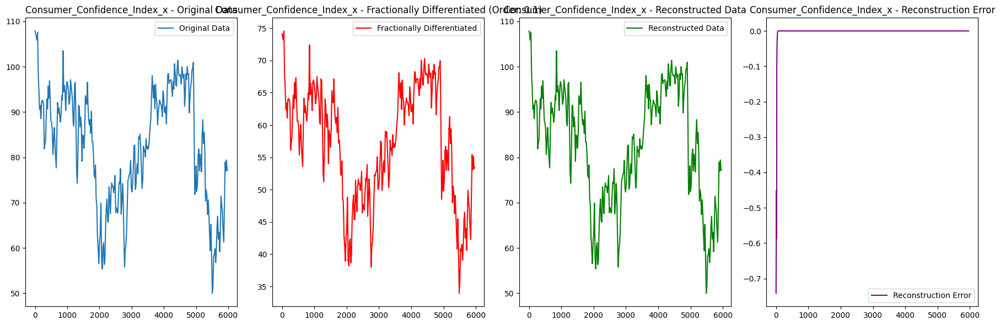

Processing feature: PPI_finished_goods with order: 0.8


<ipython-input-3-51f6df913530>:54: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return torch.tensor(x_vals).float()


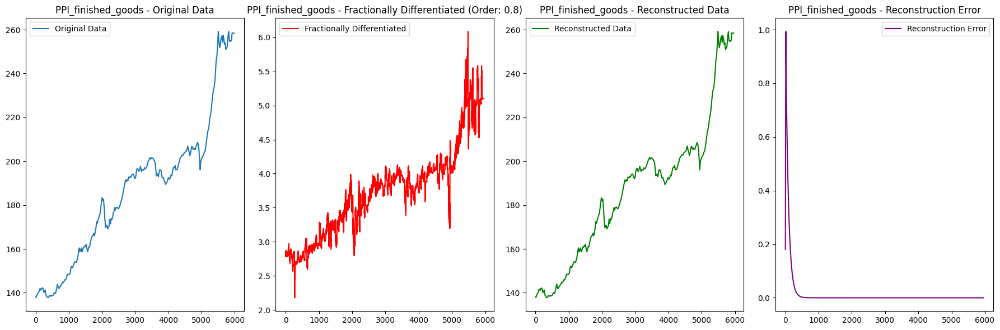

Processing feature: INDPRO with order: 0.2


<ipython-input-3-51f6df913530>:54: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return torch.tensor(x_vals).float()


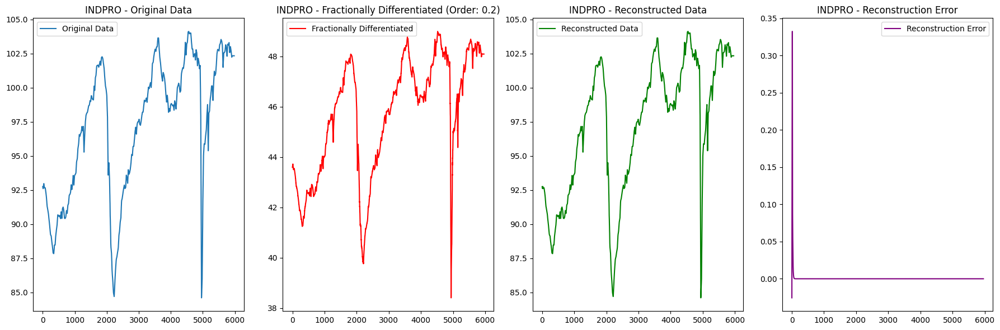

Processing feature: PCE with order: 0.8


<ipython-input-3-51f6df913530>:54: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return torch.tensor(x_vals).float()


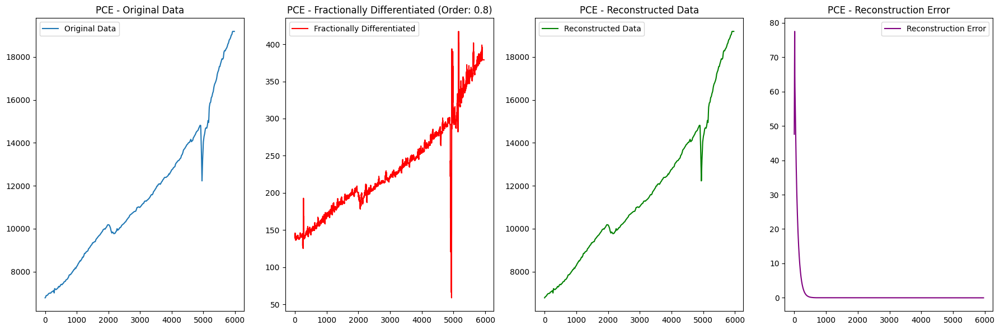

Processing feature: IEABC with order: 0.2


<ipython-input-3-51f6df913530>:54: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return torch.tensor(x_vals).float()


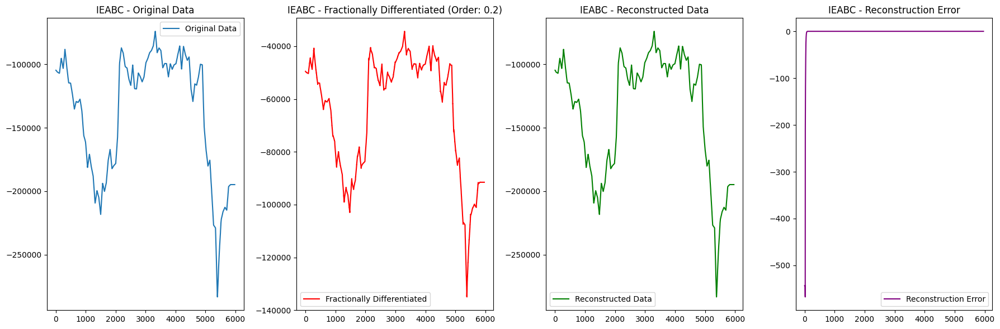

Processing feature: PI with order: 0.7


<ipython-input-3-51f6df913530>:54: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return torch.tensor(x_vals).float()


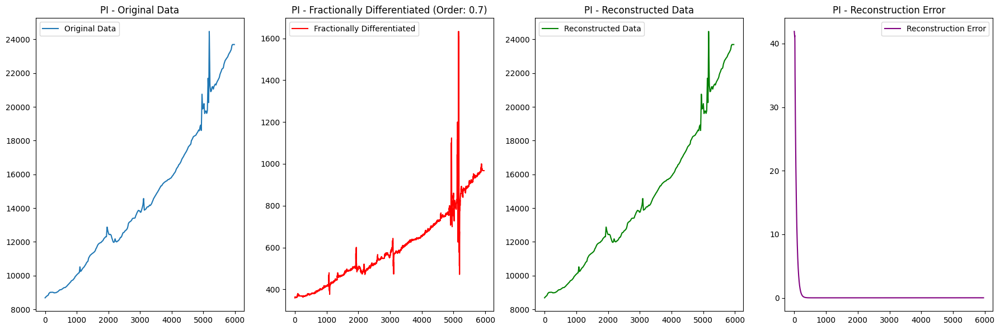

Processing feature: TCU with order: 0.2


<ipython-input-3-51f6df913530>:54: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return torch.tensor(x_vals).float()


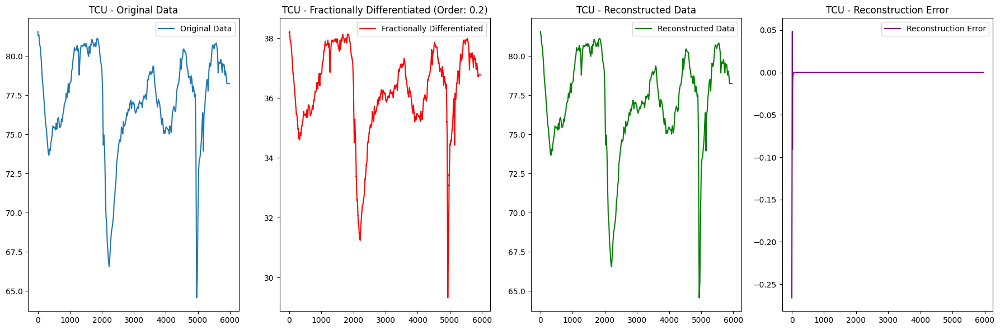

Processing feature: ISM_manufacturing with order: 0


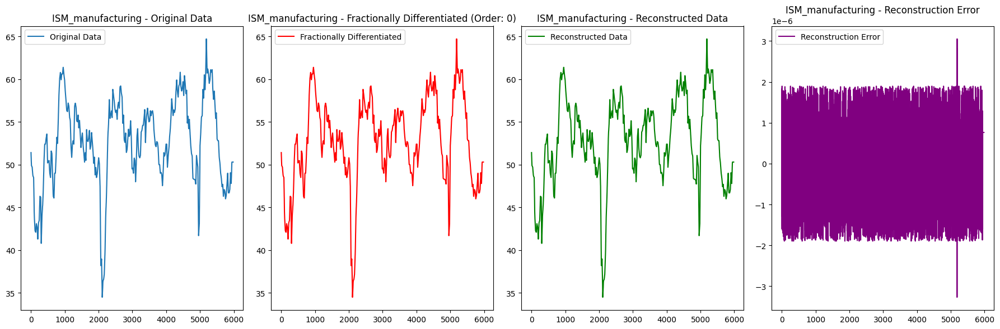

Processing feature: durable_goods_orders with order: 0


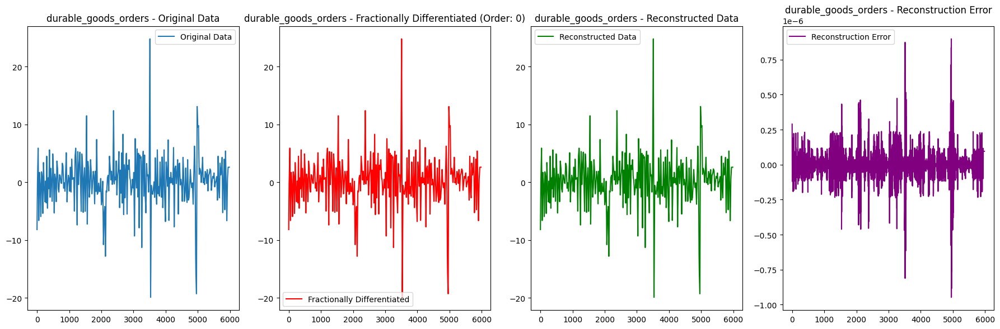

Processing feature: Building_Permits with order: 0.4


<ipython-input-3-51f6df913530>:54: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return torch.tensor(x_vals).float()


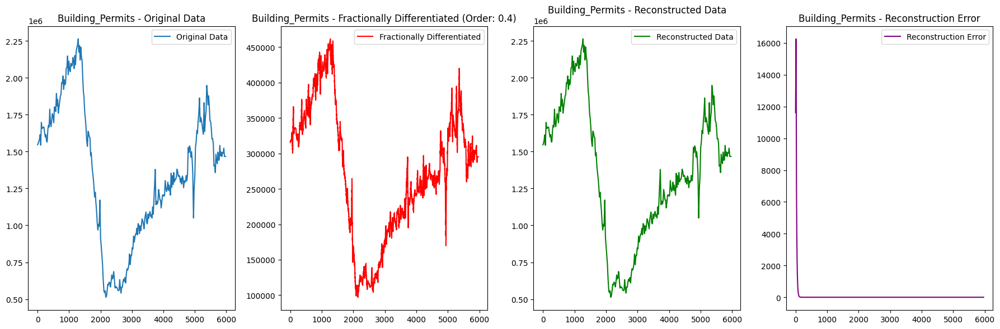

Processing feature: Business_Inventories with order: 0


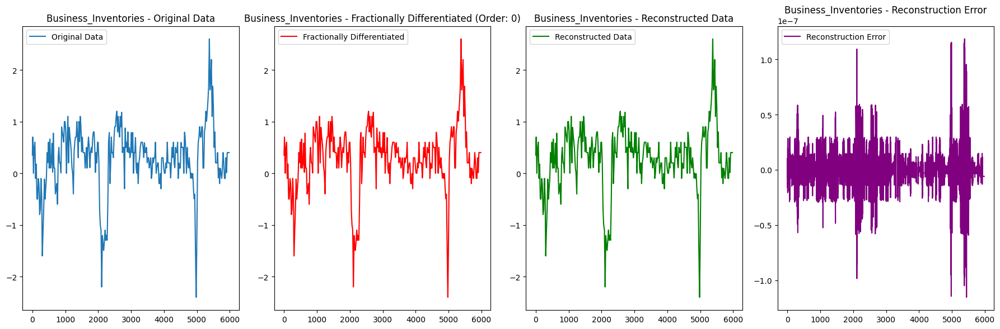

Processing feature: ECONOMICS_USCPI,_M_df862 with order: 0.5


<ipython-input-3-51f6df913530>:54: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return torch.tensor(x_vals).float()


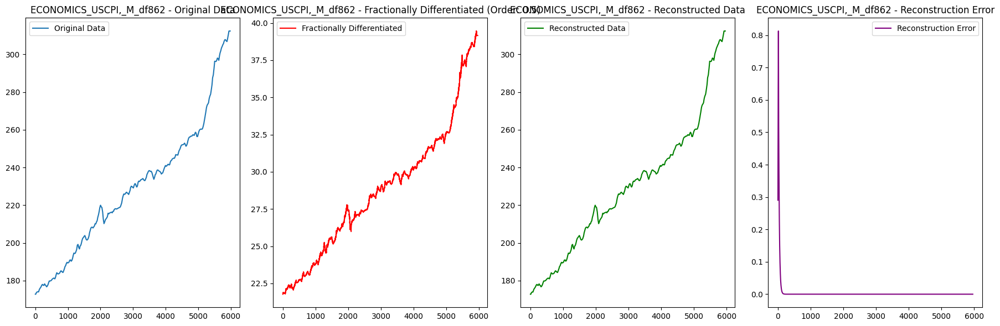

Processing feature: Employment_cost_index with order: 0.1


<ipython-input-3-51f6df913530>:54: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return torch.tensor(x_vals).float()


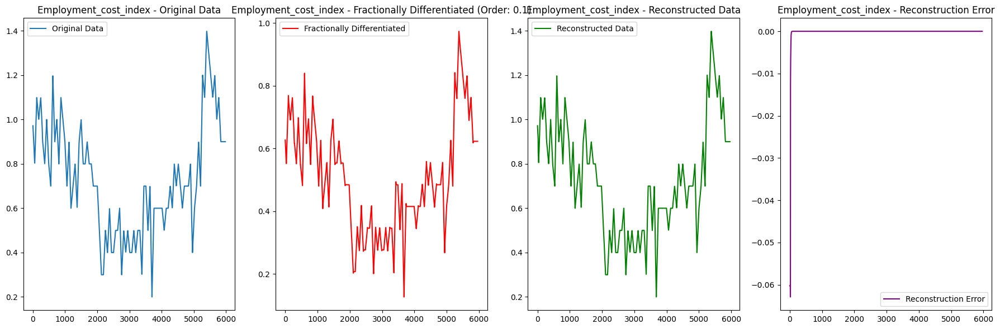

Processing feature: Factory_Orders with order: 0


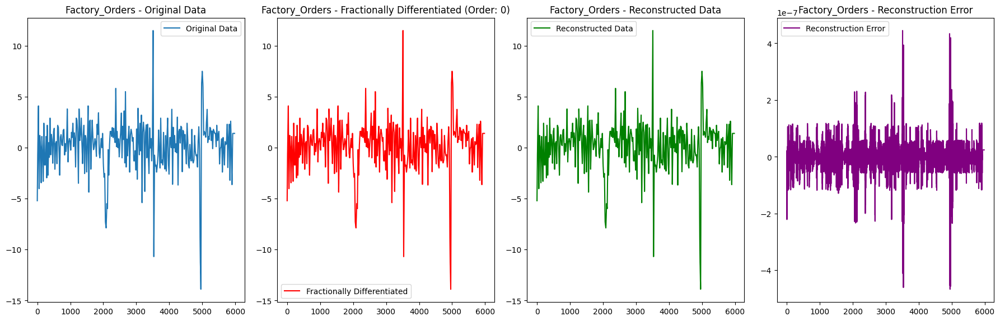

Processing feature: Housing_Starts with order: 0.3


<ipython-input-3-51f6df913530>:54: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return torch.tensor(x_vals).float()


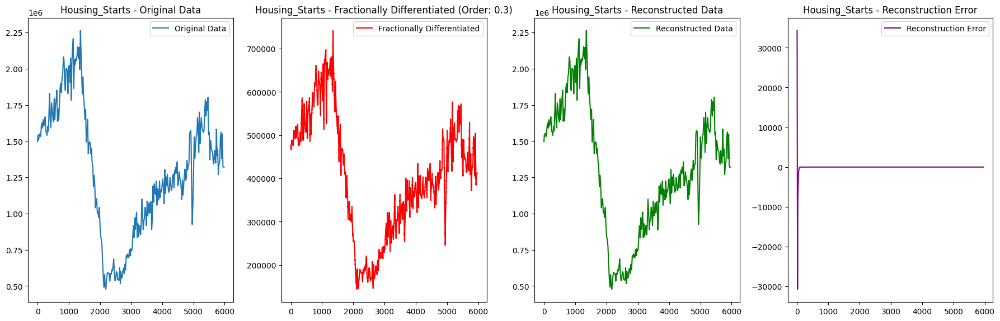

Processing feature: New_residential_sales with order: 0.3


<ipython-input-3-51f6df913530>:54: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return torch.tensor(x_vals).float()


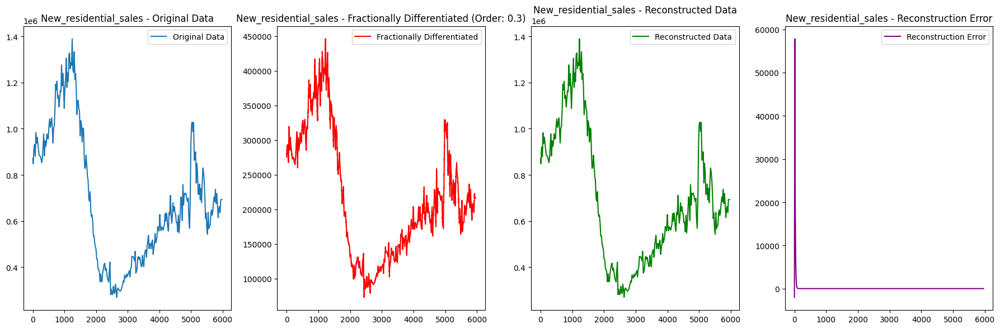

Processing feature: weekly_claims with order: 0.2


<ipython-input-3-51f6df913530>:54: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return torch.tensor(x_vals).float()


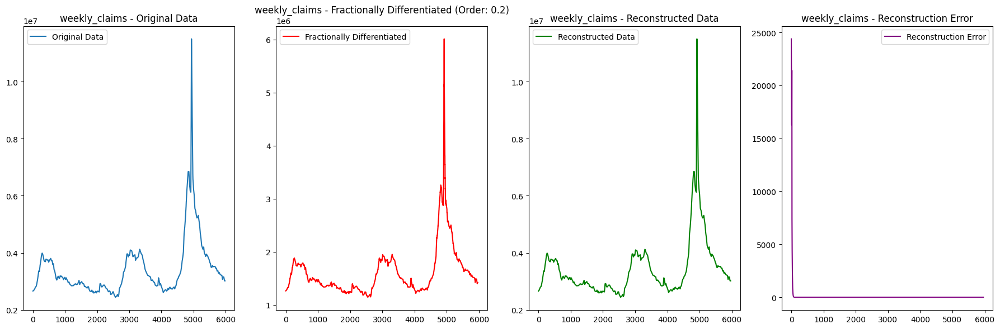

Processing feature: trade_balance with order: 0.3


<ipython-input-3-51f6df913530>:54: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return torch.tensor(x_vals).float()


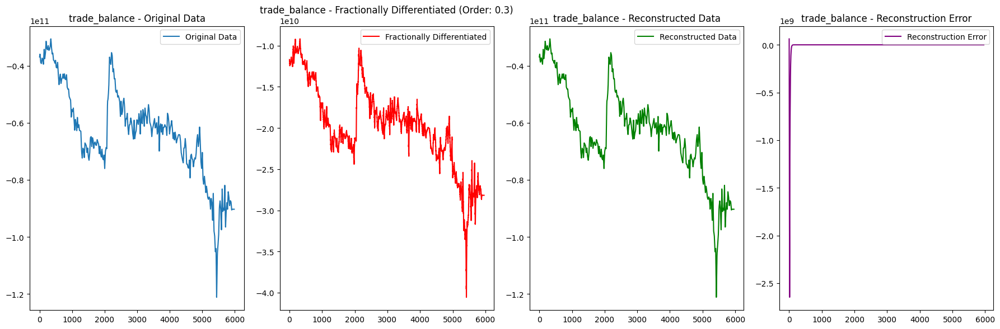

Processing feature: Adj Close utilities with order: 0.5


<ipython-input-3-51f6df913530>:54: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return torch.tensor(x_vals).float()


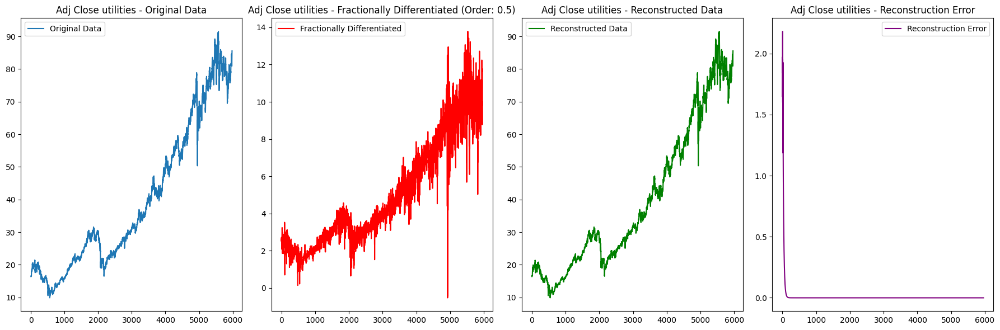

Processing feature: Adj Close Discretionary with order: 0.5


<ipython-input-3-51f6df913530>:54: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return torch.tensor(x_vals).float()


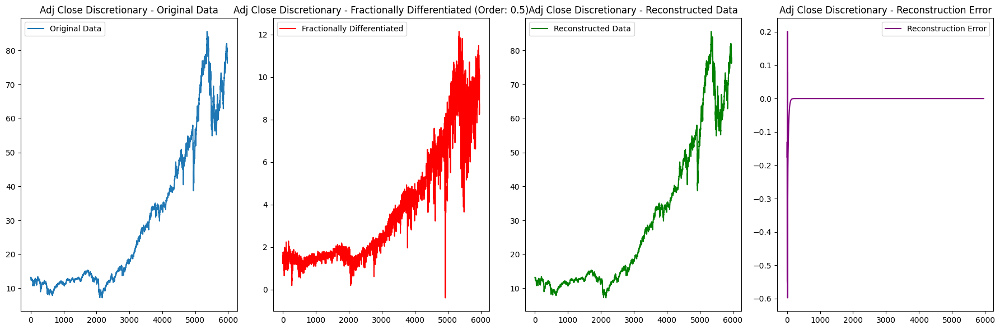

Processing feature: Adj Close Energy with order: 0.3


<ipython-input-3-51f6df913530>:54: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return torch.tensor(x_vals).float()


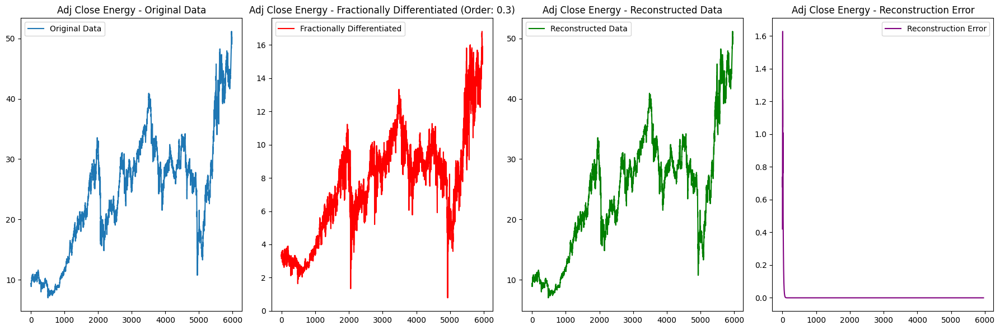

Processing feature: Adj Close Financials with order: 0.5


<ipython-input-3-51f6df913530>:54: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return torch.tensor(x_vals).float()


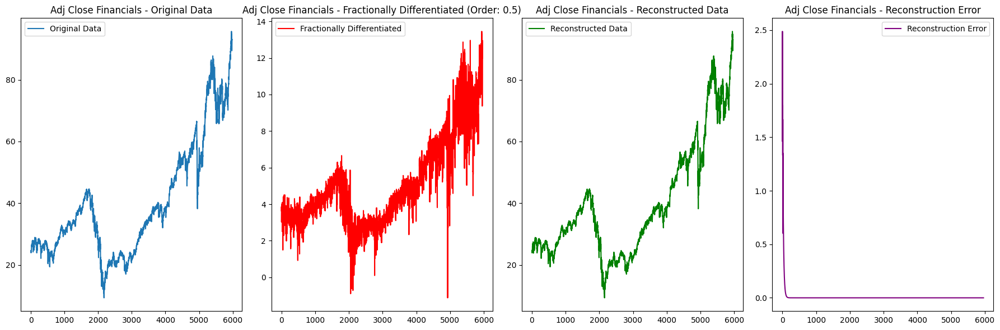

Processing feature: Adj Close Healthcare with order: 0.7


<ipython-input-3-51f6df913530>:54: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return torch.tensor(x_vals).float()


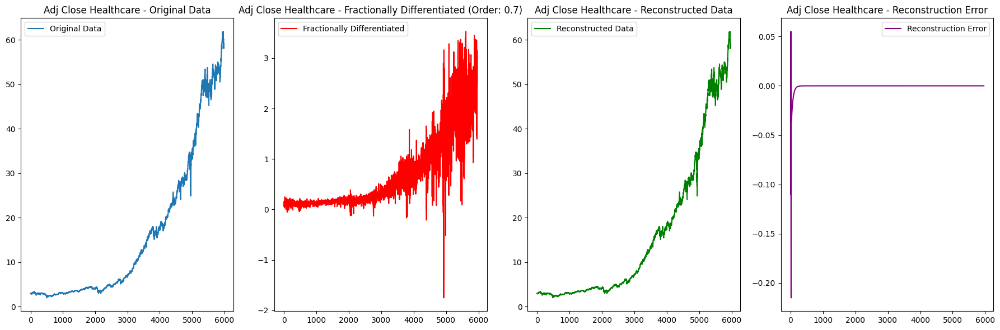

Processing feature: Adj Close industrials with order: 0.5


<ipython-input-3-51f6df913530>:54: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return torch.tensor(x_vals).float()


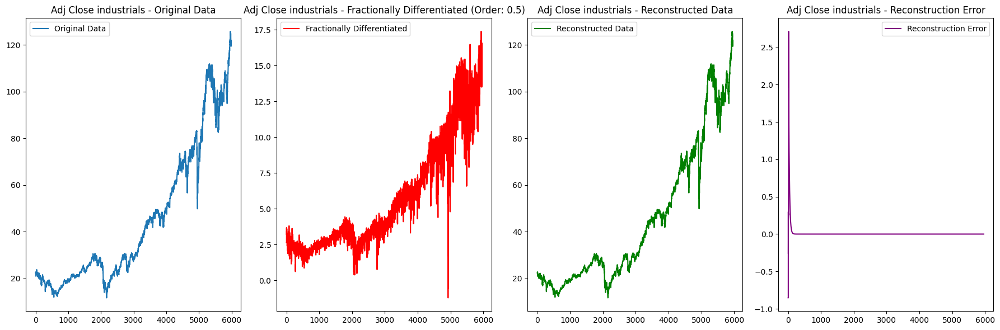

Processing feature: Adj Close Staples with order: 0.7


<ipython-input-3-51f6df913530>:54: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return torch.tensor(x_vals).float()


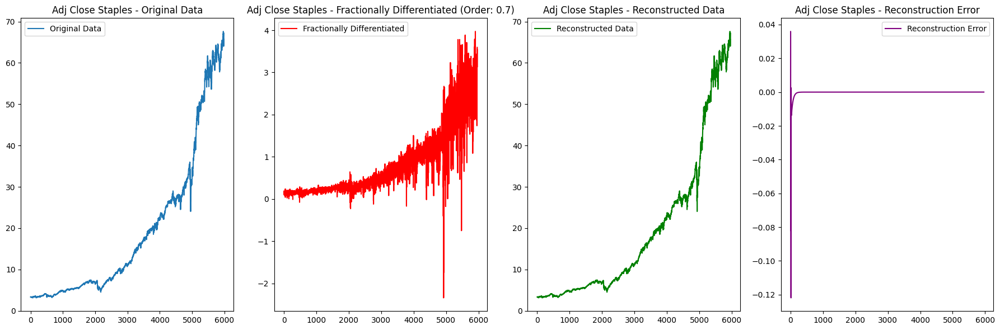

Processing feature: Adj Close Materials with order: 0.4


<ipython-input-3-51f6df913530>:54: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return torch.tensor(x_vals).float()


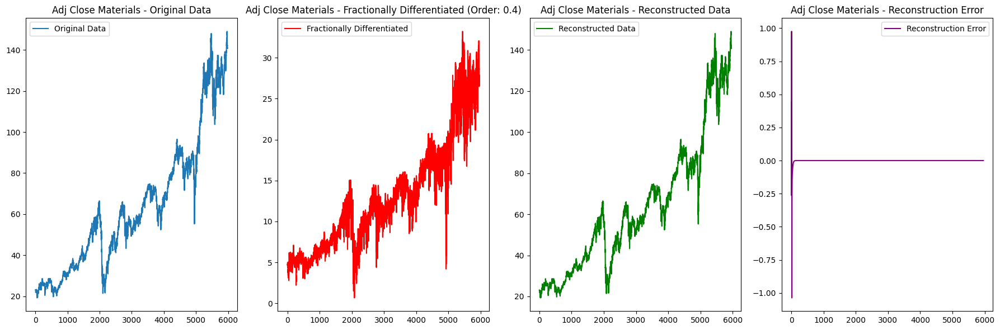

Processing feature: Adj Close Technology with order: 0.6


<ipython-input-3-51f6df913530>:54: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return torch.tensor(x_vals).float()


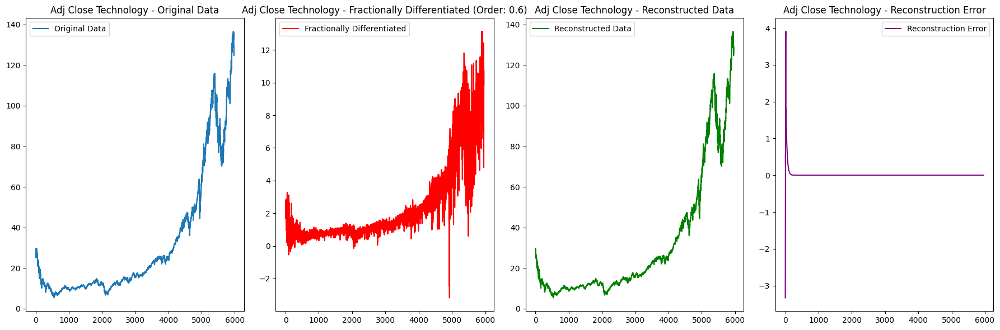

Processing feature: Adj Close Communication with order: 0.3


<ipython-input-3-51f6df913530>:54: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return torch.tensor(x_vals).float()


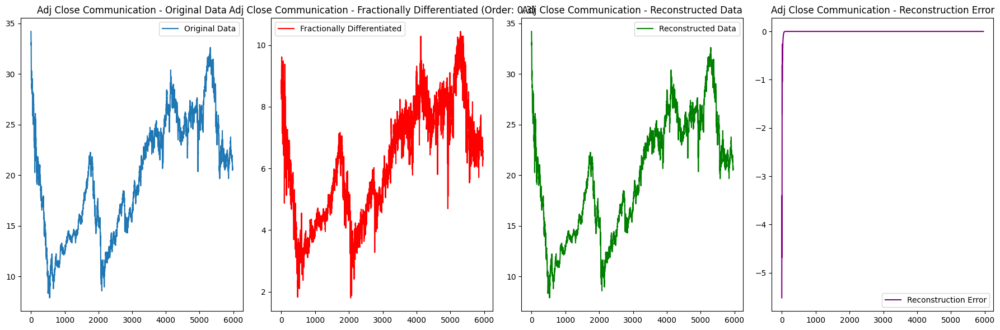

Processing feature: Volume utilities with order: 0


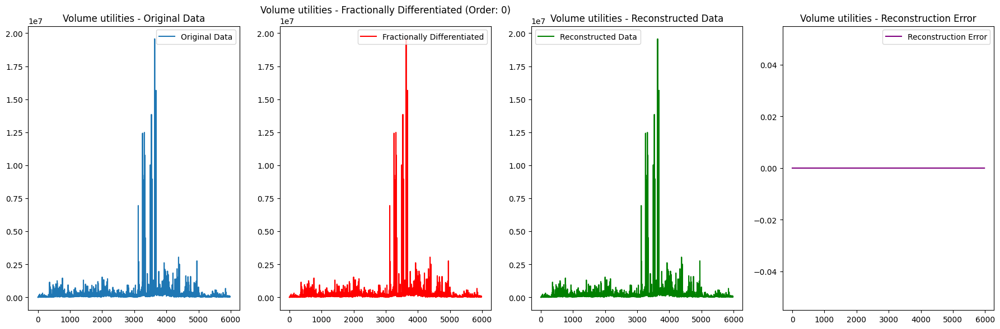

Processing feature: Volume  Discretionary with order: 0


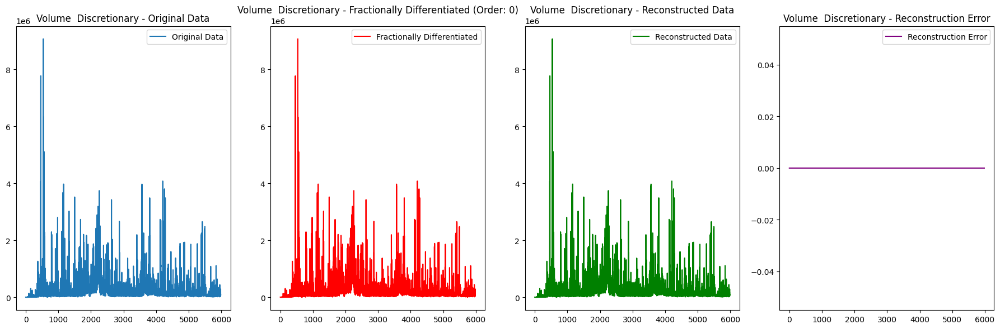

Processing feature: Volume Energy with order: 0


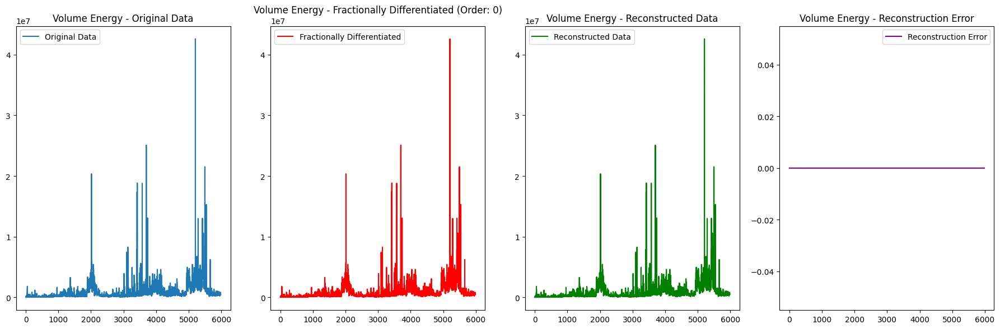

Processing feature: Volume Financials with order: 0.1


<ipython-input-3-51f6df913530>:54: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return torch.tensor(x_vals).float()


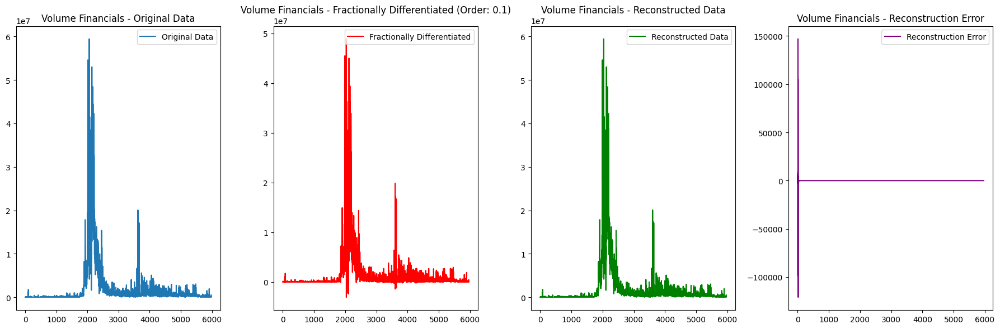

Processing feature: Volume Healthcare with order: 0


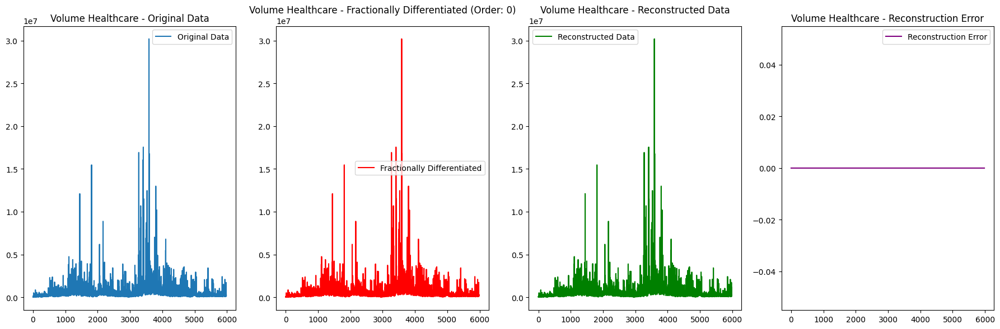

Processing feature: Volume industrials with order: 0


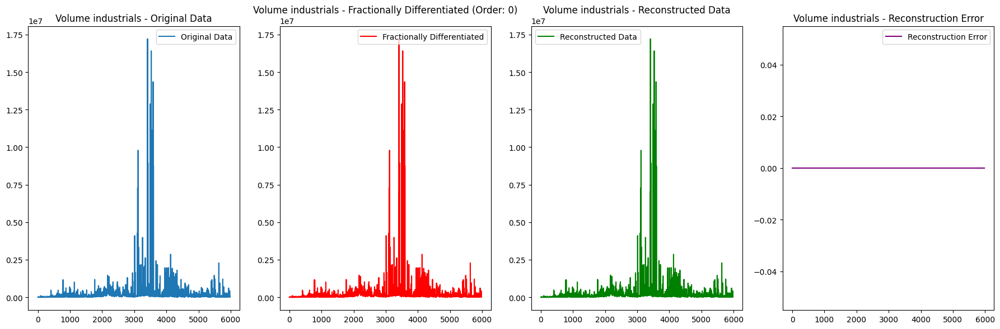

Processing feature: Volume Staples with order: 0


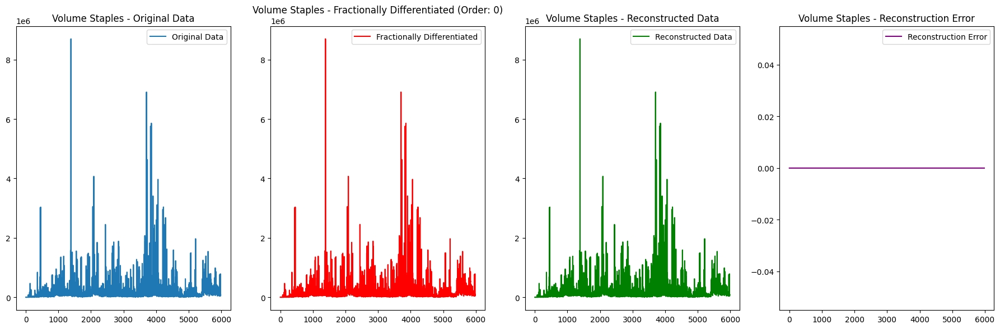

Processing feature: Volume Materials with order: 0.1


<ipython-input-3-51f6df913530>:54: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return torch.tensor(x_vals).float()


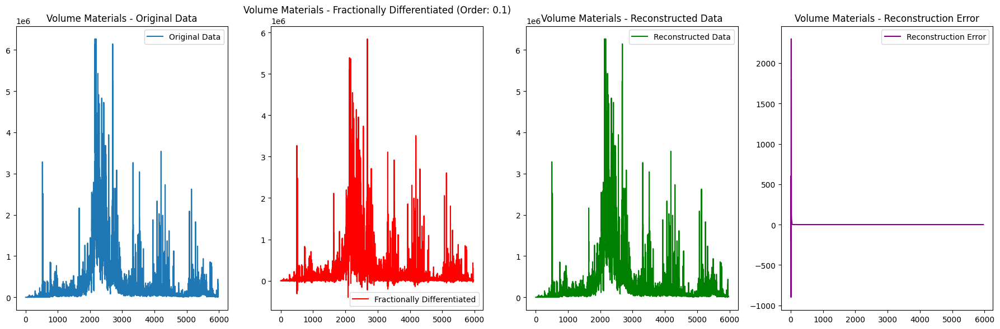

Processing feature: Volume Technology with order: 0


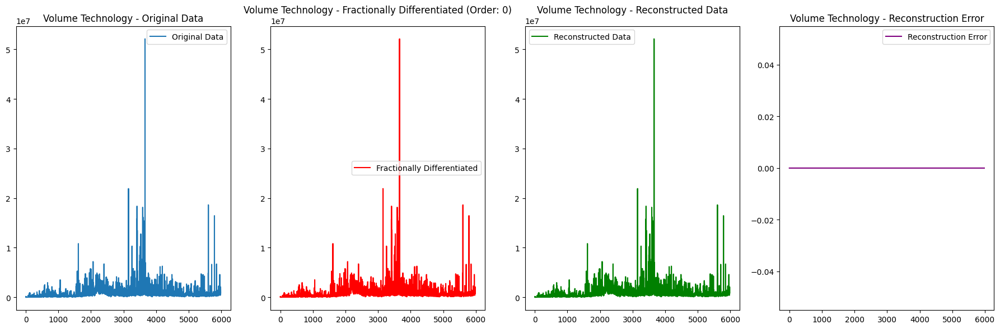

Processing feature: Volume Communication with order: 0


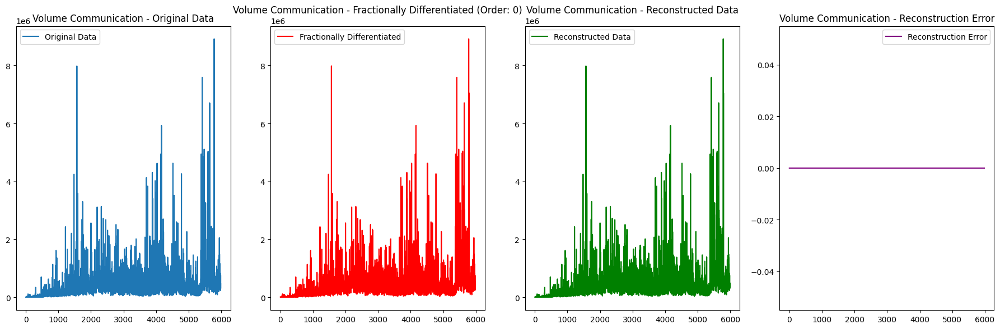

   Consumer_Confidence_Index_x_frac_diff  PPI_finished_goods_frac_diff  \
0                                    NaN                           NaN   
1                                    NaN                           NaN   
2                                    NaN                           NaN   
3                                    NaN                           NaN   
4                                    NaN                           NaN   

   INDPRO_frac_diff  PCE_frac_diff  IEABC_frac_diff  PI_frac_diff  \
0               NaN            NaN              NaN           NaN   
1               NaN            NaN              NaN           NaN   
2               NaN            NaN              NaN           NaN   
3               NaN            NaN              NaN           NaN   
4               NaN            NaN              NaN           NaN   

   TCU_frac_diff  ISM_manufacturing_frac_diff  durable_goods_orders_frac_diff  \
0            NaN                    51.409676              

In [ ]:
differentiated_df, results = apply_fractional_diff(df, Features, orders)
# Display the combined DataFrame
print(differentiated_df.head())

In [ ]:
differentiated_df

,Consumer_Confidence_Index_x_frac_diff,PPI_finished_goods_frac_diff,INDPRO_frac_diff,PCE_frac_diff,IEABC_frac_diff,PI_frac_diff,TCU_frac_diff,ISM_manufacturing_frac_diff,durable_goods_orders_frac_diff,Building_Permits_frac_diff,...,Volume utilities_frac_diff,Volume Discretionary_frac_diff,Volume Energy_frac_diff,Volume Financials_frac_diff,Volume Healthcare_frac_diff,Volume industrials_frac_diff,Volume Staples_frac_diff,Volume Materials_frac_diff,Volume Technology_frac_diff,Volume Communication_frac_diff
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,51.409676,-8.196774,NaN,...,0.0,3200.0,3300.0,NaN,55000.0,400.0,300.0,NaN,48000.0,5700.0
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,51.158066,-6.880645,NaN,...,10200.0,1600.0,1800.0,NaN,94000.0,0.0,0.0,NaN,27200.0,2200.0
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,51.074192,-6.441936,NaN,...,0.0,0.0,0.0,NaN,10000.0,0.0,0.0,NaN,16400.0,600.0
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,50.990322,-6.003226,NaN,...,0.0,4000.0,300.0,NaN,37000.0,200.0,0.0,NaN,26000.0,2500.0
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,50.906452,-5.564516,NaN,...,0.0,0.0,300.0,NaN,79500.0,200.0,300.0,NaN,167200.0,1600.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5977,53.405869,5.103055,48.087858,378.957139,-91545.750298,967.690403,36.77361,50.299999,2.600000,295437.883289,...,75300.0,36000.0,568600.0,29243.550475,217300.0,27700.0,106000.0,-741.668103,1468800.0,439100.0
5978,53.409621,5.103055,48.087858,378.957139,-91545.750298,967.690403,36.77361,50.299999,2.600000,295437.883289,...,19500.0,291500.0,786900.0,31618.076886,268600.0,39900.0,86700.0,6312.334140,2094300.0,329000.0
5979,53.412895,5.103055,48.087858,378.957139,-91545.750298,967.690403,36.77361,50.299999,2.600000,295437.883289,...,17000.0,62700.0,573400.0,55277.862028,143300.0,26500.0,51200.0,19847.860898,1832600.0,482700.0
5980,53.415732,5.103055,48.087858,378.957139,-91545.750298,967.690403,36.77361,50.299999,2.600000,295437.883289,...,27900.0,64300.0,419100.0,11788.160781,115000.0,26400.0,58100.0,818.705649,1326900.0,300500.0


In [ ]:
nan_counts = differentiated_df.isna().sum()
print(nan_counts)

Consumer_Confidence_Index_x_frac_diff    20
PPI_finished_goods_frac_diff             20
INDPRO_frac_diff                         20
PCE_frac_diff                            20
IEABC_frac_diff                          20
PI_frac_diff                             20
TCU_frac_diff                            20
ISM_manufacturing_frac_diff               0
durable_goods_orders_frac_diff            0
Building_Permits_frac_diff               20
Business_Inventories_frac_diff            0
ECONOMICS_USCPI,_M_df862_frac_diff       20
Employment_cost_index_frac_diff          20
Factory_Orders_frac_diff                  0
Housing_Starts_frac_diff                 20
New_residential_sales_frac_diff          20
weekly_claims_frac_diff                  20
trade_balance_frac_diff                  20
Adj Close utilities_frac_diff            20
Adj Close Discretionary_frac_diff        20
Adj Close Energy_frac_diff               20
Adj Close Financials_frac_diff           20
Adj Close Healthcare_frac_diff  

In [ ]:
Features_diff=differentiated_df.columns
Features_diff


Index(['Consumer_Confidence_Index_x_frac_diff', 'PPI_finished_goods_frac_diff',
       'INDPRO_frac_diff', 'PCE_frac_diff', 'IEABC_frac_diff', 'PI_frac_diff',
       'TCU_frac_diff', 'ISM_manufacturing_frac_diff',
       'durable_goods_orders_frac_diff', 'Building_Permits_frac_diff',
       'Business_Inventories_frac_diff', 'ECONOMICS_USCPI,_M_df862_frac_diff',
       'Employment_cost_index_frac_diff', 'Factory_Orders_frac_diff',
       'Housing_Starts_frac_diff', 'New_residential_sales_frac_diff',
       'weekly_claims_frac_diff', 'trade_balance_frac_diff',
       'Adj Close utilities_frac_diff', 'Adj Close Discretionary_frac_diff',
       'Adj Close Energy_frac_diff', 'Adj Close Financials_frac_diff',
       'Adj Close Healthcare_frac_diff', 'Adj Close industrials_frac_diff',
       'Adj Close Staples_frac_diff', 'Adj Close Materials_frac_diff',
       'Adj Close Technology_frac_diff', 'Adj Close Communication_frac_diff',
       'Volume utilities_frac_diff', 'Volume  Discretionary_fr

In [ ]:
differentiated_df.dropna()

,Consumer_Confidence_Index_x_frac_diff,PPI_finished_goods_frac_diff,INDPRO_frac_diff,PCE_frac_diff,IEABC_frac_diff,PI_frac_diff,TCU_frac_diff,ISM_manufacturing_frac_diff,durable_goods_orders_frac_diff,Building_Permits_frac_diff,...,Volume utilities_frac_diff,Volume Discretionary_frac_diff,Volume Energy_frac_diff,Volume Financials_frac_diff,Volume Healthcare_frac_diff,Volume industrials_frac_diff,Volume Staples_frac_diff,Volume Materials_frac_diff,Volume Technology_frac_diff,Volume Communication_frac_diff
20,74.099294,2.784835,43.589493,139.428763,-49525.401249,359.588370,38.200367,49.835484,1.7,315437.345101,...,5400.0,0.0,6600.0,3798.434162,22000.0,0.0,600.0,-18.955423,69200.0,2000.0
21,74.058441,2.856772,43.620388,144.979863,-49571.478077,362.505328,38.206856,49.816128,2.3,316689.291169,...,5200.0,0.0,8700.0,-830.644018,23500.0,0.0,3600.0,-16.089378,39600.0,2300.0
22,74.052547,2.800987,43.622554,140.583079,-49571.427039,360.453498,38.208785,49.809677,2.5,316324.240557,...,3200.0,0.0,15300.0,-3524.302622,48000.0,0.0,0.0,-14.234814,6000.0,1100.0
23,74.044633,2.796309,43.627419,140.179378,-49576.216074,360.159767,38.210906,49.803226,2.7,316287.863311,...,10000.0,3600.0,12300.0,-813.884691,35000.0,1800.0,6300.0,-12.785895,8000.0,1200.0
24,74.035980,2.795028,43.632882,140.045938,-49582.393393,360.048703,38.212938,49.796776,2.9,316318.748140,...,2400.0,400.0,11100.0,953.164338,27000.0,0.0,0.0,-11.612597,10400.0,1300.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5977,53.405869,5.103055,48.087858,378.957139,-91545.750298,967.690403,36.773610,50.299999,2.6,295437.883289,...,75300.0,36000.0,568600.0,29243.550475,217300.0,27700.0,106000.0,-741.668103,1468800.0,439100.0
5978,53.409621,5.103055,48.087858,378.957139,-91545.750298,967.690403,36.773610,50.299999,2.6,295437.883289,...,19500.0,291500.0,786900.0,31618.076886,268600.0,39900.0,86700.0,6312.334140,2094300.0,329000.0
5979,53.412895,5.103055,48.087858,378.957139,-91545.750298,967.690403,36.773610,50.299999,2.6,295437.883289,...,17000.0,62700.0,573400.0,55277.862028,143300.0,26500.0,51200.0,19847.860898,1832600.0,482700.0
5980,53.415732,5.103055,48.087858,378.957139,-91545.750298,967.690403,36.773610,50.299999,2.6,295437.883289,...,27900.0,64300.0,419100.0,11788.160781,115000.0,26400.0,58100.0,818.705649,1326900.0,300500.0


In [ ]:
all_features=differentiated_df.columns
all_features

Index(['Consumer_Confidence_Index_x_frac_diff', 'PPI_finished_goods_frac_diff',
       'INDPRO_frac_diff', 'PCE_frac_diff', 'IEABC_frac_diff', 'PI_frac_diff',
       'TCU_frac_diff', 'ISM_manufacturing_frac_diff',
       'durable_goods_orders_frac_diff', 'Building_Permits_frac_diff',
       'Business_Inventories_frac_diff', 'ECONOMICS_USCPI,_M_df862_frac_diff',
       'Employment_cost_index_frac_diff', 'Factory_Orders_frac_diff',
       'Housing_Starts_frac_diff', 'New_residential_sales_frac_diff',
       'weekly_claims_frac_diff', 'trade_balance_frac_diff',
       'Adj Close utilities_frac_diff', 'Adj Close Discretionary_frac_diff',
       'Adj Close Energy_frac_diff', 'Adj Close Financials_frac_diff',
       'Adj Close Healthcare_frac_diff', 'Adj Close industrials_frac_diff',
       'Adj Close Staples_frac_diff', 'Adj Close Materials_frac_diff',
       'Adj Close Technology_frac_diff', 'Adj Close Communication_frac_diff',
       'Volume utilities_frac_diff', 'Volume  Discretionary_fr

# Standard Deviation Tachnique

**Calculating the standard deviation**

In [ ]:
import pandas as pd
import numpy as np

# Define the window size and lag factor
window_size = 70
lag = 1

# List of original features
original_features = ['Consumer_Confidence_Index_x', 'PPI_finished_goods', 'INDPRO', 'PCE',
       'IEABC', 'PI', 'TCU', 'ISM_manufacturing', 'durable_goods_orders',
       'Building_Permits', 'Business_Inventories', 'ECONOMICS_USCPI,_M_df862',
       'Employment_cost_index', 'Factory_Orders', 'Housing_Starts',
       'New_residential_sales', 'weekly_claims', 'trade_balance',
       'Adj Close utilities', 'Adj Close Discretionary', 'Adj Close Energy',
       'Adj Close Financials', 'Adj Close Healthcare', 'Adj Close industrials',
       'Adj Close Staples', 'Adj Close Materials', 'Adj Close Technology',
       'Adj Close Communication', 'Volume utilities', 'Volume  Discretionary',
       'Volume Energy', 'Volume Financials', 'Volume Healthcare',
       'Volume industrials', 'Volume Staples', 'Volume Materials',
       'Volume Technology', 'Volume Communication']

# Assuming combined_df is your DataFrame
# Initialize a DataFrame to store the standard deviations
std_df = pd.DataFrame(index=differentiated_df.index)

# Loop through each original feature in the combined DataFrame
for feature in all_features:
    # Check if the feature is present in combined_df
    if feature in differentiated_df.columns:
        # Extract the column data
        data = differentiated_df[feature]

        # Initialize a list to store the standard deviations
        std_values = [np.nan] * len(data)  # Initialize with NaNs

        # Iterate over the DataFrame with the specified lag
        for start in range(0, len(data) - window_size + 1, lag):
            end = start + window_size
            window_data = data.iloc[start:end]

            # Calculate the standard deviation for the current window
            std = window_data.std()

            # Store the standard deviation value at the correct index with lag
            std_values[end - lag] = std  # Store std at the end of the window with lag

        # Assign the standard deviations to the new DataFrame
        std_df[feature + '_std'] = std_values

# Combine the original DataFrame with the std_df
diff_and_std_df = pd.concat([differentiated_df, std_df], axis=1)

# Display the combined DataFrame
print(diff_and_std_df)

      Consumer_Confidence_Index_x_frac_diff  PPI_finished_goods_frac_diff  \
0                                       NaN                           NaN   
1                                       NaN                           NaN   
2                                       NaN                           NaN   
3                                       NaN                           NaN   
4                                       NaN                           NaN   
...                                     ...                           ...   
5977                              53.405869                      5.103055   
5978                              53.409621                      5.103055   
5979                              53.412895                      5.103055   
5980                              53.415732                      5.103055   
5981                              53.417698                      5.103055   

      INDPRO_frac_diff  PCE_frac_diff  IEABC_frac_diff  PI_frac_diff  \
0  

**Original data + Differenciated Data  + Standard Deviation Values**

In [ ]:
diff_and_std_df

,Consumer_Confidence_Index_x_frac_diff,PPI_finished_goods_frac_diff,INDPRO_frac_diff,PCE_frac_diff,IEABC_frac_diff,PI_frac_diff,TCU_frac_diff,ISM_manufacturing_frac_diff,durable_goods_orders_frac_diff,Building_Permits_frac_diff,...,Volume utilities_frac_diff_std,Volume Discretionary_frac_diff_std,Volume Energy_frac_diff_std,Volume Financials_frac_diff_std,Volume Healthcare_frac_diff_std,Volume industrials_frac_diff_std,Volume Staples_frac_diff_std,Volume Materials_frac_diff_std,Volume Technology_frac_diff_std,Volume Communication_frac_diff_std
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,51.409676,-8.196774,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,51.158066,-6.880645,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,51.074192,-6.441936,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,50.990322,-6.003226,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,50.906452,-5.564516,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5977,53.405869,5.103055,48.087858,378.957139,-91545.750298,967.690403,36.77361,50.299999,2.600000,295437.883289,...,25120.408545,70887.603801,171776.518646,232888.725997,394006.448224,85805.426576,121248.628124,64993.659282,580036.013448,355101.446281
5978,53.409621,5.103055,48.087858,378.957139,-91545.750298,967.690403,36.77361,50.299999,2.600000,295437.883289,...,24889.154514,75282.594847,173358.821750,228903.608766,394062.539634,85879.384049,121001.371080,65023.466334,597235.274516,355566.629515
5979,53.412895,5.103055,48.087858,378.957139,-91545.750298,967.690403,36.77361,50.299999,2.600000,295437.883289,...,25098.684070,70221.322168,172880.054693,228708.722463,381660.906235,85986.813821,121002.059973,65022.162644,607474.344253,355630.436452
5980,53.415732,5.103055,48.087858,378.957139,-91545.750298,967.690403,36.77361,50.299999,2.600000,295437.883289,...,23679.345203,70140.069577,173335.434983,228952.197359,382193.069994,86078.048327,121148.340739,65032.218831,606634.443842,355683.963042


**Differenciated + Stationnary Data**

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Assuming combined_df is your DataFrame containing the original, differentiated, and standard deviation columns
# List of original features
original_features =  ['Consumer_Confidence_Index_x', 'PPI_finished_goods', 'INDPRO', 'PCE',
       'IEABC', 'PI', 'TCU', 'ISM_manufacturing', 'durable_goods_orders',
       'Building_Permits', 'Business_Inventories', 'ECONOMICS_USCPI,_M_df862',
       'Employment_cost_index', 'Factory_Orders', 'Housing_Starts',
       'New_residential_sales', 'weekly_claims', 'trade_balance',
       'Adj Close utilities', 'Adj Close Discretionary', 'Adj Close Energy',
       'Adj Close Financials', 'Adj Close Healthcare', 'Adj Close industrials',
       'Adj Close Staples', 'Adj Close Materials', 'Adj Close Technology',
       'Adj Close Communication', 'Volume utilities', 'Volume  Discretionary',
       'Volume Energy', 'Volume Financials', 'Volume Healthcare',
       'Volume industrials', 'Volume Staples', 'Volume Materials',
       'Volume Technology', 'Volume Communication']

# Loop through each original feature in the DataFrame
for feature in all_features:

    std_column = f'{feature}_std'

    if feature in diff_and_std_df.columns and std_column in diff_and_std_df.columns:
        # Extract the differentiated data and standard deviation data
        differentiated_data = diff_and_std_df[feature]
        std_data = diff_and_std_df[std_column]

        # Adjust the values using the standard deviation
        adjusted_values = differentiated_data / std_data

        # Assign the adjusted values to the diffandstd_df with a new column name
        diff_and_std_df[f'{feature}_stationary'] = adjusted_values

# Rename the DataFrame to diff_and_stationary_df
diff_and_stationary_df = diff_and_std_df.copy()

# Display the adjusted values DataFrame
print(diff_and_stationary_df)

      Consumer_Confidence_Index_x_frac_diff  PPI_finished_goods_frac_diff  \
0                                       NaN                           NaN   
1                                       NaN                           NaN   
2                                       NaN                           NaN   
3                                       NaN                           NaN   
4                                       NaN                           NaN   
...                                     ...                           ...   
5977                              53.405869                      5.103055   
5978                              53.409621                      5.103055   
5979                              53.412895                      5.103055   
5980                              53.415732                      5.103055   
5981                              53.417698                      5.103055   

      INDPRO_frac_diff  PCE_frac_diff  IEABC_frac_diff  PI_frac_diff  \
0  

<ipython-input-14-205bfb4b845c>:34: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  diff_and_std_df[f'{feature}_stationary'] = adjusted_values
<ipython-input-14-205bfb4b845c>:34: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  diff_and_std_df[f'{feature}_stationary'] = adjusted_values
<ipython-input-14-205bfb4b845c>:34: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.

**Differencited and Standard Deviation Values and Stationnary Data**

In [ ]:
diff_and_stationary_df

,Consumer_Confidence_Index_x_frac_diff,PPI_finished_goods_frac_diff,INDPRO_frac_diff,PCE_frac_diff,IEABC_frac_diff,PI_frac_diff,TCU_frac_diff,ISM_manufacturing_frac_diff,durable_goods_orders_frac_diff,Building_Permits_frac_diff,...,Volume utilities_frac_diff_stationary,Volume Discretionary_frac_diff_stationary,Volume Energy_frac_diff_stationary,Volume Financials_frac_diff_stationary,Volume Healthcare_frac_diff_stationary,Volume industrials_frac_diff_stationary,Volume Staples_frac_diff_stationary,Volume Materials_frac_diff_stationary,Volume Technology_frac_diff_stationary,Volume Communication_frac_diff_stationary
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,51.409676,-8.196774,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,51.158066,-6.880645,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,51.074192,-6.441936,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,50.990322,-6.003226,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,50.906452,-5.564516,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5977,53.405869,5.103055,48.087858,378.957139,-91545.750298,967.690403,36.77361,50.299999,2.600000,295437.883289,...,2.997563,0.507846,3.310115,0.125569,0.551514,0.322823,0.874237,-0.011411,2.532257,1.236548
5978,53.409621,5.103055,48.087858,378.957139,-91545.750298,967.690403,36.77361,50.299999,2.600000,295437.883289,...,0.783474,3.872077,4.539140,0.138128,0.681618,0.464605,0.716521,0.097078,3.506658,0.925284
5979,53.412895,5.103055,48.087858,378.957139,-91545.750298,967.690403,36.77361,50.299999,2.600000,295437.883289,...,0.677326,0.892891,3.316750,0.241695,0.375464,0.308187,0.423133,0.305248,3.016753,1.357308
5980,53.415732,5.103055,48.087858,378.957139,-91545.750298,967.690403,36.77361,50.299999,2.600000,295437.883289,...,1.178242,0.916737,2.417855,0.051487,0.300895,0.306698,0.479577,0.012589,2.187314,0.844851


# Plotting The results of the Standard Deviation

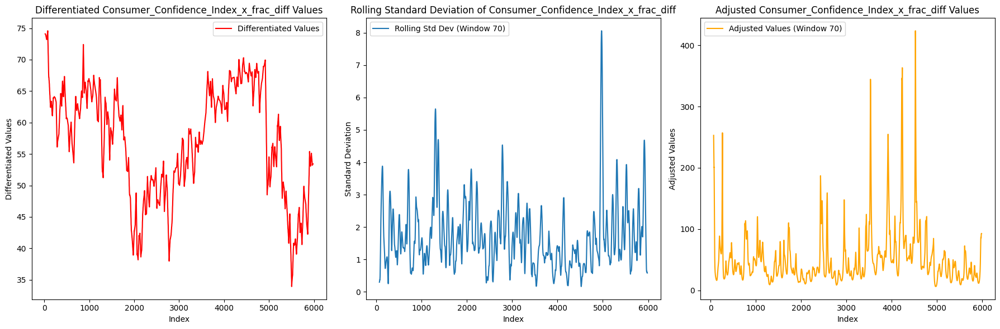

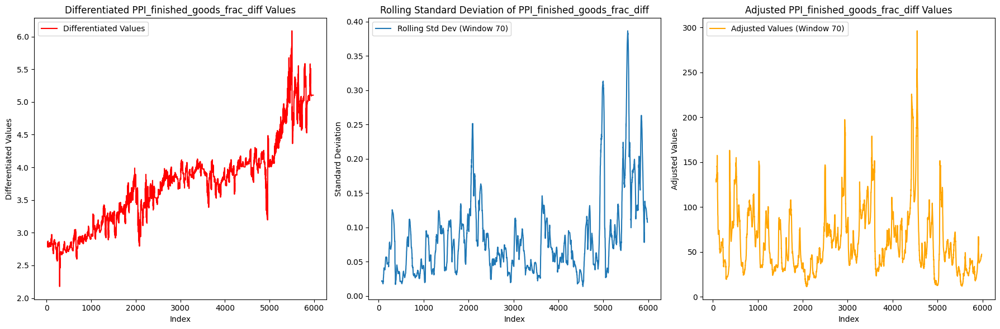

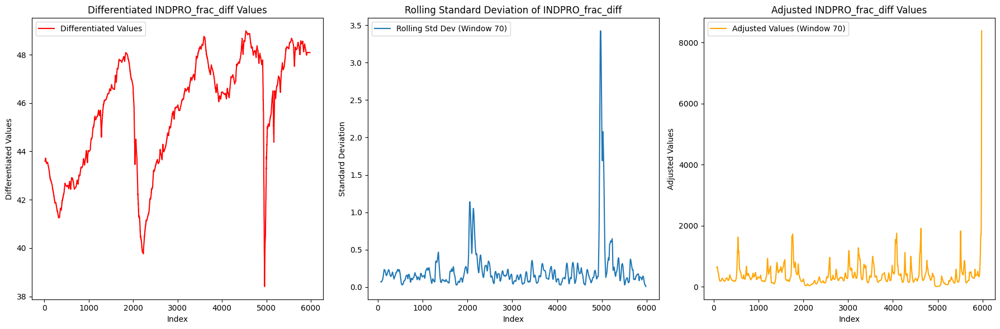

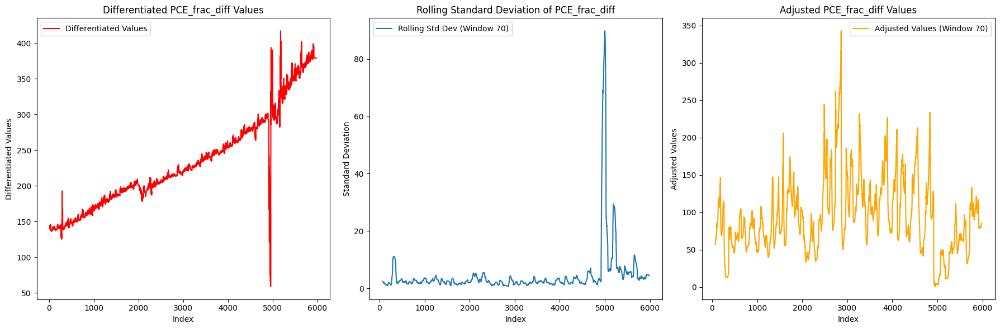

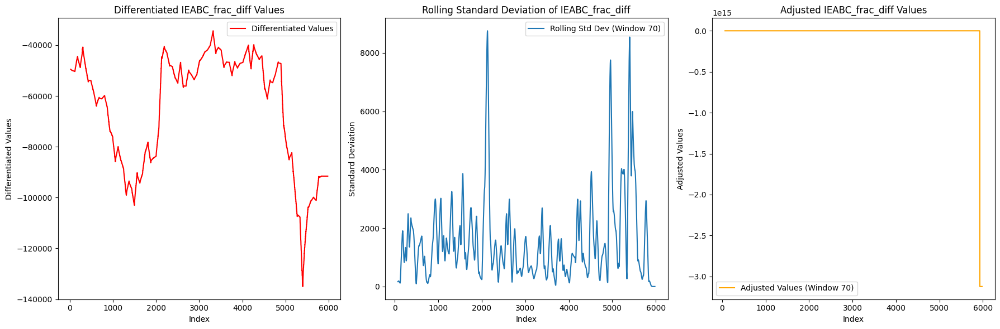

...

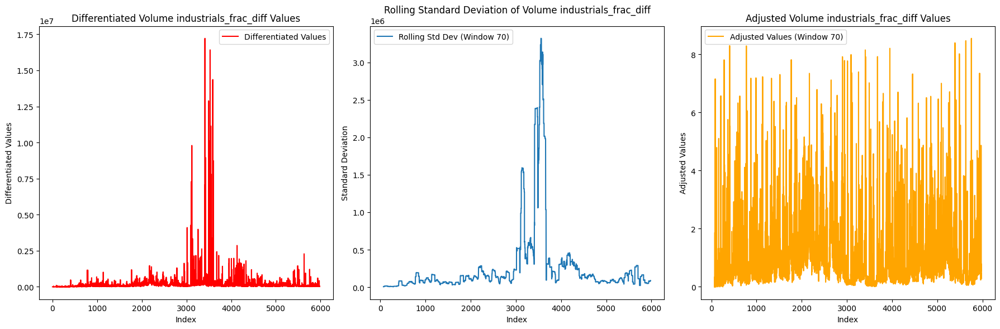

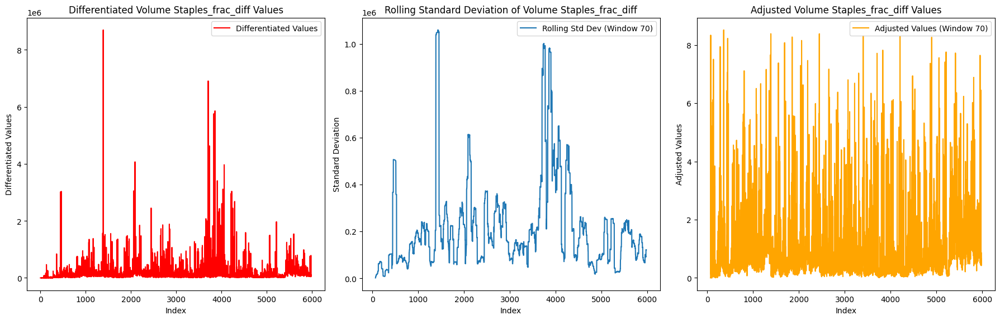

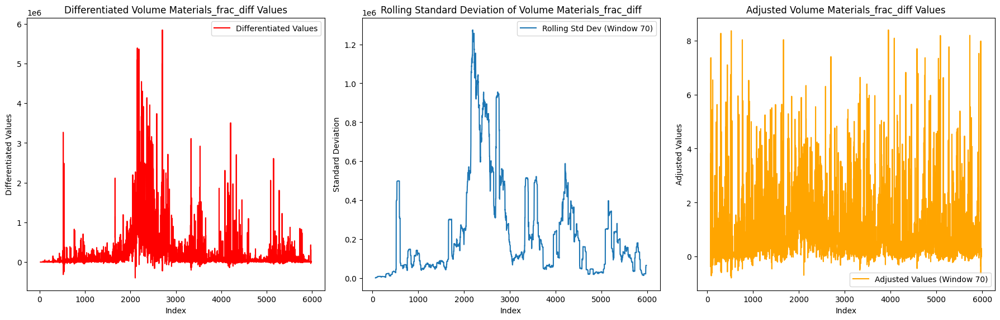

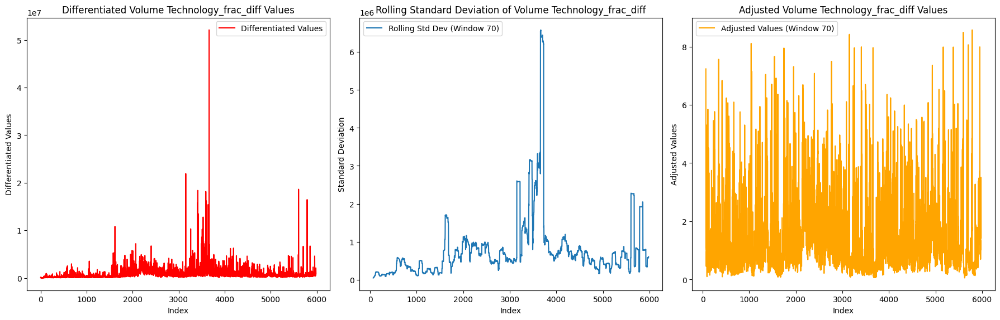

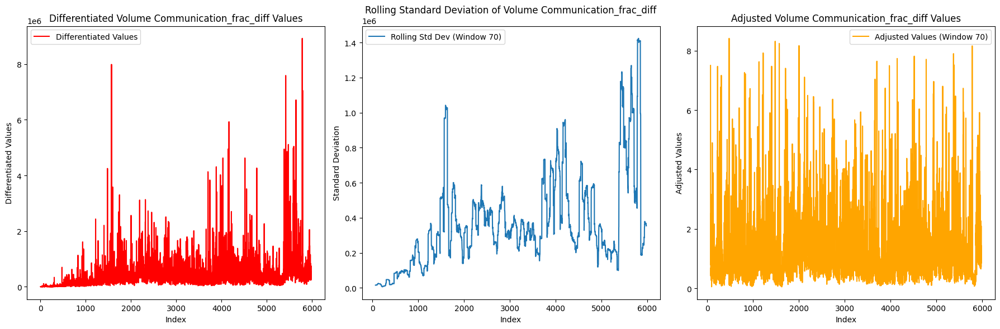

In [ ]:
# Plot the standard deviation and adjusted values for each feature
for feature in all_features:

    std_column = f'{feature}_std'
    stationary_column = f'{feature}_stationary'

    if std_column in diff_and_stationary_df.columns and stationary_column in diff_and_stationary_df.columns:
        plt.figure(figsize=(18, 6))

        plt.subplot(1, 3, 1)
        plt.plot(diff_and_stationary_df.index, diff_and_stationary_df[feature], label='Differentiated Values', color='red')
        plt.title(f'Differentiated {feature} Values')
        plt.xlabel('Index')
        plt.ylabel('Differentiated Values')
        plt.legend()

        plt.subplot(1, 3, 2)
        plt.plot(diff_and_stationary_df.index, diff_and_stationary_df[std_column], label='Rolling Std Dev (Window 70)')
        plt.title(f'Rolling Standard Deviation of {feature}')
        plt.xlabel('Index')
        plt.ylabel('Standard Deviation')
        plt.legend()

        plt.subplot(1, 3, 3)
        plt.plot(diff_and_stationary_df.index, diff_and_stationary_df[stationary_column], label='Adjusted Values (Window 70)', color='orange')
        plt.title(f'Adjusted {feature} Values')
        plt.xlabel('Index')
        plt.ylabel('Adjusted Values')
        plt.legend()

        plt.tight_layout()
        plt.show()

In [ ]:
diff_and_stationary_df

,Consumer_Confidence_Index_x_frac_diff,PPI_finished_goods_frac_diff,INDPRO_frac_diff,PCE_frac_diff,IEABC_frac_diff,PI_frac_diff,TCU_frac_diff,ISM_manufacturing_frac_diff,durable_goods_orders_frac_diff,Building_Permits_frac_diff,...,Volume utilities_frac_diff_stationary,Volume Discretionary_frac_diff_stationary,Volume Energy_frac_diff_stationary,Volume Financials_frac_diff_stationary,Volume Healthcare_frac_diff_stationary,Volume industrials_frac_diff_stationary,Volume Staples_frac_diff_stationary,Volume Materials_frac_diff_stationary,Volume Technology_frac_diff_stationary,Volume Communication_frac_diff_stationary
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,51.409676,-8.196774,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,51.158066,-6.880645,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,51.074192,-6.441936,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,50.990322,-6.003226,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,50.906452,-5.564516,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5977,53.405869,5.103055,48.087858,378.957139,-91545.750298,967.690403,36.77361,50.299999,2.600000,295437.883289,...,2.997563,0.507846,3.310115,0.125569,0.551514,0.322823,0.874237,-0.011411,2.532257,1.236548
5978,53.409621,5.103055,48.087858,378.957139,-91545.750298,967.690403,36.77361,50.299999,2.600000,295437.883289,...,0.783474,3.872077,4.539140,0.138128,0.681618,0.464605,0.716521,0.097078,3.506658,0.925284
5979,53.412895,5.103055,48.087858,378.957139,-91545.750298,967.690403,36.77361,50.299999,2.600000,295437.883289,...,0.677326,0.892891,3.316750,0.241695,0.375464,0.308187,0.423133,0.305248,3.016753,1.357308
5980,53.415732,5.103055,48.087858,378.957139,-91545.750298,967.690403,36.77361,50.299999,2.600000,295437.883289,...,1.178242,0.916737,2.417855,0.051487,0.300895,0.306698,0.479577,0.012589,2.187314,0.844851


In [ ]:
nan_counts = diff_and_stationary_df.isna().sum()
print(nan_counts)

Consumer_Confidence_Index_x_frac_diff        20
PPI_finished_goods_frac_diff                 20
INDPRO_frac_diff                             20
PCE_frac_diff                                20
IEABC_frac_diff                              20
                                             ..
Volume industrials_frac_diff_stationary      69
Volume Staples_frac_diff_stationary          69
Volume Materials_frac_diff_stationary        69
Volume Technology_frac_diff_stationary       69
Volume Communication_frac_diff_stationary    69
Length: 114, dtype: int64


In [ ]:
infinite_counts = np.isinf(diff_and_stationary_df).sum()
print("Number of infinite values in each feature:")
print(infinite_counts)

Number of infinite values in each feature:
Consumer_Confidence_Index_x_frac_diff        0
PPI_finished_goods_frac_diff                 0
INDPRO_frac_diff                             0
PCE_frac_diff                                0
IEABC_frac_diff                              0
                                            ..
Volume industrials_frac_diff_stationary      0
Volume Staples_frac_diff_stationary          0
Volume Materials_frac_diff_stationary        0
Volume Technology_frac_diff_stationary       0
Volume Communication_frac_diff_stationary    0
Length: 114, dtype: int64


# Applying Model on Differenciated Data + standard Deviation

In [ ]:
# Initialize a DataFrame to store the stationary values
stationary_columns = []
# Loop through each original feature in the DataFrame
for feature in original_features:
    differentiated_column = f'{feature}_frac_diff'
    stationary_column = f'{differentiated_column}_stationary'

    if stationary_column in diff_and_stationary_df.columns:
        stationary_columns.append(stationary_column)

# Create a new DataFrame containing only the stationary columns
stationary_df = diff_and_stationary_df[stationary_columns].copy()

# Display the stationary DataFrame
stationary_df

,Consumer_Confidence_Index_x_frac_diff_stationary,PPI_finished_goods_frac_diff_stationary,INDPRO_frac_diff_stationary,PCE_frac_diff_stationary,IEABC_frac_diff_stationary,PI_frac_diff_stationary,TCU_frac_diff_stationary,ISM_manufacturing_frac_diff_stationary,durable_goods_orders_frac_diff_stationary,Building_Permits_frac_diff_stationary,...,Volume utilities_frac_diff_stationary,Volume Discretionary_frac_diff_stationary,Volume Energy_frac_diff_stationary,Volume Financials_frac_diff_stationary,Volume Healthcare_frac_diff_stationary,Volume industrials_frac_diff_stationary,Volume Staples_frac_diff_stationary,Volume Materials_frac_diff_stationary,Volume Technology_frac_diff_stationary,Volume Communication_frac_diff_stationary
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5977,92.489194,46.917145,4068.026121,84.579002,-3.122939e+15,365.377334,9229.715821,53.062348,1.225970,44.314595,...,2.997563,0.507846,3.310115,0.125569,0.551514,0.322823,0.874237,-0.011411,2.532257,1.236548
5978,92.739776,47.073497,4690.634542,84.905141,-3.122939e+15,375.990700,11202.061540,53.005376,1.306040,44.577076,...,0.783474,3.872077,4.539140,0.138128,0.681618,0.464605,0.716521,0.097078,3.506658,0.925284
5979,92.842992,47.186656,5502.355581,85.131544,-3.122939e+15,383.362461,13627.216240,53.005076,1.399912,44.874241,...,0.677326,0.892891,3.316750,0.241695,0.375464,0.308187,0.423133,0.305248,3.016753,1.357308
5980,92.828685,47.306938,6632.729398,85.360356,-3.122939e+15,389.036390,16653.917444,53.065376,1.511956,45.219642,...,1.178242,0.916737,2.417855,0.051487,0.300895,0.306698,0.479577,0.012589,2.187314,0.844851


In [ ]:
nan_counts = stationary_df.isna().sum()
print(nan_counts)

Consumer_Confidence_Index_x_frac_diff_stationary    69
PPI_finished_goods_frac_diff_stationary             69
INDPRO_frac_diff_stationary                         69
PCE_frac_diff_stationary                            69
IEABC_frac_diff_stationary                          69
PI_frac_diff_stationary                             69
TCU_frac_diff_stationary                            69
ISM_manufacturing_frac_diff_stationary              69
durable_goods_orders_frac_diff_stationary           69
Building_Permits_frac_diff_stationary               69
Business_Inventories_frac_diff_stationary           69
ECONOMICS_USCPI,_M_df862_frac_diff_stationary       69
Employment_cost_index_frac_diff_stationary          69
Factory_Orders_frac_diff_stationary                 69
Housing_Starts_frac_diff_stationary                 69
New_residential_sales_frac_diff_stationary          69
weekly_claims_frac_diff_stationary                  69
trade_balance_frac_diff_stationary                  69
Adj Close 

In [ ]:
stationary_df=stationary_df.dropna()

In [ ]:
infinite_counts = np.isinf(stationary_df).sum()
print("Number of infinite values in each feature:")
print(infinite_counts)

Number of infinite values in each feature:
Consumer_Confidence_Index_x_frac_diff_stationary    0
PPI_finished_goods_frac_diff_stationary             0
INDPRO_frac_diff_stationary                         0
PCE_frac_diff_stationary                            0
IEABC_frac_diff_stationary                          0
PI_frac_diff_stationary                             0
TCU_frac_diff_stationary                            0
ISM_manufacturing_frac_diff_stationary              0
durable_goods_orders_frac_diff_stationary           0
Building_Permits_frac_diff_stationary               0
Business_Inventories_frac_diff_stationary           0
ECONOMICS_USCPI,_M_df862_frac_diff_stationary       0
Employment_cost_index_frac_diff_stationary          0
Factory_Orders_frac_diff_stationary                 0
Housing_Starts_frac_diff_stationary                 0
New_residential_sales_frac_diff_stationary          0
weekly_claims_frac_diff_stationary                  0
trade_balance_frac_diff_stationary     

In [ ]:
stationary_df

,Consumer_Confidence_Index_x_frac_diff_stationary,PPI_finished_goods_frac_diff_stationary,INDPRO_frac_diff_stationary,PCE_frac_diff_stationary,IEABC_frac_diff_stationary,PI_frac_diff_stationary,TCU_frac_diff_stationary,ISM_manufacturing_frac_diff_stationary,durable_goods_orders_frac_diff_stationary,Building_Permits_frac_diff_stationary,...,Volume utilities_frac_diff_stationary,Volume Discretionary_frac_diff_stationary,Volume Energy_frac_diff_stationary,Volume Financials_frac_diff_stationary,Volume Healthcare_frac_diff_stationary,Volume industrials_frac_diff_stationary,Volume Staples_frac_diff_stationary,Volume Materials_frac_diff_stationary,Volume Technology_frac_diff_stationary,Volume Communication_frac_diff_stationary
69,252.961728,130.078478,632.322572,56.953821,-2.974674e+02,378.249375,270.604852,67.241122,-0.421987,108.869493,...,0.836746,0.291192,0.097668,0.507743,1.157869,0.000000,0.000000,-0.368487,7.237118,7.501212
70,247.650449,128.328686,635.402654,57.958189,-2.952207e+02,381.775389,267.759646,69.887158,-0.211964,101.869601,...,0.106496,0.000000,0.574739,0.153582,0.654772,0.329355,0.000000,-0.087680,4.572173,0.798537
71,242.015402,127.845729,638.557855,58.075550,-2.932015e+02,384.511415,265.444849,72.075359,-0.140856,96.799233,...,0.649239,0.583883,0.523166,-0.052011,1.371575,0.000000,0.359389,-0.198242,1.066647,1.235157
72,236.363586,128.907790,641.814757,58.484767,-2.914061e+02,387.662279,263.355114,74.354561,-0.066789,93.008353,...,2.467198,0.292287,0.266104,0.031889,1.351606,0.000000,0.540424,3.815238,4.738996,2.511993
73,230.682061,130.073933,645.157999,58.906426,-2.897707e+02,390.724696,261.441518,76.719653,0.009954,89.889875,...,1.385891,0.589093,0.347391,0.139820,6.540430,0.164718,8.336023,-0.385175,2.204897,2.342908
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5977,92.489194,46.917145,4068.026121,84.579002,-3.122939e+15,365.377334,9229.715821,53.062348,1.225970,44.314595,...,2.997563,0.507846,3.310115,0.125569,0.551514,0.322823,0.874237,-0.011411,2.532257,1.236548
5978,92.739776,47.073497,4690.634542,84.905141,-3.122939e+15,375.990700,11202.061540,53.005376,1.306040,44.577076,...,0.783474,3.872077,4.539140,0.138128,0.681618,0.464605,0.716521,0.097078,3.506658,0.925284
5979,92.842992,47.186656,5502.355581,85.131544,-3.122939e+15,383.362461,13627.216240,53.005076,1.399912,44.874241,...,0.677326,0.892891,3.316750,0.241695,0.375464,0.308187,0.423133,0.305248,3.016753,1.357308
5980,92.828685,47.306938,6632.729398,85.360356,-3.122939e+15,389.036390,16653.917444,53.065376,1.511956,45.219642,...,1.178242,0.916737,2.417855,0.051487,0.300895,0.306698,0.479577,0.012589,2.187314,0.844851


# Manual min_max Normalization

In [ ]:
import pandas as pd
import numpy as np

def manual_min_max_scaler(df):
    # Initialize lists to store min and max values for each feature
    min_values = []
    max_values = []

    # Create a copy of the DataFrame to avoid modifying the original
    df_scaled = df.copy()

    # Iterate over each column (feature) in the DataFrame
    for column in df.columns:
        # Calculate the min and max values for the current column
        min_val = df[column].min()
        max_val = df[column].max()

        # Append the min and max values to the lists
        min_values.append(min_val)
        max_values.append(max_val)

        # Apply the scaling formula to each value in the column
        df_scaled[column] = (df[column] - min_val) / (max_val - min_val)

    # Create DataFrames for min and max values
    df_min = pd.DataFrame([min_values], columns=df.columns, index=['min'])
    df_max = pd.DataFrame([max_values], columns=df.columns, index=['max'])

    # Concatenate the original DataFrame with the min and max values
    df_with_min_max = pd.concat([df, df_min, df_max])

    # Return the scaled data and the DataFrame with min and max values
    return df_scaled, df_with_min_max

In [ ]:
# Apply the manual scaler function
Normal_data, df_with_min_max = manual_min_max_scaler(stationary_df)
df_with_min_max

,Consumer_Confidence_Index_x_frac_diff_stationary,PPI_finished_goods_frac_diff_stationary,INDPRO_frac_diff_stationary,PCE_frac_diff_stationary,IEABC_frac_diff_stationary,PI_frac_diff_stationary,TCU_frac_diff_stationary,ISM_manufacturing_frac_diff_stationary,durable_goods_orders_frac_diff_stationary,Building_Permits_frac_diff_stationary,...,Volume utilities_frac_diff_stationary,Volume Discretionary_frac_diff_stationary,Volume Energy_frac_diff_stationary,Volume Financials_frac_diff_stationary,Volume Healthcare_frac_diff_stationary,Volume industrials_frac_diff_stationary,Volume Staples_frac_diff_stationary,Volume Materials_frac_diff_stationary,Volume Technology_frac_diff_stationary,Volume Communication_frac_diff_stationary
69,252.961728,130.078478,632.322572,56.953821,-2.974674e+02,378.249375,270.604852,67.241122,-0.421987,108.869493,...,0.836746,0.291192,0.097668,0.507743,1.157869,0.000000,0.000000,-0.368487,7.237118,7.501212
70,247.650449,128.328686,635.402654,57.958189,-2.952207e+02,381.775389,267.759646,69.887158,-0.211964,101.869601,...,0.106496,0.000000,0.574739,0.153582,0.654772,0.329355,0.000000,-0.087680,4.572173,0.798537
71,242.015402,127.845729,638.557855,58.075550,-2.932015e+02,384.511415,265.444849,72.075359,-0.140856,96.799233,...,0.649239,0.583883,0.523166,-0.052011,1.371575,0.000000,0.359389,-0.198242,1.066647,1.235157
72,236.363586,128.907790,641.814757,58.484767,-2.914061e+02,387.662279,263.355114,74.354561,-0.066789,93.008353,...,2.467198,0.292287,0.266104,0.031889,1.351606,0.000000,0.540424,3.815238,4.738996,2.511993
73,230.682061,130.073933,645.157999,58.906426,-2.897707e+02,390.724696,261.441518,76.719653,0.009954,89.889875,...,1.385891,0.589093,0.347391,0.139820,6.540430,0.164718,8.336023,-0.385175,2.204897,2.342908
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5979,92.842992,47.186656,5502.355581,85.131544,-3.122939e+15,383.362461,13627.216240,53.005076,1.399912,44.874241,...,0.677326,0.892891,3.316750,0.241695,0.375464,0.308187,0.423133,0.305248,3.016753,1.357308
5980,92.828685,47.306938,6632.729398,85.360356,-3.122939e+15,389.036390,16653.917444,53.065376,1.511956,45.219642,...,1.178242,0.916737,2.417855,0.051487,0.300895,0.306698,0.479577,0.012589,2.187314,0.844851
5981,92.719231,47.448093,8382.283332,85.617906,-3.122939e+15,393.613705,20400.787740,53.190926,1.648808,45.622038,...,2.294494,1.213228,2.503002,2.023302,0.753057,0.287784,0.655593,0.031382,1.423322,2.087159
min,6.184189,11.600157,11.705525,0.854205,-3.122939e+15,1.770245,11.722295,8.146692,-5.564114,4.429676,...,0.000000,0.000000,0.007416,-0.737941,0.016670,0.000000,0.000000,-0.797027,0.051501,0.052053


In [ ]:
Normal_data

,Consumer_Confidence_Index_x_frac_diff_stationary,PPI_finished_goods_frac_diff_stationary,INDPRO_frac_diff_stationary,PCE_frac_diff_stationary,IEABC_frac_diff_stationary,PI_frac_diff_stationary,TCU_frac_diff_stationary,ISM_manufacturing_frac_diff_stationary,durable_goods_orders_frac_diff_stationary,Building_Permits_frac_diff_stationary,...,Volume utilities_frac_diff_stationary,Volume Discretionary_frac_diff_stationary,Volume Energy_frac_diff_stationary,Volume Financials_frac_diff_stationary,Volume Healthcare_frac_diff_stationary,Volume industrials_frac_diff_stationary,Volume Staples_frac_diff_stationary,Volume Materials_frac_diff_stationary,Volume Technology_frac_diff_stationary,Volume Communication_frac_diff_stationary
69,0.591126,0.416332,0.074143,0.163947,1.0,0.299677,0.012697,0.078544,0.471059,0.629920,...,0.097598,0.034248,0.010420,0.137093,0.131162,0.000000,0.000000,0.046599,0.842985,0.891101
70,0.578404,0.410183,0.074511,0.166882,1.0,0.302483,0.012558,0.082061,0.490299,0.587701,...,0.012422,0.000000,0.065500,0.098116,0.073339,0.038544,0.000000,0.077133,0.530345,0.089298
71,0.564906,0.408486,0.074888,0.167225,1.0,0.304661,0.012444,0.084969,0.496813,0.557119,...,0.075727,0.068673,0.059546,0.075490,0.155724,0.000000,0.042204,0.065111,0.119092,0.141528
72,0.551368,0.412218,0.075277,0.168421,1.0,0.307169,0.012342,0.087999,0.503598,0.534255,...,0.287775,0.034377,0.029867,0.084723,0.153428,0.000000,0.063464,0.501528,0.549916,0.294269
73,0.537758,0.416316,0.075676,0.169653,1.0,0.309607,0.012248,0.091142,0.510629,0.515446,...,0.161651,0.069286,0.039252,0.096602,0.749796,0.019277,0.978928,0.044784,0.252627,0.274042
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5977,0.206733,0.124104,0.484593,0.244679,0.0,0.289431,0.452105,0.059699,0.622025,0.240563,...,0.349637,0.059730,0.381311,0.095033,0.061471,0.037780,0.102665,0.085426,0.291031,0.141694
5978,0.207334,0.124653,0.558973,0.245632,0.0,0.297879,0.548840,0.059623,0.629360,0.242146,...,0.091385,0.455410,0.523207,0.096415,0.076425,0.054373,0.084144,0.097223,0.405344,0.104460
5979,0.207581,0.125051,0.655946,0.246294,0.0,0.303747,0.667784,0.059622,0.637960,0.243938,...,0.079004,0.105016,0.382077,0.107813,0.041237,0.036067,0.049690,0.119859,0.347870,0.156140
5980,0.207547,0.125473,0.790988,0.246963,0.0,0.308263,0.816231,0.059703,0.648224,0.246021,...,0.137431,0.107821,0.278295,0.086880,0.032667,0.035893,0.056318,0.088036,0.250564,0.094838


# LSTM MODEL


In [ ]:
import numpy as np

def create_sequences(data, L, T, Index_pred, Index_input):
    T = T + 1
    X, y = [], []
    for i in range(len(data) - L - T + 1):
        X.append(data[i:(i + L), Index_input])  # Selecting the input variables
        y.append(data[(i + L + T - 1), Index_pred])  # Selecting the target variables T time steps ahead

    return np.array(X), np.array(y)

In [ ]:
# Assuming df is your pandas DataFrame
Normal_data_array= Normal_data.to_numpy()

In [ ]:
Normal_data_array

array([[0.59112645, 0.416332  , 0.07414268, ..., 0.0465986 , 0.84298497,
        0.89110076],
       [0.57840391, 0.41018324, 0.07451064, ..., 0.07713292, 0.53034533,
        0.08929762],
       [0.56490582, 0.40848614, 0.07488758, ..., 0.06511069, 0.1190925 ,
        0.14152804],
       ...,
       [0.20758093, 0.12505071, 0.65594636, ..., 0.11985912, 0.34787032,
        0.15614023],
       [0.20754666, 0.12547338, 0.79098767, ..., 0.08803604, 0.25056419,
        0.09483793],
       [0.20728447, 0.1259694 , 1.        , ..., 0.09007949, 0.160936  ,
        0.24344813]])

In [ ]:
device = 'cuda:0' if torch.cuda.is_available() else 'cpu'
device

'cpu'

In [ ]:
# Assuming correlated_serie' is a numpy array with shape (n_samples, 3) where the last column is the target variable
# Replace 'data' with your actual data
index_pred=[19,20,21,22,23,24,25,26,27]
X, y = create_sequences(Normal_data_array, 10, 1, index_pred , [1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27])

In [ ]:
# Determine the index to split the data for training, testing, and validation
n_train = int(np.ceil(0.7 * len(y)))
n_test = int(np.ceil(0.2 * len(y)))
n_val = len(y) - n_train - n_test

# Ensure that there is enough data for all sets
if n_train < 1 or n_test < 1 or n_val < 1:
    raise ValueError("Invalid split indices. Not enough data for training/testing/validation.")

# Split the data into training, testing, and validation sets
X_train = X[:n_train]
X_test = X[n_train:n_train+n_test]
X_val = X[n_train+n_test:]

# Check if the resulting input arrays are empty
if len(X_train) == 0 or len(X_test) == 0 or len(X_val) == 0:
    raise ValueError("Empty input arrays after splitting the data.")

# Split the target data accordingly
y_train = y[:n_train]
y_test = y[n_train:n_train+n_test]
y_val = y[n_train+n_test:]

# Check if the resulting target arrays are empty
if len(y_train) == 0 or len(y_test) == 0 or len(y_val) == 0:
    raise ValueError("Empty target arrays. Please check your data and splitting indices.")

# Determine the length of the input
length_input = X_train.shape[2]
output_size =  y_train.shape[1]

In [ ]:
y_train

array([[0.23027392, 0.36400554, 0.28633967, ..., 0.20373456, 0.21799522,
        0.20631819],
       [0.23341043, 0.36641385, 0.26928531, ..., 0.2054457 , 0.22017454,
        0.21246932],
       [0.23997552, 0.39476624, 0.24376513, ..., 0.21064194, 0.11478975,
        0.21683291],
       ...,
       [0.83756939, 0.59124194, 0.54623333, ..., 0.65533101, 0.79063967,
        0.31973906],
       [0.8873385 , 0.61350783, 0.5562926 , ..., 0.67718333, 0.81157915,
        0.32468444],
       [0.89686256, 0.61143105, 0.56211308, ..., 0.69115127, 0.79514532,
        0.32704513]])

In [ ]:
from torch.utils.data import Dataset

class TimeSeriesDataset(Dataset):
    def __init__(self, X, y):
        self.X = X
        self.y = y

    def __len__(self):
        return len(self.X)

    def __getitem__(self, i):
        return self.X[i], self.y[i]

In [ ]:
# Using X_train and y_train from the previous step

X_train_tensor = torch.FloatTensor(X_train)
y_train_tensor = torch.FloatTensor(y_train)

X_test_tensor = torch.FloatTensor(X_test)
y_test_tensor = torch.FloatTensor(y_test)

train_dataset = TimeSeriesDataset(X_train_tensor, y_train_tensor)
test_dataset = TimeSeriesDataset(X_test_tensor , y_test_tensor)

In [ ]:
X_train_tensor

tensor([[[0.4163, 0.0741, 0.1639,  ..., 0.1709, 0.2589, 0.2185],
         [0.4102, 0.0745, 0.1669,  ..., 0.1750, 0.2229, 0.2318],
         [0.4085, 0.0749, 0.1672,  ..., 0.1763, 0.1896, 0.2295],
         ...,
         [0.4112, 0.0770, 0.1741,  ..., 0.2302, 0.2717, 0.2426],
         [0.4144, 0.0774, 0.1753,  ..., 0.2016, 0.2070, 0.2047],
         [0.4155, 0.0777, 0.1780,  ..., 0.1910, 0.2572, 0.2119]],

        [[0.4102, 0.0745, 0.1669,  ..., 0.1750, 0.2229, 0.2318],
         [0.4085, 0.0749, 0.1672,  ..., 0.1763, 0.1896, 0.2295],
         [0.4122, 0.0753, 0.1684,  ..., 0.2110, 0.1060, 0.2026],
         ...,
         [0.4144, 0.0774, 0.1753,  ..., 0.2016, 0.2070, 0.2047],
         [0.4155, 0.0777, 0.1780,  ..., 0.1910, 0.2572, 0.2119],
         [0.4177, 0.0778, 0.1797,  ..., 0.1879, 0.2480, 0.2216]],

        [[0.4085, 0.0749, 0.1672,  ..., 0.1763, 0.1896, 0.2295],
         [0.4122, 0.0753, 0.1684,  ..., 0.2110, 0.1060, 0.2026],
         [0.4163, 0.0757, 0.1697,  ..., 0.2179, 0.2048, 0.

In [ ]:
y_train_tensor

tensor([[0.2303, 0.3640, 0.2863,  ..., 0.2037, 0.2180, 0.2063],
        [0.2334, 0.3664, 0.2693,  ..., 0.2054, 0.2202, 0.2125],
        [0.2400, 0.3948, 0.2438,  ..., 0.2106, 0.1148, 0.2168],
        ...,
        [0.8376, 0.5912, 0.5462,  ..., 0.6553, 0.7906, 0.3197],
        [0.8873, 0.6135, 0.5563,  ..., 0.6772, 0.8116, 0.3247],
        [0.8969, 0.6114, 0.5621,  ..., 0.6912, 0.7951, 0.3270]])

In [ ]:
from torch.utils.data import DataLoader

batch_size = 80

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

In [ ]:
class LSTM(nn.Module):
    def __init__(self, input_size, hidden_size, num_stacked_layers, output_size):
        super().__init__()
        self.hidden_size = hidden_size
        self.num_stacked_layers = num_stacked_layers

        self.lstm = nn.LSTM(input_size, hidden_size, num_stacked_layers,dropout=0.01,
                            batch_first=True)

        self.fc = nn.Linear(hidden_size, output_size)
        self.activation = nn.ReLU()

    def forward(self, x):
        batch_size = x.size(0)
        h0 = torch.zeros(self.num_stacked_layers, batch_size, self.hidden_size).to(device)
        c0 = torch.zeros(self.num_stacked_layers, batch_size, self.hidden_size).to(device)

        out, _ = self.lstm(x, (h0, c0))
        out = self.fc(out[:, -1, :])
        return out

In [ ]:
model = LSTM(length_input, 40, 2, output_size)
model.to(device)
model

LSTM(
  (lstm): LSTM(27, 40, num_layers=2, batch_first=True, dropout=0.01)
  (fc): Linear(in_features=40, out_features=9, bias=True)
  (activation): ReLU()
)

In [ ]:
def train_one_epoch():
    model.train()  # Set the model to training mode
    print(f'Epoch: {epoch + 1}')
    running_loss = 0.0

    if len(train_loader.dataset) == 0:
        print("Training dataset is empty.")
        return

    batch_count = len(train_loader)
    if batch_count == 0:
        print("Batch count is zero.")
        return

    for batch_index, batch in enumerate(train_loader):
        x_batch, y_batch = batch[0].to(device), batch[1].to(device)

        output = model(x_batch)
        loss = loss_function(output, y_batch)
        running_loss += loss.item()

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        if (batch_index + 1) % 100 == 0 or batch_index + 1 == batch_count:
            avg_loss_across_batches = running_loss / (batch_index + 1)
            print('Batch {0}/{1}, Loss: {2:.3f}'.format(batch_index + 1, batch_count,
                                                        avg_loss_across_batches))
            running_loss = 0.0

    print()

In [ ]:
def validate_one_epoch():
    model.train(False) # evaluation mode
    running_loss = 0.0

    for batch_index, batch in enumerate(test_loader):
        x_batch, y_batch = batch[0].to(device), batch[1].to(device)

        with torch.no_grad():  # no model updates so we don't need gradient
            output = model(x_batch)
            loss = loss_function(output, y_batch)
            running_loss += loss.item()

    avg_loss_across_batches = running_loss / len(test_loader)

    return avg_loss_across_batches

In [ ]:
learning_rate = 0.00001
num_epochs = 1000
loss_function = nn.MSELoss()
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate )

for epoch in range(num_epochs):
    train_one_epoch()
    validation_loss = validate_one_epoch()
    print('Validation Loss: {0:.3f}'.format(validation_loss))

Epoch: 1
Batch 52/52, Loss: 0.217

Validation Loss: 0.256
Epoch: 2
Batch 52/52, Loss: 0.212

Validation Loss: 0.251
Epoch: 3
Batch 52/52, Loss: 0.207

Validation Loss: 0.245
Epoch: 4
Batch 52/52, Loss: 0.202

Validation Loss: 0.240
Epoch: 5
Batch 52/52, Loss: 0.197

Validation Loss: 0.234
Epoch: 6
Batch 52/52, Loss: 0.191

Validation Loss: 0.227
Epoch: 7
Batch 52/52, Loss: 0.185

Validation Loss: 0.221
Epoch: 8
Batch 52/52, Loss: 0.179

Validation Loss: 0.213
Epoch: 9
Batch 52/52, Loss: 0.172

Validation Loss: 0.205
Epoch: 10
Batch 52/52, Loss: 0.164

Validation Loss: 0.196
Epoch: 11
Batch 52/52, Loss: 0.156

Validation Loss: 0.186
Epoch: 12
Batch 52/52, Loss: 0.147

Validation Loss: 0.175
Epoch: 13
Batch 52/52, Loss: 0.137

Validation Loss: 0.163
Epoch: 14
Batch 52/52, Loss: 0.126

Validation Loss: 0.150
Epoch: 15
Batch 52/52, Loss: 0.114

Validation Loss: 0.136
Epoch: 16
Batch 52/52, Loss: 0.101

Validation Loss: 0.120
Epoch: 17
Batch 52/52, Loss: 0.088

Validation Loss: 0.104
Epoch:

In [ ]:
model.parameters()

<generator object Module.parameters at 0x7d7db9c37c30>

In [ ]:
with torch.no_grad():
    predicted = model(X_test_tensor.to(device)).to('cpu').numpy()

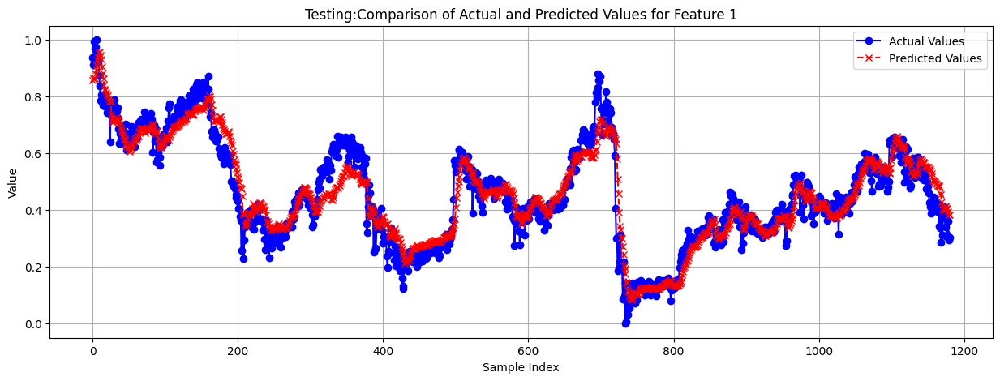

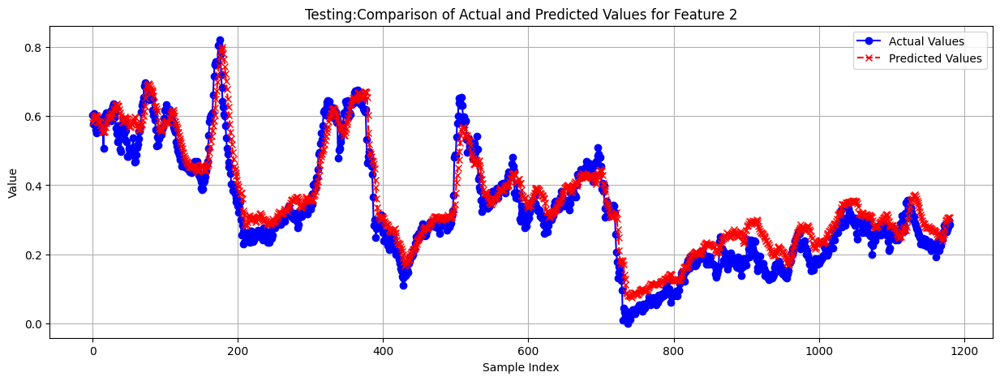

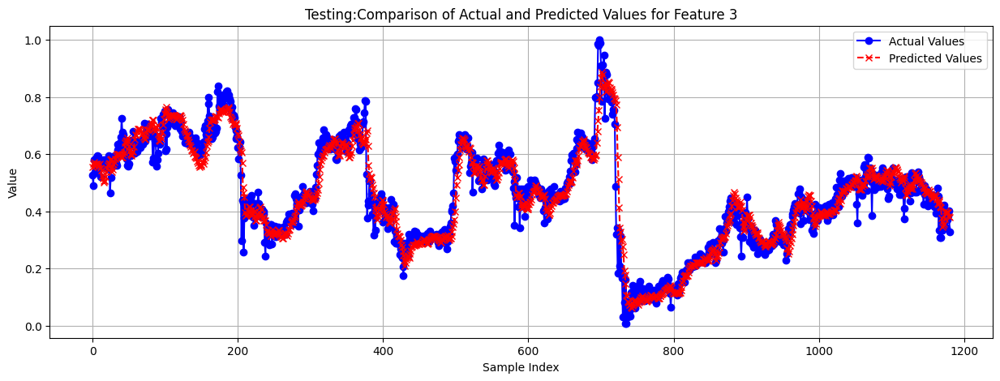

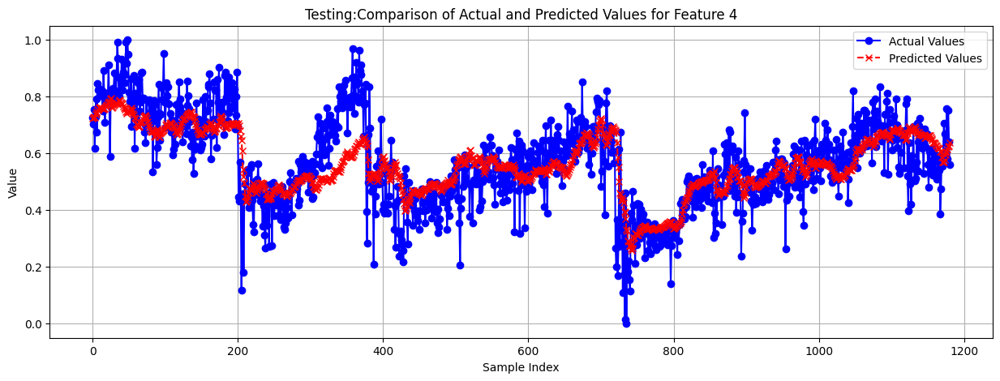

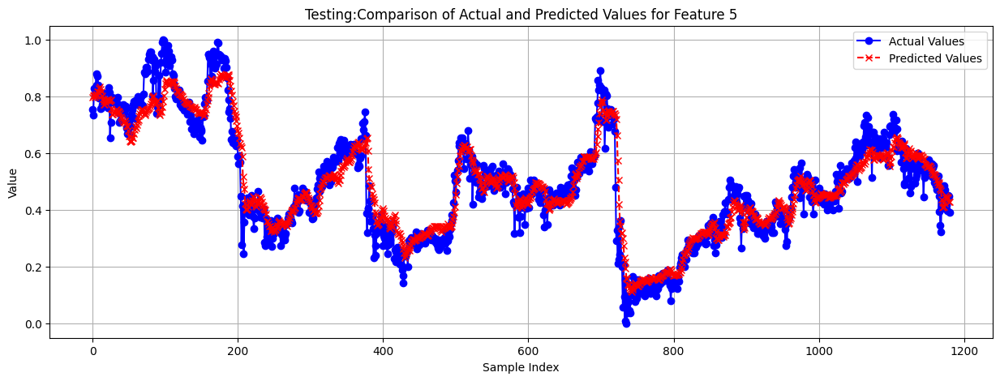

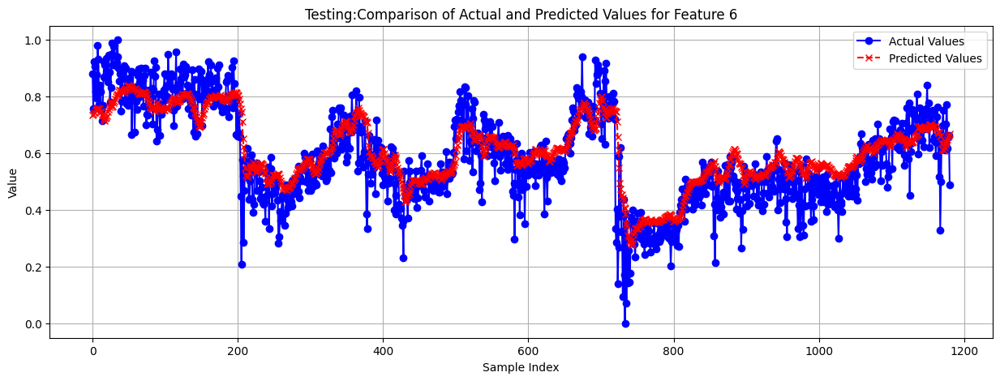

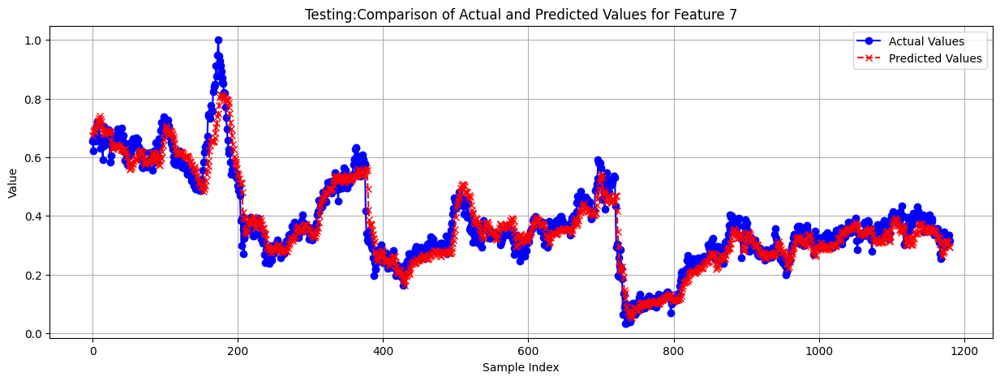

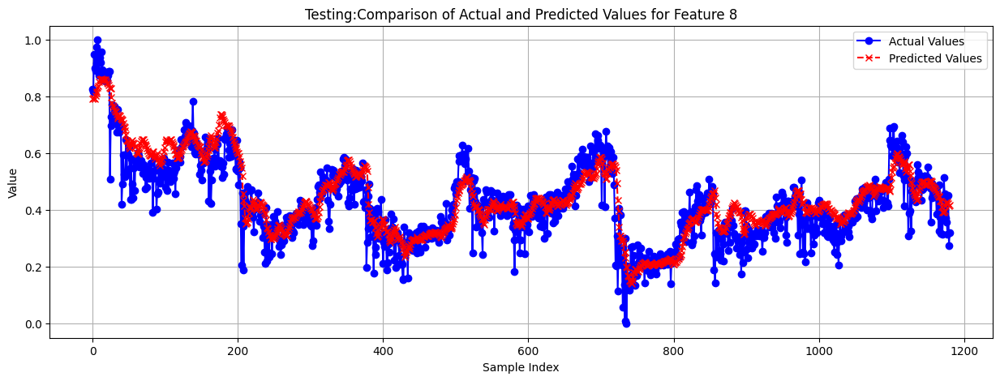

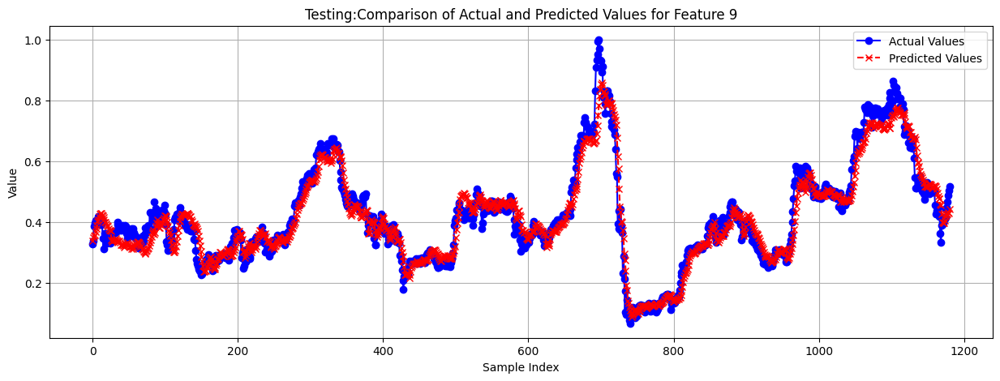

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Assuming predicted and y_test are numpy arrays with shape (n_samples, n_features)

num_features = predicted.shape[1]

for i in range(num_features):
    plt.figure(figsize=(15, 5))
    plt.plot(y_test[:, i], label='Actual Values', color='blue', marker='o')
    plt.plot(predicted[:, i], label='Predicted Values', color='red', linestyle='--', marker='x')
    plt.title(f'Testing:Comparison of Actual and Predicted Values for Feature {i+1}')
    plt.xlabel('Sample Index')
    plt.ylabel('Value')
    plt.legend()
    plt.grid(True)
    plt.show()

In [ ]:
num_features = predicted.shape[1]
num_features

3

In [ ]:
y_test

array([[0.93895297, 0.60196929, 0.52806953],
       [0.91333836, 0.57764477, 0.49106868],
       [0.99370128, 0.60649331, 0.58209796],
       ...,
       [0.36052079, 0.27838511, 0.38627931],
       [0.29543842, 0.29714227, 0.40229396],
       [0.30337726, 0.28598934, 0.32817592]])

In [ ]:
predicted

array([[0.6516101 , 0.66529036, 0.65597576],
       [0.6567364 , 0.67188436, 0.66089404],
       [0.6558524 , 0.66946656, 0.65832585],
       ...,
       [0.4090526 , 0.39273423, 0.39824176],
       [0.3610692 , 0.34602755, 0.35359585],
       [0.32553923, 0.31467953, 0.32115003]], dtype=float32)

# Hyperparameter Tunning

In [ ]:
pip install optuna -q

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 380.1/380.1 kB 5.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 233.4/233.4 kB 21.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.6/78.6 kB 9.0 MB/s eta 0:00:00


In [ ]:
import optuna

def objective(trial, model, optimizer, criterion, train_one_epoch, validate_one_epoch, num_epochs, input_size, output_size, device):
    # Hyperparameter sampling
    optimizer_name = trial.suggest_categorical("optimizer", ["Adam", "SGD"])
    hidden_size = trial.suggest_int("hidden_size", 40, 60,80)
    num_stacked_layers = trial.suggest_int("num_stacked_layers", 2, 4,6)
    learning_rate = trial.suggest_float("learning_rate", 1e-5, 1e-2, log=True)

    # Update model parameters
    model.hidden_size = hidden_size
    model.num_stacked_layers = num_stacked_layers
    model.lstm = nn.LSTM(input_size, hidden_size, num_stacked_layers, dropout=0.01, batch_first=True)
    model.fc = nn.Linear(hidden_size, output_size)
    model.activation = nn.ReLU()

    # Define optimizer
    optimizer = getattr(optim, optimizer_name)(model.parameters(), lr=learning_rate)

    # Training loop
    for epoch in range(num_epochs):
        train_one_epoch()
        validation_loss = validate_one_epoch()

    return validation_loss


In [ ]:
study = optuna.create_study(
    direction="minimize",  # Use "minimize" for loss-based metrics
    sampler=optuna.samplers.TPESampler(),  # Use TPESampler for example
)

# Define other necessary variables
input_size = X_train.shape[2]
output_size =  y_train.shape[1]  # define the output size of your LSTM model
num_epochs =100  # define the number of epochs for training

# Define your LSTM model, optimizer, and loss function outside the objective function
model = LSTM(input_size, hidden_size=20, num_stacked_layers=1, output_size=output_size).to(device)
optimizer = optim.Adam(model.parameters())
criterion = nn.CrossEntropyLoss()

# Optimize the study
study.optimize(lambda trial: objective(trial, model, optimizer, criterion, train_one_epoch, validate_one_epoch, num_epochs, input_size, output_size, device), n_trials=100)

[I 2024-06-19 14:59:13,343] A new study created in memory with name: no-name-98621e89-bb18-4228-b19e-a695515666fe
<ipython-input-77-e04c0f9fe4ea>:6: FutureWarning: suggest_int() got {'step'} as positional arguments but they were expected to be given as keyword arguments.
  hidden_size = trial.suggest_int("hidden_size", 40, 60,80)
<ipython-input-77-e04c0f9fe4ea>:7: FutureWarning: suggest_int() got {'step'} as positional arguments but they were expected to be given as keyword arguments.
  num_stacked_layers = trial.suggest_int("num_stacked_layers", 2, 4,6)
/usr/local/lib/python3.10/dist-packages/optuna/distributions.py:700: UserWarning: The distribution is specified by [2, 4] and step=6, but the range is not divisible by `step`. It will be replaced by [2, 2].
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torch/nn/modules/loss.py:535: UserWarning: Using a target size (torch.Size([60, 1])) that is different to the input size (torch.Size([60, 3])). This will likely lead to incorr

Epoch: 1000


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/loss.py:535: UserWarning: Using a target size (torch.Size([52, 1])) that is different to the input size (torch.Size([52, 3])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/usr/local/lib/python3.10/dist-packages/torch/nn/modules/loss.py:535: UserWarning: Using a target size (torch.Size([41, 1])) that is different to the input size (torch.Size([41, 3])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Batch 69/69, Loss: 0.140

Epoch: 1000
Batch 69/69, Loss: 0.140

Epoch: 1000
Batch 69/69, Loss: 0.140

Epoch: 1000
Batch 69/69, Loss: 0.140

Epoch: 1000
Batch 69/69, Loss: 0.140

Epoch: 1000
Batch 69/69, Loss: 0.140

Epoch: 1000
Batch 69/69, Loss: 0.140

Epoch: 1000
Batch 69/69, Loss: 0.140

Epoch: 1000
Batch 69/69, Loss: 0.140

Epoch: 1000
Batch 69/69, Loss: 0.140

Epoch: 1000
Batch 69/69, Loss: 0.140

Epoch: 1000
Batch 69/69, Loss: 0.140

Epoch: 1000
Batch 69/69, Loss: 0.140

Epoch: 1000
Batch 69/69, Loss: 0.140

Epoch: 1000
Batch 69/69, Loss: 0.140

Epoch: 1000
Batch 69/69, Loss: 0.140

Epoch: 1000
Batch 69/69, Loss: 0.140

Epoch: 1000
Batch 69/69, Loss: 0.140

Epoch: 1000
Batch 69/69, Loss: 0.140

Epoch: 1000
Batch 69/69, Loss: 0.140

Epoch: 1000
Batch 69/69, Loss: 0.140

Epoch: 1000
Batch 69/69, Loss: 0.140

Epoch: 1000
Batch 69/69, Loss: 0.140

Epoch: 1000
Batch 69/69, Loss: 0.140

Epoch: 1000
Batch 69/69, Loss: 0.140

Epoch: 1000
Batch 69/69, Loss: 0.140

Epoch: 1000
Batch 69/69,

[I 2024-06-19 15:00:13,884] Trial 0 finished with value: 0.27295665070414543 and parameters: {'optimizer': 'Adam', 'hidden_size': 40, 'num_stacked_layers': 2, 'learning_rate': 0.0012186494657251395}. Best is trial 0 with value: 0.27295665070414543.


Batch 69/69, Loss: 0.140

Epoch: 1000
Batch 69/69, Loss: 0.202

Epoch: 1000
Batch 69/69, Loss: 0.202

Epoch: 1000
Batch 69/69, Loss: 0.202

Epoch: 1000
Batch 69/69, Loss: 0.202

Epoch: 1000
Batch 69/69, Loss: 0.202

Epoch: 1000
Batch 69/69, Loss: 0.202

Epoch: 1000
Batch 69/69, Loss: 0.202

Epoch: 1000
Batch 69/69, Loss: 0.202

Epoch: 1000
Batch 69/69, Loss: 0.202

Epoch: 1000
Batch 69/69, Loss: 0.202

Epoch: 1000
Batch 69/69, Loss: 0.202

Epoch: 1000
Batch 69/69, Loss: 0.202

Epoch: 1000
Batch 69/69, Loss: 0.202

Epoch: 1000
Batch 69/69, Loss: 0.202

Epoch: 1000
Batch 69/69, Loss: 0.202

Epoch: 1000
Batch 69/69, Loss: 0.202

Epoch: 1000
Batch 69/69, Loss: 0.202

Epoch: 1000
Batch 69/69, Loss: 0.202

Epoch: 1000
Batch 69/69, Loss: 0.202

Epoch: 1000
Batch 69/69, Loss: 0.202

Epoch: 1000
Batch 69/69, Loss: 0.202

Epoch: 1000
Batch 69/69, Loss: 0.202

Epoch: 1000
Batch 69/69, Loss: 0.202

Epoch: 1000
Batch 69/69, Loss: 0.202

Epoch: 1000
Batch 69/69, Loss: 0.202

Epoch: 1000
Batch 69/69,

[I 2024-06-19 15:01:15,220] Trial 1 finished with value: 0.35566863492131234 and parameters: {'optimizer': 'SGD', 'hidden_size': 40, 'num_stacked_layers': 2, 'learning_rate': 0.0010687304430404849}. Best is trial 0 with value: 0.27295665070414543.


Batch 69/69, Loss: 0.202

Epoch: 1000
Batch 69/69, Loss: 0.164

Epoch: 1000
Batch 69/69, Loss: 0.164

Epoch: 1000
Batch 69/69, Loss: 0.164

Epoch: 1000
Batch 69/69, Loss: 0.164

Epoch: 1000
Batch 69/69, Loss: 0.164

Epoch: 1000
Batch 69/69, Loss: 0.164

Epoch: 1000
Batch 69/69, Loss: 0.164

Epoch: 1000
Batch 69/69, Loss: 0.164

Epoch: 1000
Batch 69/69, Loss: 0.164

Epoch: 1000
Batch 69/69, Loss: 0.164

Epoch: 1000
Batch 69/69, Loss: 0.164

Epoch: 1000
Batch 69/69, Loss: 0.164

Epoch: 1000
Batch 69/69, Loss: 0.164

Epoch: 1000
Batch 69/69, Loss: 0.164

Epoch: 1000
Batch 69/69, Loss: 0.164

Epoch: 1000
Batch 69/69, Loss: 0.164

Epoch: 1000
Batch 69/69, Loss: 0.164

Epoch: 1000
Batch 69/69, Loss: 0.164

Epoch: 1000
Batch 69/69, Loss: 0.164

Epoch: 1000
Batch 69/69, Loss: 0.164

Epoch: 1000
Batch 69/69, Loss: 0.164

Epoch: 1000
Batch 69/69, Loss: 0.164

Epoch: 1000
Batch 69/69, Loss: 0.164

Epoch: 1000
Batch 69/69, Loss: 0.164

Epoch: 1000
Batch 69/69, Loss: 0.164

Epoch: 1000
Batch 69/69,

[I 2024-06-19 15:02:15,118] Trial 2 finished with value: 0.30542535446584224 and parameters: {'optimizer': 'SGD', 'hidden_size': 40, 'num_stacked_layers': 2, 'learning_rate': 1.3931006406970141e-05}. Best is trial 0 with value: 0.27295665070414543.


Batch 69/69, Loss: 0.164

Epoch: 1000
Batch 69/69, Loss: 0.182

Epoch: 1000
Batch 69/69, Loss: 0.182

Epoch: 1000
Batch 69/69, Loss: 0.182

Epoch: 1000
Batch 69/69, Loss: 0.182

Epoch: 1000
Batch 69/69, Loss: 0.182

Epoch: 1000
Batch 69/69, Loss: 0.182

Epoch: 1000
Batch 69/69, Loss: 0.182

Epoch: 1000
Batch 69/69, Loss: 0.182

Epoch: 1000
Batch 69/69, Loss: 0.182

Epoch: 1000
Batch 69/69, Loss: 0.182

Epoch: 1000
Batch 69/69, Loss: 0.182

Epoch: 1000
Batch 69/69, Loss: 0.182

Epoch: 1000
Batch 69/69, Loss: 0.182

Epoch: 1000
Batch 69/69, Loss: 0.182

Epoch: 1000
Batch 69/69, Loss: 0.182

Epoch: 1000
Batch 69/69, Loss: 0.182

Epoch: 1000
Batch 69/69, Loss: 0.182

Epoch: 1000
Batch 69/69, Loss: 0.182

Epoch: 1000
Batch 69/69, Loss: 0.182

Epoch: 1000
Batch 69/69, Loss: 0.182

Epoch: 1000
Batch 69/69, Loss: 0.182

Epoch: 1000
Batch 69/69, Loss: 0.182

Epoch: 1000
Batch 69/69, Loss: 0.182

Epoch: 1000
Batch 69/69, Loss: 0.182

Epoch: 1000
Batch 69/69, Loss: 0.182

Epoch: 1000
Batch 69/69,

[I 2024-06-19 15:03:16,682] Trial 3 finished with value: 0.32920035161077976 and parameters: {'optimizer': 'Adam', 'hidden_size': 40, 'num_stacked_layers': 2, 'learning_rate': 5.236221890457786e-05}. Best is trial 0 with value: 0.27295665070414543.


Batch 69/69, Loss: 0.182

Epoch: 1000
Batch 69/69, Loss: 0.156

Epoch: 1000
Batch 69/69, Loss: 0.156

Epoch: 1000
Batch 69/69, Loss: 0.156

Epoch: 1000
Batch 69/69, Loss: 0.156

Epoch: 1000
Batch 69/69, Loss: 0.156

Epoch: 1000
Batch 69/69, Loss: 0.156

Epoch: 1000
Batch 69/69, Loss: 0.156

Epoch: 1000
Batch 69/69, Loss: 0.156

Epoch: 1000
Batch 69/69, Loss: 0.156

Epoch: 1000
Batch 69/69, Loss: 0.156

Epoch: 1000
Batch 69/69, Loss: 0.156

Epoch: 1000
Batch 69/69, Loss: 0.156

Epoch: 1000
Batch 69/69, Loss: 0.156

Epoch: 1000
Batch 69/69, Loss: 0.156

Epoch: 1000
Batch 69/69, Loss: 0.156

Epoch: 1000
Batch 69/69, Loss: 0.156

Epoch: 1000
Batch 69/69, Loss: 0.156

Epoch: 1000
Batch 69/69, Loss: 0.156

Epoch: 1000
Batch 69/69, Loss: 0.156

Epoch: 1000
Batch 69/69, Loss: 0.156

Epoch: 1000
Batch 69/69, Loss: 0.156

Epoch: 1000
Batch 69/69, Loss: 0.156

Epoch: 1000
Batch 69/69, Loss: 0.156

Epoch: 1000
Batch 69/69, Loss: 0.156

Epoch: 1000
Batch 69/69, Loss: 0.156

Epoch: 1000
Batch 69/69,

[I 2024-06-19 15:04:16,477] Trial 4 finished with value: 0.2930200181901455 and parameters: {'optimizer': 'Adam', 'hidden_size': 40, 'num_stacked_layers': 2, 'learning_rate': 0.00017836649703508798}. Best is trial 0 with value: 0.27295665070414543.


Batch 69/69, Loss: 0.156

Epoch: 1000
Batch 69/69, Loss: 0.155

Epoch: 1000
Batch 69/69, Loss: 0.155

Epoch: 1000
Batch 69/69, Loss: 0.155

Epoch: 1000
Batch 69/69, Loss: 0.155

Epoch: 1000
Batch 69/69, Loss: 0.155

Epoch: 1000
Batch 69/69, Loss: 0.155

Epoch: 1000
Batch 69/69, Loss: 0.155

Epoch: 1000
Batch 69/69, Loss: 0.155

Epoch: 1000
Batch 69/69, Loss: 0.155

Epoch: 1000
Batch 69/69, Loss: 0.155

Epoch: 1000
Batch 69/69, Loss: 0.155

Epoch: 1000
Batch 69/69, Loss: 0.155

Epoch: 1000
Batch 69/69, Loss: 0.154

Epoch: 1000
Batch 69/69, Loss: 0.155

Epoch: 1000
Batch 69/69, Loss: 0.155

Epoch: 1000
Batch 69/69, Loss: 0.155

Epoch: 1000
Batch 69/69, Loss: 0.155

Epoch: 1000
Batch 69/69, Loss: 0.155

Epoch: 1000
Batch 69/69, Loss: 0.155

Epoch: 1000
Batch 69/69, Loss: 0.155

Epoch: 1000
Batch 69/69, Loss: 0.155

Epoch: 1000
Batch 69/69, Loss: 0.155

Epoch: 1000
Batch 69/69, Loss: 0.155

Epoch: 1000
Batch 69/69, Loss: 0.155

Epoch: 1000
Batch 69/69, Loss: 0.155

Epoch: 1000
Batch 69/69,

[I 2024-06-19 15:05:16,973] Trial 5 finished with value: 0.2887666165828705 and parameters: {'optimizer': 'SGD', 'hidden_size': 40, 'num_stacked_layers': 2, 'learning_rate': 0.0005410177073976436}. Best is trial 0 with value: 0.27295665070414543.


Batch 69/69, Loss: 0.155

Epoch: 1000
Batch 69/69, Loss: 0.168

Epoch: 1000
Batch 69/69, Loss: 0.168

Epoch: 1000
Batch 69/69, Loss: 0.168

Epoch: 1000
Batch 69/69, Loss: 0.168

Epoch: 1000
Batch 69/69, Loss: 0.168

Epoch: 1000
Batch 69/69, Loss: 0.168

Epoch: 1000
Batch 69/69, Loss: 0.168

Epoch: 1000
Batch 69/69, Loss: 0.168

Epoch: 1000
Batch 69/69, Loss: 0.168

Epoch: 1000
Batch 69/69, Loss: 0.168

Epoch: 1000
Batch 69/69, Loss: 0.168

Epoch: 1000
Batch 69/69, Loss: 0.168

Epoch: 1000
Batch 69/69, Loss: 0.168

Epoch: 1000
Batch 69/69, Loss: 0.168

Epoch: 1000
Batch 69/69, Loss: 0.168

Epoch: 1000
Batch 69/69, Loss: 0.168

Epoch: 1000
Batch 69/69, Loss: 0.168

Epoch: 1000
Batch 69/69, Loss: 0.168

Epoch: 1000
Batch 69/69, Loss: 0.168

Epoch: 1000
Batch 69/69, Loss: 0.168

Epoch: 1000
Batch 69/69, Loss: 0.168

Epoch: 1000
Batch 69/69, Loss: 0.168

Epoch: 1000
Batch 69/69, Loss: 0.168

Epoch: 1000
Batch 69/69, Loss: 0.168

Epoch: 1000
Batch 69/69, Loss: 0.168

Epoch: 1000
Batch 69/69,

[I 2024-06-19 15:06:17,662] Trial 6 finished with value: 0.310189675539732 and parameters: {'optimizer': 'SGD', 'hidden_size': 40, 'num_stacked_layers': 2, 'learning_rate': 5.3973170296578745e-05}. Best is trial 0 with value: 0.27295665070414543.


Batch 69/69, Loss: 0.168

Epoch: 1000
Batch 69/69, Loss: 0.136

Epoch: 1000
Batch 69/69, Loss: 0.136

Epoch: 1000
Batch 69/69, Loss: 0.136

Epoch: 1000
Batch 69/69, Loss: 0.136

Epoch: 1000
Batch 69/69, Loss: 0.136

Epoch: 1000
Batch 69/69, Loss: 0.136

Epoch: 1000
Batch 69/69, Loss: 0.136

Epoch: 1000
Batch 69/69, Loss: 0.135

Epoch: 1000
Batch 69/69, Loss: 0.136

Epoch: 1000
Batch 69/69, Loss: 0.136

Epoch: 1000
Batch 69/69, Loss: 0.135

Epoch: 1000
Batch 69/69, Loss: 0.136

Epoch: 1000
Batch 69/69, Loss: 0.136

Epoch: 1000
Batch 69/69, Loss: 0.136

Epoch: 1000
Batch 69/69, Loss: 0.136

Epoch: 1000
Batch 69/69, Loss: 0.136

Epoch: 1000
Batch 69/69, Loss: 0.136

Epoch: 1000
Batch 69/69, Loss: 0.135

Epoch: 1000
Batch 69/69, Loss: 0.135

Epoch: 1000
Batch 69/69, Loss: 0.136

Epoch: 1000
Batch 69/69, Loss: 0.136

Epoch: 1000
Batch 69/69, Loss: 0.136

Epoch: 1000
Batch 69/69, Loss: 0.136

Epoch: 1000
Batch 69/69, Loss: 0.136

Epoch: 1000
Batch 69/69, Loss: 0.135

Epoch: 1000
Batch 69/69,

[I 2024-06-19 15:07:19,247] Trial 7 finished with value: 0.26061882451176643 and parameters: {'optimizer': 'Adam', 'hidden_size': 40, 'num_stacked_layers': 2, 'learning_rate': 0.00042015766094212384}. Best is trial 7 with value: 0.26061882451176643.


Batch 69/69, Loss: 0.136

Epoch: 1000
Batch 69/69, Loss: 0.148

Epoch: 1000
Batch 69/69, Loss: 0.148

Epoch: 1000
Batch 69/69, Loss: 0.148

Epoch: 1000
Batch 69/69, Loss: 0.148

Epoch: 1000
Batch 69/69, Loss: 0.148

Epoch: 1000
Batch 69/69, Loss: 0.148

Epoch: 1000
Batch 69/69, Loss: 0.148

Epoch: 1000
Batch 69/69, Loss: 0.148

Epoch: 1000
Batch 69/69, Loss: 0.148

Epoch: 1000
Batch 69/69, Loss: 0.148

Epoch: 1000
Batch 69/69, Loss: 0.148

Epoch: 1000
Batch 69/69, Loss: 0.148

Epoch: 1000
Batch 69/69, Loss: 0.148

Epoch: 1000
Batch 69/69, Loss: 0.148

Epoch: 1000
Batch 69/69, Loss: 0.148

Epoch: 1000
Batch 69/69, Loss: 0.148

Epoch: 1000
Batch 69/69, Loss: 0.148

Epoch: 1000
Batch 69/69, Loss: 0.148

Epoch: 1000
Batch 69/69, Loss: 0.148

Epoch: 1000
Batch 69/69, Loss: 0.148

Epoch: 1000
Batch 69/69, Loss: 0.148

Epoch: 1000
Batch 69/69, Loss: 0.148

Epoch: 1000
Batch 69/69, Loss: 0.148

Epoch: 1000
Batch 69/69, Loss: 0.148

Epoch: 1000
Batch 69/69, Loss: 0.148

Epoch: 1000
Batch 69/69,

[I 2024-06-19 15:08:19,660] Trial 8 finished with value: 0.2813277907669544 and parameters: {'optimizer': 'SGD', 'hidden_size': 40, 'num_stacked_layers': 2, 'learning_rate': 0.0017677216135089265}. Best is trial 7 with value: 0.26061882451176643.


Batch 69/69, Loss: 0.148

Epoch: 1000
Batch 69/69, Loss: 0.196

Epoch: 1000
Batch 69/69, Loss: 0.196

Epoch: 1000
Batch 69/69, Loss: 0.196

Epoch: 1000
Batch 69/69, Loss: 0.196

Epoch: 1000
Batch 69/69, Loss: 0.196

Epoch: 1000
Batch 69/69, Loss: 0.196

Epoch: 1000
Batch 69/69, Loss: 0.196

Epoch: 1000
Batch 69/69, Loss: 0.196

Epoch: 1000
Batch 69/69, Loss: 0.196

Epoch: 1000
Batch 69/69, Loss: 0.196

Epoch: 1000
Batch 69/69, Loss: 0.196

Epoch: 1000
Batch 69/69, Loss: 0.196

Epoch: 1000
Batch 69/69, Loss: 0.196

Epoch: 1000
Batch 69/69, Loss: 0.196

Epoch: 1000
Batch 69/69, Loss: 0.196

Epoch: 1000
Batch 69/69, Loss: 0.196

Epoch: 1000
Batch 69/69, Loss: 0.196

Epoch: 1000
Batch 69/69, Loss: 0.196

Epoch: 1000
Batch 69/69, Loss: 0.196

Epoch: 1000
Batch 69/69, Loss: 0.196

Epoch: 1000
Batch 69/69, Loss: 0.196

Epoch: 1000
Batch 69/69, Loss: 0.196

Epoch: 1000
Batch 69/69, Loss: 0.196

Epoch: 1000
Batch 69/69, Loss: 0.196

Epoch: 1000
Batch 69/69, Loss: 0.196

Epoch: 1000
Batch 69/69,

[I 2024-06-19 15:09:18,632] Trial 9 finished with value: 0.3435326874256134 and parameters: {'optimizer': 'SGD', 'hidden_size': 40, 'num_stacked_layers': 2, 'learning_rate': 0.0009767396583554627}. Best is trial 7 with value: 0.26061882451176643.


Batch 69/69, Loss: 0.196

Epoch: 1000
Batch 69/69, Loss: 0.120

Epoch: 1000
Batch 69/69, Loss: 0.120

Epoch: 1000
Batch 69/69, Loss: 0.120

Epoch: 1000
Batch 69/69, Loss: 0.120

Epoch: 1000
Batch 69/69, Loss: 0.120

Epoch: 1000
Batch 69/69, Loss: 0.120

Epoch: 1000
Batch 69/69, Loss: 0.120

Epoch: 1000
Batch 69/69, Loss: 0.120

Epoch: 1000
Batch 69/69, Loss: 0.120

Epoch: 1000
Batch 69/69, Loss: 0.120

Epoch: 1000
Batch 69/69, Loss: 0.120

Epoch: 1000
Batch 69/69, Loss: 0.120

Epoch: 1000
Batch 69/69, Loss: 0.120

Epoch: 1000
Batch 69/69, Loss: 0.120

Epoch: 1000
Batch 69/69, Loss: 0.120

Epoch: 1000
Batch 69/69, Loss: 0.120

Epoch: 1000
Batch 69/69, Loss: 0.120

Epoch: 1000
Batch 69/69, Loss: 0.120

Epoch: 1000
Batch 69/69, Loss: 0.120

Epoch: 1000
Batch 69/69, Loss: 0.120

Epoch: 1000
Batch 69/69, Loss: 0.120

Epoch: 1000
Batch 69/69, Loss: 0.120

Epoch: 1000
Batch 69/69, Loss: 0.120

Epoch: 1000
Batch 69/69, Loss: 0.120

Epoch: 1000
Batch 69/69, Loss: 0.120

Epoch: 1000
Batch 69/69,

[I 2024-06-19 15:10:18,986] Trial 10 finished with value: 0.24245150331407786 and parameters: {'optimizer': 'Adam', 'hidden_size': 40, 'num_stacked_layers': 2, 'learning_rate': 0.009554505870631553}. Best is trial 10 with value: 0.24245150331407786.


Batch 69/69, Loss: 0.120

Epoch: 1000
Batch 69/69, Loss: 0.170

Epoch: 1000
Batch 69/69, Loss: 0.170

Epoch: 1000
Batch 69/69, Loss: 0.170

Epoch: 1000
Batch 69/69, Loss: 0.170

Epoch: 1000
Batch 69/69, Loss: 0.170

Epoch: 1000
Batch 69/69, Loss: 0.170

Epoch: 1000
Batch 69/69, Loss: 0.170

Epoch: 1000
Batch 69/69, Loss: 0.170

Epoch: 1000
Batch 69/69, Loss: 0.170

Epoch: 1000
Batch 69/69, Loss: 0.170

Epoch: 1000
Batch 69/69, Loss: 0.170

Epoch: 1000
Batch 69/69, Loss: 0.170

Epoch: 1000
Batch 69/69, Loss: 0.170

Epoch: 1000
Batch 69/69, Loss: 0.170

Epoch: 1000
Batch 69/69, Loss: 0.170

Epoch: 1000
Batch 69/69, Loss: 0.170

Epoch: 1000
Batch 69/69, Loss: 0.170

Epoch: 1000
Batch 69/69, Loss: 0.170

Epoch: 1000
Batch 69/69, Loss: 0.171

Epoch: 1000
Batch 69/69, Loss: 0.170

Epoch: 1000
Batch 69/69, Loss: 0.171

Epoch: 1000
Batch 69/69, Loss: 0.170

Epoch: 1000
Batch 69/69, Loss: 0.170

Epoch: 1000
Batch 69/69, Loss: 0.170

Epoch: 1000
Batch 69/69, Loss: 0.170

Epoch: 1000
Batch 69/69,

[I 2024-06-19 15:11:17,874] Trial 11 finished with value: 0.3151001151651144 and parameters: {'optimizer': 'Adam', 'hidden_size': 40, 'num_stacked_layers': 2, 'learning_rate': 0.008804303319483871}. Best is trial 10 with value: 0.24245150331407786.


Batch 69/69, Loss: 0.170

Epoch: 1000
Batch 69/69, Loss: 0.206

Epoch: 1000
Batch 69/69, Loss: 0.206

Epoch: 1000
Batch 69/69, Loss: 0.206

Epoch: 1000
Batch 69/69, Loss: 0.206

Epoch: 1000
Batch 69/69, Loss: 0.206

Epoch: 1000
Batch 69/69, Loss: 0.206

Epoch: 1000
Batch 69/69, Loss: 0.206

Epoch: 1000
Batch 69/69, Loss: 0.206

Epoch: 1000
Batch 69/69, Loss: 0.206

Epoch: 1000
Batch 69/69, Loss: 0.206

Epoch: 1000
Batch 69/69, Loss: 0.206

Epoch: 1000
Batch 69/69, Loss: 0.206

Epoch: 1000
Batch 69/69, Loss: 0.206

Epoch: 1000
Batch 69/69, Loss: 0.206

Epoch: 1000
Batch 69/69, Loss: 0.206

Epoch: 1000
Batch 69/69, Loss: 0.206

Epoch: 1000
Batch 69/69, Loss: 0.206

Epoch: 1000
Batch 69/69, Loss: 0.206

Epoch: 1000
Batch 69/69, Loss: 0.206

Epoch: 1000
Batch 69/69, Loss: 0.206

Epoch: 1000
Batch 69/69, Loss: 0.206

Epoch: 1000
Batch 69/69, Loss: 0.206

Epoch: 1000
Batch 69/69, Loss: 0.206

Epoch: 1000
Batch 69/69, Loss: 0.206

Epoch: 1000
Batch 69/69, Loss: 0.206

Epoch: 1000
Batch 69/69,

[I 2024-06-19 15:12:18,006] Trial 12 finished with value: 0.3549519754946232 and parameters: {'optimizer': 'Adam', 'hidden_size': 40, 'num_stacked_layers': 2, 'learning_rate': 0.009684396501505146}. Best is trial 10 with value: 0.24245150331407786.


Batch 69/69, Loss: 0.206

Epoch: 1000
Batch 69/69, Loss: 0.171

Epoch: 1000
Batch 69/69, Loss: 0.171

Epoch: 1000
Batch 69/69, Loss: 0.171

Epoch: 1000
Batch 69/69, Loss: 0.171

Epoch: 1000
Batch 69/69, Loss: 0.171

Epoch: 1000
Batch 69/69, Loss: 0.171

Epoch: 1000
Batch 69/69, Loss: 0.171

Epoch: 1000
Batch 69/69, Loss: 0.171

Epoch: 1000
Batch 69/69, Loss: 0.171

Epoch: 1000
Batch 69/69, Loss: 0.171

Epoch: 1000
Batch 69/69, Loss: 0.171

Epoch: 1000
Batch 69/69, Loss: 0.171

Epoch: 1000
Batch 69/69, Loss: 0.171

Epoch: 1000
Batch 69/69, Loss: 0.171

Epoch: 1000
Batch 69/69, Loss: 0.171

Epoch: 1000
Batch 69/69, Loss: 0.171

Epoch: 1000
Batch 69/69, Loss: 0.171

Epoch: 1000
Batch 69/69, Loss: 0.171

Epoch: 1000
Batch 69/69, Loss: 0.171

Epoch: 1000
Batch 69/69, Loss: 0.171

Epoch: 1000
Batch 69/69, Loss: 0.171

Epoch: 1000
Batch 69/69, Loss: 0.171

Epoch: 1000
Batch 69/69, Loss: 0.171

Epoch: 1000
Batch 69/69, Loss: 0.171

Epoch: 1000
Batch 69/69, Loss: 0.171

Epoch: 1000
Batch 69/69,

[I 2024-06-19 15:13:19,420] Trial 13 finished with value: 0.31106056049466135 and parameters: {'optimizer': 'Adam', 'hidden_size': 40, 'num_stacked_layers': 2, 'learning_rate': 0.004735194304377971}. Best is trial 10 with value: 0.24245150331407786.


Batch 69/69, Loss: 0.171

Epoch: 1000
Batch 69/69, Loss: 0.117

Epoch: 1000
Batch 69/69, Loss: 0.117

Epoch: 1000
Batch 69/69, Loss: 0.117

Epoch: 1000
Batch 69/69, Loss: 0.117

Epoch: 1000
Batch 69/69, Loss: 0.117

Epoch: 1000
Batch 69/69, Loss: 0.117

Epoch: 1000
Batch 69/69, Loss: 0.117

Epoch: 1000
Batch 69/69, Loss: 0.117

Epoch: 1000
Batch 69/69, Loss: 0.117

Epoch: 1000
Batch 69/69, Loss: 0.117

Epoch: 1000
Batch 69/69, Loss: 0.117

Epoch: 1000
Batch 69/69, Loss: 0.117

Epoch: 1000
Batch 69/69, Loss: 0.117

Epoch: 1000
Batch 69/69, Loss: 0.117

Epoch: 1000
Batch 69/69, Loss: 0.117

Epoch: 1000
Batch 69/69, Loss: 0.117

Epoch: 1000
Batch 69/69, Loss: 0.117

Epoch: 1000
Batch 69/69, Loss: 0.117

Epoch: 1000
Batch 69/69, Loss: 0.117

Epoch: 1000
Batch 69/69, Loss: 0.117

Epoch: 1000
Batch 69/69, Loss: 0.117

Epoch: 1000
Batch 69/69, Loss: 0.117

Epoch: 1000
Batch 69/69, Loss: 0.117

Epoch: 1000
Batch 69/69, Loss: 0.117

Epoch: 1000
Batch 69/69, Loss: 0.117

Epoch: 1000
Batch 69/69,

[I 2024-06-19 15:14:19,081] Trial 14 finished with value: 0.2366657430306077 and parameters: {'optimizer': 'Adam', 'hidden_size': 40, 'num_stacked_layers': 2, 'learning_rate': 0.00014665663281100146}. Best is trial 14 with value: 0.2366657430306077.


Batch 69/69, Loss: 0.117

Epoch: 1000
Batch 69/69, Loss: 0.147

Epoch: 1000
Batch 69/69, Loss: 0.147

Epoch: 1000
Batch 69/69, Loss: 0.147

Epoch: 1000
Batch 69/69, Loss: 0.147

Epoch: 1000
Batch 69/69, Loss: 0.147

Epoch: 1000
Batch 69/69, Loss: 0.147

Epoch: 1000
Batch 69/69, Loss: 0.147

Epoch: 1000
Batch 69/69, Loss: 0.147

Epoch: 1000
Batch 69/69, Loss: 0.147

Epoch: 1000
Batch 69/69, Loss: 0.147

Epoch: 1000
Batch 69/69, Loss: 0.147

Epoch: 1000
Batch 69/69, Loss: 0.147

Epoch: 1000
Batch 69/69, Loss: 0.147

Epoch: 1000
Batch 69/69, Loss: 0.147

Epoch: 1000
Batch 69/69, Loss: 0.147

Epoch: 1000
Batch 69/69, Loss: 0.147

Epoch: 1000
Batch 69/69, Loss: 0.147

Epoch: 1000
Batch 69/69, Loss: 0.147

Epoch: 1000
Batch 69/69, Loss: 0.147

Epoch: 1000
Batch 69/69, Loss: 0.147

Epoch: 1000
Batch 69/69, Loss: 0.147

Epoch: 1000
Batch 69/69, Loss: 0.147

Epoch: 1000
Batch 69/69, Loss: 0.147

Epoch: 1000
Batch 69/69, Loss: 0.147

Epoch: 1000
Batch 69/69, Loss: 0.147

Epoch: 1000
Batch 69/69,

[I 2024-06-19 15:15:19,642] Trial 15 finished with value: 0.27953956872224806 and parameters: {'optimizer': 'Adam', 'hidden_size': 40, 'num_stacked_layers': 2, 'learning_rate': 0.0001484018178335402}. Best is trial 14 with value: 0.2366657430306077.


Batch 69/69, Loss: 0.147

Epoch: 1000
Batch 69/69, Loss: 0.165

Epoch: 1000
Batch 69/69, Loss: 0.165

Epoch: 1000
Batch 69/69, Loss: 0.165

Epoch: 1000
Batch 69/69, Loss: 0.165

Epoch: 1000
Batch 69/69, Loss: 0.165

Epoch: 1000
Batch 69/69, Loss: 0.165

Epoch: 1000
Batch 69/69, Loss: 0.165

Epoch: 1000
Batch 69/69, Loss: 0.165

Epoch: 1000
Batch 69/69, Loss: 0.165

Epoch: 1000
Batch 69/69, Loss: 0.165

Epoch: 1000
Batch 69/69, Loss: 0.165

Epoch: 1000
Batch 69/69, Loss: 0.165

Epoch: 1000
Batch 69/69, Loss: 0.165

Epoch: 1000
Batch 69/69, Loss: 0.165

Epoch: 1000
Batch 69/69, Loss: 0.165

Epoch: 1000
Batch 69/69, Loss: 0.165

Epoch: 1000
Batch 69/69, Loss: 0.165

Epoch: 1000
Batch 69/69, Loss: 0.165

Epoch: 1000
Batch 69/69, Loss: 0.165

Epoch: 1000
Batch 69/69, Loss: 0.165

Epoch: 1000
Batch 69/69, Loss: 0.165

Epoch: 1000
Batch 69/69, Loss: 0.165

Epoch: 1000
Batch 69/69, Loss: 0.165

Epoch: 1000
Batch 69/69, Loss: 0.165

Epoch: 1000
Batch 69/69, Loss: 0.165

Epoch: 1000
Batch 69/69,

[I 2024-06-19 15:16:19,812] Trial 16 finished with value: 0.30167049579322336 and parameters: {'optimizer': 'Adam', 'hidden_size': 40, 'num_stacked_layers': 2, 'learning_rate': 6.533237536413522e-05}. Best is trial 14 with value: 0.2366657430306077.


Batch 69/69, Loss: 0.165

Epoch: 1000
Batch 69/69, Loss: 0.164

Epoch: 1000
Batch 69/69, Loss: 0.164

Epoch: 1000
Batch 69/69, Loss: 0.164

Epoch: 1000
Batch 69/69, Loss: 0.164

Epoch: 1000
Batch 69/69, Loss: 0.164

Epoch: 1000
Batch 69/69, Loss: 0.164

Epoch: 1000
Batch 69/69, Loss: 0.164

Epoch: 1000
Batch 69/69, Loss: 0.164

Epoch: 1000
Batch 69/69, Loss: 0.164

Epoch: 1000
Batch 69/69, Loss: 0.164

Epoch: 1000
Batch 69/69, Loss: 0.164

Epoch: 1000
Batch 69/69, Loss: 0.164

Epoch: 1000
Batch 69/69, Loss: 0.164

Epoch: 1000
Batch 69/69, Loss: 0.164

Epoch: 1000
Batch 69/69, Loss: 0.164

Epoch: 1000
Batch 69/69, Loss: 0.164

Epoch: 1000
Batch 69/69, Loss: 0.164

Epoch: 1000
Batch 69/69, Loss: 0.164

Epoch: 1000
Batch 69/69, Loss: 0.164

Epoch: 1000
Batch 69/69, Loss: 0.164

Epoch: 1000
Batch 69/69, Loss: 0.164

Epoch: 1000
Batch 69/69, Loss: 0.164

Epoch: 1000
Batch 69/69, Loss: 0.164

Epoch: 1000
Batch 69/69, Loss: 0.164

Epoch: 1000
Batch 69/69, Loss: 0.164

Epoch: 1000
Batch 69/69,

[I 2024-06-19 15:17:19,175] Trial 17 finished with value: 0.3007684536278248 and parameters: {'optimizer': 'Adam', 'hidden_size': 40, 'num_stacked_layers': 2, 'learning_rate': 0.003157339689508113}. Best is trial 14 with value: 0.2366657430306077.


Batch 69/69, Loss: 0.164

Epoch: 1000
Batch 69/69, Loss: 0.220

Epoch: 1000
Batch 69/69, Loss: 0.220

Epoch: 1000
Batch 69/69, Loss: 0.220

Epoch: 1000
Batch 69/69, Loss: 0.220

Epoch: 1000
Batch 69/69, Loss: 0.220

Epoch: 1000
Batch 69/69, Loss: 0.220

Epoch: 1000
Batch 69/69, Loss: 0.220

Epoch: 1000
Batch 69/69, Loss: 0.220

Epoch: 1000
Batch 69/69, Loss: 0.220

Epoch: 1000
Batch 69/69, Loss: 0.220

Epoch: 1000
Batch 69/69, Loss: 0.220

Epoch: 1000
Batch 69/69, Loss: 0.220

Epoch: 1000
Batch 69/69, Loss: 0.220

Epoch: 1000
Batch 69/69, Loss: 0.220

Epoch: 1000
Batch 69/69, Loss: 0.220

Epoch: 1000
Batch 69/69, Loss: 0.220

Epoch: 1000
Batch 69/69, Loss: 0.220

Epoch: 1000
Batch 69/69, Loss: 0.220

Epoch: 1000
Batch 69/69, Loss: 0.220

Epoch: 1000
Batch 69/69, Loss: 0.220

Epoch: 1000
Batch 69/69, Loss: 0.220

Epoch: 1000
Batch 69/69, Loss: 0.220

Epoch: 1000
Batch 69/69, Loss: 0.220

Epoch: 1000
Batch 69/69, Loss: 0.220

Epoch: 1000
Batch 69/69, Loss: 0.220

Epoch: 1000
Batch 69/69,

[I 2024-06-19 15:18:19,328] Trial 18 finished with value: 0.3753250025212765 and parameters: {'optimizer': 'Adam', 'hidden_size': 40, 'num_stacked_layers': 2, 'learning_rate': 1.9635787203738367e-05}. Best is trial 14 with value: 0.2366657430306077.


Batch 69/69, Loss: 0.220

Epoch: 1000
Batch 69/69, Loss: 0.110

Epoch: 1000
Batch 69/69, Loss: 0.110

Epoch: 1000
Batch 69/69, Loss: 0.110

Epoch: 1000
Batch 69/69, Loss: 0.110

Epoch: 1000
Batch 69/69, Loss: 0.110

Epoch: 1000
Batch 69/69, Loss: 0.110

Epoch: 1000
Batch 69/69, Loss: 0.110

Epoch: 1000
Batch 69/69, Loss: 0.110

Epoch: 1000
Batch 69/69, Loss: 0.110

Epoch: 1000
Batch 69/69, Loss: 0.110

Epoch: 1000
Batch 69/69, Loss: 0.110

Epoch: 1000
Batch 69/69, Loss: 0.110

Epoch: 1000
Batch 69/69, Loss: 0.110

Epoch: 1000
Batch 69/69, Loss: 0.110

Epoch: 1000
Batch 69/69, Loss: 0.110

Epoch: 1000
Batch 69/69, Loss: 0.110

Epoch: 1000
Batch 69/69, Loss: 0.110

Epoch: 1000
Batch 69/69, Loss: 0.110

Epoch: 1000
Batch 69/69, Loss: 0.110

Epoch: 1000
Batch 69/69, Loss: 0.110

Epoch: 1000
Batch 69/69, Loss: 0.110

Epoch: 1000
Batch 69/69, Loss: 0.110

Epoch: 1000
Batch 69/69, Loss: 0.110

Epoch: 1000
Batch 69/69, Loss: 0.110

Epoch: 1000
Batch 69/69, Loss: 0.110

Epoch: 1000
Batch 69/69,

[I 2024-06-19 15:19:18,457] Trial 19 finished with value: 0.2247878609225154 and parameters: {'optimizer': 'Adam', 'hidden_size': 40, 'num_stacked_layers': 2, 'learning_rate': 0.0002088187850978272}. Best is trial 19 with value: 0.2247878609225154.


Batch 69/69, Loss: 0.110

Epoch: 1000
Batch 69/69, Loss: 0.228

Epoch: 1000
Batch 69/69, Loss: 0.227

Epoch: 1000
Batch 69/69, Loss: 0.228

Epoch: 1000
Batch 69/69, Loss: 0.228

Epoch: 1000
Batch 69/69, Loss: 0.228

Epoch: 1000
Batch 69/69, Loss: 0.228

Epoch: 1000
Batch 69/69, Loss: 0.228

Epoch: 1000
Batch 69/69, Loss: 0.228

Epoch: 1000
Batch 69/69, Loss: 0.228

Epoch: 1000
Batch 69/69, Loss: 0.228

Epoch: 1000
Batch 69/69, Loss: 0.228

Epoch: 1000
Batch 69/69, Loss: 0.228

Epoch: 1000
Batch 69/69, Loss: 0.228

Epoch: 1000
Batch 69/69, Loss: 0.228

Epoch: 1000
Batch 69/69, Loss: 0.228

Epoch: 1000
Batch 69/69, Loss: 0.227

Epoch: 1000
Batch 69/69, Loss: 0.228

Epoch: 1000
Batch 69/69, Loss: 0.227

Epoch: 1000
Batch 69/69, Loss: 0.227

Epoch: 1000
Batch 69/69, Loss: 0.228

Epoch: 1000
Batch 69/69, Loss: 0.228

Epoch: 1000
Batch 69/69, Loss: 0.228

Epoch: 1000
Batch 69/69, Loss: 0.228

Epoch: 1000
Batch 69/69, Loss: 0.228

Epoch: 1000
Batch 69/69, Loss: 0.228

Epoch: 1000
Batch 69/69,

[I 2024-06-19 15:20:18,225] Trial 20 finished with value: 0.39235108643770217 and parameters: {'optimizer': 'Adam', 'hidden_size': 40, 'num_stacked_layers': 2, 'learning_rate': 0.00019131804957312916}. Best is trial 19 with value: 0.2247878609225154.


Batch 69/69, Loss: 0.228

Epoch: 1000
Batch 69/69, Loss: 0.220

Epoch: 1000
Batch 69/69, Loss: 0.220

Epoch: 1000
Batch 69/69, Loss: 0.220

Epoch: 1000
Batch 69/69, Loss: 0.220

Epoch: 1000
Batch 69/69, Loss: 0.220

Epoch: 1000
Batch 69/69, Loss: 0.220

Epoch: 1000
Batch 69/69, Loss: 0.220

Epoch: 1000
Batch 69/69, Loss: 0.220

Epoch: 1000
Batch 69/69, Loss: 0.220

Epoch: 1000
Batch 69/69, Loss: 0.220

Epoch: 1000
Batch 69/69, Loss: 0.220

Epoch: 1000
Batch 69/69, Loss: 0.220

Epoch: 1000
Batch 69/69, Loss: 0.220

Epoch: 1000
Batch 69/69, Loss: 0.220

Epoch: 1000
Batch 69/69, Loss: 0.220

Epoch: 1000
Batch 69/69, Loss: 0.220

Epoch: 1000
Batch 69/69, Loss: 0.220

Epoch: 1000
Batch 69/69, Loss: 0.220

Epoch: 1000
Batch 69/69, Loss: 0.220

Epoch: 1000
Batch 69/69, Loss: 0.220

Epoch: 1000
Batch 69/69, Loss: 0.220

Epoch: 1000
Batch 69/69, Loss: 0.220

Epoch: 1000
Batch 69/69, Loss: 0.220

Epoch: 1000
Batch 69/69, Loss: 0.220

Epoch: 1000
Batch 69/69, Loss: 0.220

Epoch: 1000
Batch 69/69,

[I 2024-06-19 15:21:17,556] Trial 21 finished with value: 0.3848346877843142 and parameters: {'optimizer': 'Adam', 'hidden_size': 40, 'num_stacked_layers': 2, 'learning_rate': 9.926158003376769e-05}. Best is trial 19 with value: 0.2247878609225154.


Batch 69/69, Loss: 0.220

Epoch: 1000
Batch 69/69, Loss: 0.153

Epoch: 1000
Batch 69/69, Loss: 0.153

Epoch: 1000
Batch 69/69, Loss: 0.152

Epoch: 1000
Batch 69/69, Loss: 0.153

Epoch: 1000
Batch 69/69, Loss: 0.152

Epoch: 1000
Batch 69/69, Loss: 0.153

Epoch: 1000
Batch 69/69, Loss: 0.153

Epoch: 1000
Batch 69/69, Loss: 0.153

Epoch: 1000
Batch 69/69, Loss: 0.153

Epoch: 1000
Batch 69/69, Loss: 0.153

Epoch: 1000
Batch 69/69, Loss: 0.153

Epoch: 1000
Batch 69/69, Loss: 0.153

Epoch: 1000
Batch 69/69, Loss: 0.153

Epoch: 1000
Batch 69/69, Loss: 0.153

Epoch: 1000
Batch 69/69, Loss: 0.153

Epoch: 1000
Batch 69/69, Loss: 0.153

Epoch: 1000
Batch 69/69, Loss: 0.153

Epoch: 1000
Batch 69/69, Loss: 0.153

Epoch: 1000
Batch 69/69, Loss: 0.153

Epoch: 1000
Batch 69/69, Loss: 0.153

Epoch: 1000
Batch 69/69, Loss: 0.153

Epoch: 1000
Batch 69/69, Loss: 0.153

Epoch: 1000
Batch 69/69, Loss: 0.153

Epoch: 1000
Batch 69/69, Loss: 0.153

Epoch: 1000
Batch 69/69, Loss: 0.153

Epoch: 1000
Batch 69/69,

[I 2024-06-19 15:22:17,549] Trial 22 finished with value: 0.2854324236512184 and parameters: {'optimizer': 'Adam', 'hidden_size': 40, 'num_stacked_layers': 2, 'learning_rate': 2.6847295161299267e-05}. Best is trial 19 with value: 0.2247878609225154.


Batch 69/69, Loss: 0.153

Epoch: 1000
Batch 69/69, Loss: 0.169

Epoch: 1000
Batch 69/69, Loss: 0.169

Epoch: 1000
Batch 69/69, Loss: 0.169

Epoch: 1000
Batch 69/69, Loss: 0.169

Epoch: 1000
Batch 69/69, Loss: 0.169

Epoch: 1000
Batch 69/69, Loss: 0.169

Epoch: 1000
Batch 69/69, Loss: 0.169

Epoch: 1000
Batch 69/69, Loss: 0.169

Epoch: 1000
Batch 69/69, Loss: 0.169

Epoch: 1000
Batch 69/69, Loss: 0.169

Epoch: 1000
Batch 69/69, Loss: 0.169

Epoch: 1000
Batch 69/69, Loss: 0.169

Epoch: 1000
Batch 69/69, Loss: 0.169

Epoch: 1000
Batch 69/69, Loss: 0.169

Epoch: 1000
Batch 69/69, Loss: 0.169

Epoch: 1000
Batch 69/69, Loss: 0.169

Epoch: 1000
Batch 69/69, Loss: 0.169

Epoch: 1000
Batch 69/69, Loss: 0.169

Epoch: 1000
Batch 69/69, Loss: 0.169

Epoch: 1000
Batch 69/69, Loss: 0.169

Epoch: 1000
Batch 69/69, Loss: 0.169

Epoch: 1000
Batch 69/69, Loss: 0.169

Epoch: 1000
Batch 69/69, Loss: 0.169

Epoch: 1000
Batch 69/69, Loss: 0.169

Epoch: 1000
Batch 69/69, Loss: 0.169

Epoch: 1000
Batch 69/69,

[I 2024-06-19 15:23:17,986] Trial 23 finished with value: 0.31458830237388613 and parameters: {'optimizer': 'Adam', 'hidden_size': 40, 'num_stacked_layers': 2, 'learning_rate': 0.00030399554228457737}. Best is trial 19 with value: 0.2247878609225154.


Batch 69/69, Loss: 0.169

Epoch: 1000
Batch 69/69, Loss: 0.199

Epoch: 1000
Batch 69/69, Loss: 0.199

Epoch: 1000
Batch 69/69, Loss: 0.199

Epoch: 1000
Batch 69/69, Loss: 0.199

Epoch: 1000
Batch 69/69, Loss: 0.199

Epoch: 1000
Batch 69/69, Loss: 0.199

Epoch: 1000
Batch 69/69, Loss: 0.199

Epoch: 1000
Batch 69/69, Loss: 0.199

Epoch: 1000
Batch 69/69, Loss: 0.199

Epoch: 1000
Batch 69/69, Loss: 0.199

Epoch: 1000
Batch 69/69, Loss: 0.199

Epoch: 1000
Batch 69/69, Loss: 0.199

Epoch: 1000
Batch 69/69, Loss: 0.199

Epoch: 1000
Batch 69/69, Loss: 0.199

Epoch: 1000
Batch 69/69, Loss: 0.199

Epoch: 1000
Batch 69/69, Loss: 0.199

Epoch: 1000
Batch 69/69, Loss: 0.199

Epoch: 1000
Batch 69/69, Loss: 0.199

Epoch: 1000
Batch 69/69, Loss: 0.199

Epoch: 1000
Batch 69/69, Loss: 0.199

Epoch: 1000
Batch 69/69, Loss: 0.199

Epoch: 1000
Batch 69/69, Loss: 0.199

Epoch: 1000
Batch 69/69, Loss: 0.199

Epoch: 1000
Batch 69/69, Loss: 0.199

Epoch: 1000
Batch 69/69, Loss: 0.199

Epoch: 1000
Batch 69/69,

[I 2024-06-19 15:24:17,591] Trial 24 finished with value: 0.35216997042298315 and parameters: {'optimizer': 'Adam', 'hidden_size': 40, 'num_stacked_layers': 2, 'learning_rate': 0.0006065629286755504}. Best is trial 19 with value: 0.2247878609225154.


Batch 69/69, Loss: 0.199

Epoch: 1000
Batch 69/69, Loss: 0.215

Epoch: 1000
Batch 69/69, Loss: 0.215

Epoch: 1000
Batch 69/69, Loss: 0.215

Epoch: 1000
Batch 69/69, Loss: 0.215

Epoch: 1000
Batch 69/69, Loss: 0.214

Epoch: 1000
Batch 69/69, Loss: 0.214

Epoch: 1000
Batch 69/69, Loss: 0.214

Epoch: 1000
Batch 69/69, Loss: 0.215

Epoch: 1000
Batch 69/69, Loss: 0.214

Epoch: 1000
Batch 69/69, Loss: 0.214

Epoch: 1000
Batch 69/69, Loss: 0.215

Epoch: 1000
Batch 69/69, Loss: 0.214

Epoch: 1000
Batch 69/69, Loss: 0.214

Epoch: 1000
Batch 69/69, Loss: 0.214

Epoch: 1000
Batch 69/69, Loss: 0.215

Epoch: 1000
Batch 69/69, Loss: 0.214

Epoch: 1000
Batch 69/69, Loss: 0.215

Epoch: 1000
Batch 69/69, Loss: 0.215

Epoch: 1000
Batch 69/69, Loss: 0.214

Epoch: 1000
Batch 69/69, Loss: 0.214

Epoch: 1000
Batch 69/69, Loss: 0.215

Epoch: 1000
Batch 69/69, Loss: 0.215

Epoch: 1000
Batch 69/69, Loss: 0.214

Epoch: 1000
Batch 69/69, Loss: 0.215

Epoch: 1000
Batch 69/69, Loss: 0.215

Epoch: 1000
Batch 69/69,

[I 2024-06-19 15:25:17,970] Trial 25 finished with value: 0.37745391167700293 and parameters: {'optimizer': 'Adam', 'hidden_size': 40, 'num_stacked_layers': 2, 'learning_rate': 0.00027196266583702765}. Best is trial 19 with value: 0.2247878609225154.


Batch 69/69, Loss: 0.214

Epoch: 1000
Batch 69/69, Loss: 0.251

Epoch: 1000
Batch 69/69, Loss: 0.251

Epoch: 1000
Batch 69/69, Loss: 0.251

Epoch: 1000
Batch 69/69, Loss: 0.251

Epoch: 1000
Batch 69/69, Loss: 0.251

Epoch: 1000
Batch 69/69, Loss: 0.251

Epoch: 1000
Batch 69/69, Loss: 0.251

Epoch: 1000
Batch 69/69, Loss: 0.251

Epoch: 1000
Batch 69/69, Loss: 0.251

Epoch: 1000
Batch 69/69, Loss: 0.251

Epoch: 1000
Batch 69/69, Loss: 0.251

Epoch: 1000
Batch 69/69, Loss: 0.251

Epoch: 1000
Batch 69/69, Loss: 0.251

Epoch: 1000
Batch 69/69, Loss: 0.251

Epoch: 1000
Batch 69/69, Loss: 0.251

Epoch: 1000
Batch 69/69, Loss: 0.251

Epoch: 1000
Batch 69/69, Loss: 0.251

Epoch: 1000
Batch 69/69, Loss: 0.251

Epoch: 1000
Batch 69/69, Loss: 0.251

Epoch: 1000
Batch 69/69, Loss: 0.251

Epoch: 1000
Batch 69/69, Loss: 0.251

Epoch: 1000
Batch 69/69, Loss: 0.251

Epoch: 1000
Batch 69/69, Loss: 0.251

Epoch: 1000
Batch 69/69, Loss: 0.251

Epoch: 1000
Batch 69/69, Loss: 0.251

Epoch: 1000
Batch 69/69,

[I 2024-06-19 15:26:17,161] Trial 26 finished with value: 0.4209696643054485 and parameters: {'optimizer': 'Adam', 'hidden_size': 40, 'num_stacked_layers': 2, 'learning_rate': 0.00010487787884124714}. Best is trial 19 with value: 0.2247878609225154.


Batch 69/69, Loss: 0.251

Epoch: 1000
Batch 69/69, Loss: 0.125

Epoch: 1000
Batch 69/69, Loss: 0.125

Epoch: 1000
Batch 69/69, Loss: 0.125

Epoch: 1000
Batch 69/69, Loss: 0.125

Epoch: 1000
Batch 69/69, Loss: 0.125

Epoch: 1000
Batch 69/69, Loss: 0.125

Epoch: 1000
Batch 69/69, Loss: 0.125

Epoch: 1000
Batch 69/69, Loss: 0.125

Epoch: 1000
Batch 69/69, Loss: 0.125

Epoch: 1000
Batch 69/69, Loss: 0.125

Epoch: 1000
Batch 69/69, Loss: 0.125

Epoch: 1000
Batch 69/69, Loss: 0.125

Epoch: 1000
Batch 69/69, Loss: 0.125

Epoch: 1000
Batch 69/69, Loss: 0.125

Epoch: 1000
Batch 69/69, Loss: 0.125

Epoch: 1000
Batch 69/69, Loss: 0.125

Epoch: 1000
Batch 69/69, Loss: 0.125

Epoch: 1000
Batch 69/69, Loss: 0.125

Epoch: 1000
Batch 69/69, Loss: 0.125

Epoch: 1000
Batch 69/69, Loss: 0.125

Epoch: 1000
Batch 69/69, Loss: 0.125

Epoch: 1000
Batch 69/69, Loss: 0.125

Epoch: 1000
Batch 69/69, Loss: 0.125

Epoch: 1000
Batch 69/69, Loss: 0.125

Epoch: 1000
Batch 69/69, Loss: 0.125

Epoch: 1000
Batch 69/69,

[I 2024-06-19 15:27:17,476] Trial 27 finished with value: 0.2508695816621184 and parameters: {'optimizer': 'Adam', 'hidden_size': 40, 'num_stacked_layers': 2, 'learning_rate': 3.5070038569701626e-05}. Best is trial 19 with value: 0.2247878609225154.


Batch 69/69, Loss: 0.125

Epoch: 1000
Batch 69/69, Loss: 0.173

Epoch: 1000
Batch 69/69, Loss: 0.174

Epoch: 1000
Batch 69/69, Loss: 0.174

Epoch: 1000
Batch 69/69, Loss: 0.174

Epoch: 1000
Batch 69/69, Loss: 0.174

Epoch: 1000
Batch 69/69, Loss: 0.174

Epoch: 1000
Batch 69/69, Loss: 0.174

Epoch: 1000
Batch 69/69, Loss: 0.174

Epoch: 1000
Batch 69/69, Loss: 0.173

Epoch: 1000
Batch 69/69, Loss: 0.174

Epoch: 1000
Batch 69/69, Loss: 0.173

Epoch: 1000
Batch 69/69, Loss: 0.174

Epoch: 1000
Batch 69/69, Loss: 0.174

Epoch: 1000
Batch 69/69, Loss: 0.174

Epoch: 1000
Batch 69/69, Loss: 0.174

Epoch: 1000
Batch 69/69, Loss: 0.173

Epoch: 1000
Batch 69/69, Loss: 0.174

Epoch: 1000
Batch 69/69, Loss: 0.174

Epoch: 1000
Batch 69/69, Loss: 0.174

Epoch: 1000
Batch 69/69, Loss: 0.174

Epoch: 1000
Batch 69/69, Loss: 0.174

Epoch: 1000
Batch 69/69, Loss: 0.174

Epoch: 1000
Batch 69/69, Loss: 0.173

Epoch: 1000
Batch 69/69, Loss: 0.174

Epoch: 1000
Batch 69/69, Loss: 0.174

Epoch: 1000
Batch 69/69,

[I 2024-06-19 15:28:16,998] Trial 28 finished with value: 0.3190104093402624 and parameters: {'optimizer': 'Adam', 'hidden_size': 40, 'num_stacked_layers': 2, 'learning_rate': 0.002406073740043363}. Best is trial 19 with value: 0.2247878609225154.


Batch 69/69, Loss: 0.174

Epoch: 1000
Batch 69/69, Loss: 0.170

Epoch: 1000
Batch 69/69, Loss: 0.170

Epoch: 1000
Batch 69/69, Loss: 0.170

Epoch: 1000
Batch 69/69, Loss: 0.170

Epoch: 1000
Batch 69/69, Loss: 0.170

Epoch: 1000
Batch 69/69, Loss: 0.170

Epoch: 1000
Batch 69/69, Loss: 0.170

Epoch: 1000
Batch 69/69, Loss: 0.170

Epoch: 1000
Batch 69/69, Loss: 0.170

Epoch: 1000
Batch 69/69, Loss: 0.170

Epoch: 1000
Batch 69/69, Loss: 0.170

Epoch: 1000
Batch 69/69, Loss: 0.170

Epoch: 1000
Batch 69/69, Loss: 0.170

Epoch: 1000
Batch 69/69, Loss: 0.170

Epoch: 1000
Batch 69/69, Loss: 0.170

Epoch: 1000
Batch 69/69, Loss: 0.170

Epoch: 1000
Batch 69/69, Loss: 0.170

Epoch: 1000
Batch 69/69, Loss: 0.170

Epoch: 1000
Batch 69/69, Loss: 0.170

Epoch: 1000
Batch 69/69, Loss: 0.170

Epoch: 1000
Batch 69/69, Loss: 0.170

Epoch: 1000
Batch 69/69, Loss: 0.170

Epoch: 1000
Batch 69/69, Loss: 0.170

Epoch: 1000
Batch 69/69, Loss: 0.170

Epoch: 1000
Batch 69/69, Loss: 0.170

Epoch: 1000
Batch 69/69,

[I 2024-06-19 15:29:17,215] Trial 29 finished with value: 0.3161767952144146 and parameters: {'optimizer': 'Adam', 'hidden_size': 40, 'num_stacked_layers': 2, 'learning_rate': 0.0007934637559322382}. Best is trial 19 with value: 0.2247878609225154.


Batch 69/69, Loss: 0.170

Epoch: 1000
Batch 69/69, Loss: 0.171

Epoch: 1000
Batch 69/69, Loss: 0.171

Epoch: 1000
Batch 69/69, Loss: 0.171

Epoch: 1000
Batch 69/69, Loss: 0.171

Epoch: 1000
Batch 69/69, Loss: 0.171

Epoch: 1000
Batch 69/69, Loss: 0.171

Epoch: 1000
Batch 69/69, Loss: 0.171

Epoch: 1000
Batch 69/69, Loss: 0.171

Epoch: 1000
Batch 69/69, Loss: 0.171

Epoch: 1000
Batch 69/69, Loss: 0.171

Epoch: 1000
Batch 69/69, Loss: 0.171

Epoch: 1000
Batch 69/69, Loss: 0.171

Epoch: 1000
Batch 69/69, Loss: 0.171

Epoch: 1000
Batch 69/69, Loss: 0.171

Epoch: 1000
Batch 69/69, Loss: 0.171

Epoch: 1000
Batch 69/69, Loss: 0.171

Epoch: 1000
Batch 69/69, Loss: 0.171

Epoch: 1000
Batch 69/69, Loss: 0.171

Epoch: 1000
Batch 69/69, Loss: 0.171

Epoch: 1000
Batch 69/69, Loss: 0.171

Epoch: 1000
Batch 69/69, Loss: 0.171

Epoch: 1000
Batch 69/69, Loss: 0.171

Epoch: 1000
Batch 69/69, Loss: 0.171

Epoch: 1000
Batch 69/69, Loss: 0.171

Epoch: 1000
Batch 69/69, Loss: 0.171

Epoch: 1000
Batch 69/69,

[I 2024-06-19 15:30:17,762] Trial 30 finished with value: 0.31419806815683843 and parameters: {'optimizer': 'Adam', 'hidden_size': 40, 'num_stacked_layers': 2, 'learning_rate': 0.0001033821427858725}. Best is trial 19 with value: 0.2247878609225154.


Batch 69/69, Loss: 0.171

Epoch: 1000
Batch 69/69, Loss: 0.128

Epoch: 1000
Batch 69/69, Loss: 0.128

Epoch: 1000
Batch 69/69, Loss: 0.128

Epoch: 1000
Batch 69/69, Loss: 0.128

Epoch: 1000
Batch 69/69, Loss: 0.128

Epoch: 1000
Batch 69/69, Loss: 0.128

Epoch: 1000
Batch 69/69, Loss: 0.128

Epoch: 1000
Batch 69/69, Loss: 0.128

Epoch: 1000
Batch 69/69, Loss: 0.128

Epoch: 1000
Batch 69/69, Loss: 0.128

Epoch: 1000
Batch 69/69, Loss: 0.128

Epoch: 1000
Batch 69/69, Loss: 0.128

Epoch: 1000
Batch 69/69, Loss: 0.128

Epoch: 1000
Batch 69/69, Loss: 0.128

Epoch: 1000
Batch 69/69, Loss: 0.128

Epoch: 1000
Batch 69/69, Loss: 0.128

Epoch: 1000
Batch 69/69, Loss: 0.128

Epoch: 1000
Batch 69/69, Loss: 0.128

Epoch: 1000
Batch 69/69, Loss: 0.128

Epoch: 1000
Batch 69/69, Loss: 0.128

Epoch: 1000
Batch 69/69, Loss: 0.128

Epoch: 1000
Batch 69/69, Loss: 0.128

Epoch: 1000
Batch 69/69, Loss: 0.128

Epoch: 1000
Batch 69/69, Loss: 0.128

Epoch: 1000
Batch 69/69, Loss: 0.128

Epoch: 1000
Batch 69/69,

[I 2024-06-19 15:31:16,878] Trial 31 finished with value: 0.2538725007325411 and parameters: {'optimizer': 'Adam', 'hidden_size': 40, 'num_stacked_layers': 2, 'learning_rate': 3.554104751046335e-05}. Best is trial 19 with value: 0.2247878609225154.


Batch 69/69, Loss: 0.128

Epoch: 1000
Batch 69/69, Loss: 0.152

Epoch: 1000
Batch 69/69, Loss: 0.152

Epoch: 1000
Batch 69/69, Loss: 0.152

Epoch: 1000
Batch 69/69, Loss: 0.152

Epoch: 1000
Batch 69/69, Loss: 0.152

Epoch: 1000
Batch 69/69, Loss: 0.152

Epoch: 1000
Batch 69/69, Loss: 0.152

Epoch: 1000
Batch 69/69, Loss: 0.152

Epoch: 1000
Batch 69/69, Loss: 0.152

Epoch: 1000
Batch 69/69, Loss: 0.152

Epoch: 1000
Batch 69/69, Loss: 0.152

Epoch: 1000
Batch 69/69, Loss: 0.152

Epoch: 1000
Batch 69/69, Loss: 0.152

Epoch: 1000
Batch 69/69, Loss: 0.152

Epoch: 1000
Batch 69/69, Loss: 0.152

Epoch: 1000
Batch 69/69, Loss: 0.152

Epoch: 1000
Batch 69/69, Loss: 0.152

Epoch: 1000
Batch 69/69, Loss: 0.152

Epoch: 1000
Batch 69/69, Loss: 0.152

Epoch: 1000
Batch 69/69, Loss: 0.152

Epoch: 1000
Batch 69/69, Loss: 0.152

Epoch: 1000
Batch 69/69, Loss: 0.152

Epoch: 1000
Batch 69/69, Loss: 0.152

Epoch: 1000
Batch 69/69, Loss: 0.152

Epoch: 1000
Batch 69/69, Loss: 0.152

Epoch: 1000
Batch 69/69,

[I 2024-06-19 15:32:17,218] Trial 32 finished with value: 0.2855389457195997 and parameters: {'optimizer': 'Adam', 'hidden_size': 40, 'num_stacked_layers': 2, 'learning_rate': 0.000267838170250823}. Best is trial 19 with value: 0.2247878609225154.


Batch 69/69, Loss: 0.152

Epoch: 1000
Batch 69/69, Loss: 0.120

Epoch: 1000
Batch 69/69, Loss: 0.120

Epoch: 1000
Batch 69/69, Loss: 0.120

Epoch: 1000
Batch 69/69, Loss: 0.120

Epoch: 1000
Batch 69/69, Loss: 0.120

Epoch: 1000
Batch 69/69, Loss: 0.120

Epoch: 1000
Batch 69/69, Loss: 0.120

Epoch: 1000
Batch 69/69, Loss: 0.120

Epoch: 1000
Batch 69/69, Loss: 0.120

Epoch: 1000
Batch 69/69, Loss: 0.120

Epoch: 1000
Batch 69/69, Loss: 0.120

Epoch: 1000
Batch 69/69, Loss: 0.120

Epoch: 1000
Batch 69/69, Loss: 0.120

Epoch: 1000
Batch 69/69, Loss: 0.120

Epoch: 1000
Batch 69/69, Loss: 0.120

Epoch: 1000
Batch 69/69, Loss: 0.120

Epoch: 1000
Batch 69/69, Loss: 0.120

Epoch: 1000
Batch 69/69, Loss: 0.120

Epoch: 1000
Batch 69/69, Loss: 0.120

Epoch: 1000
Batch 69/69, Loss: 0.120

Epoch: 1000
Batch 69/69, Loss: 0.120

Epoch: 1000
Batch 69/69, Loss: 0.120

Epoch: 1000
Batch 69/69, Loss: 0.120

Epoch: 1000
Batch 69/69, Loss: 0.120

Epoch: 1000
Batch 69/69, Loss: 0.120

Epoch: 1000
Batch 69/69,

[I 2024-06-19 15:33:17,130] Trial 33 finished with value: 0.24047924522310496 and parameters: {'optimizer': 'Adam', 'hidden_size': 40, 'num_stacked_layers': 2, 'learning_rate': 1.075419545345367e-05}. Best is trial 19 with value: 0.2247878609225154.


Batch 69/69, Loss: 0.120

Epoch: 1000
Batch 69/69, Loss: 0.150

Epoch: 1000
Batch 69/69, Loss: 0.150

Epoch: 1000
Batch 69/69, Loss: 0.150

Epoch: 1000
Batch 69/69, Loss: 0.150

Epoch: 1000
Batch 69/69, Loss: 0.150

Epoch: 1000
Batch 69/69, Loss: 0.150

Epoch: 1000
Batch 69/69, Loss: 0.150

Epoch: 1000
Batch 69/69, Loss: 0.150

Epoch: 1000
Batch 69/69, Loss: 0.150

Epoch: 1000
Batch 69/69, Loss: 0.150

Epoch: 1000
Batch 69/69, Loss: 0.150

Epoch: 1000
Batch 69/69, Loss: 0.150

Epoch: 1000
Batch 69/69, Loss: 0.150

Epoch: 1000
Batch 69/69, Loss: 0.150

Epoch: 1000
Batch 69/69, Loss: 0.150

Epoch: 1000
Batch 69/69, Loss: 0.150

Epoch: 1000
Batch 69/69, Loss: 0.150

Epoch: 1000
Batch 69/69, Loss: 0.150

Epoch: 1000
Batch 69/69, Loss: 0.150

Epoch: 1000
Batch 69/69, Loss: 0.150

Epoch: 1000
Batch 69/69, Loss: 0.150

Epoch: 1000
Batch 69/69, Loss: 0.150

Epoch: 1000
Batch 69/69, Loss: 0.150

Epoch: 1000
Batch 69/69, Loss: 0.150

Epoch: 1000
Batch 69/69, Loss: 0.150

Epoch: 1000
Batch 69/69,

[I 2024-06-19 15:34:16,263] Trial 34 finished with value: 0.2778707403689623 and parameters: {'optimizer': 'SGD', 'hidden_size': 40, 'num_stacked_layers': 2, 'learning_rate': 1.0316600995573697e-05}. Best is trial 19 with value: 0.2247878609225154.


Batch 69/69, Loss: 0.150

Epoch: 1000
Batch 69/69, Loss: 0.204

Epoch: 1000
Batch 69/69, Loss: 0.204

Epoch: 1000
Batch 69/69, Loss: 0.204

Epoch: 1000
Batch 69/69, Loss: 0.204

Epoch: 1000
Batch 69/69, Loss: 0.204

Epoch: 1000
Batch 69/69, Loss: 0.204

Epoch: 1000
Batch 69/69, Loss: 0.204

Epoch: 1000
Batch 69/69, Loss: 0.204

Epoch: 1000
Batch 69/69, Loss: 0.204

Epoch: 1000
Batch 69/69, Loss: 0.204

Epoch: 1000
Batch 69/69, Loss: 0.204

Epoch: 1000
Batch 69/69, Loss: 0.204

Epoch: 1000
Batch 69/69, Loss: 0.204

Epoch: 1000
Batch 69/69, Loss: 0.204

Epoch: 1000
Batch 69/69, Loss: 0.204

Epoch: 1000
Batch 69/69, Loss: 0.204

Epoch: 1000
Batch 69/69, Loss: 0.204

Epoch: 1000
Batch 69/69, Loss: 0.204

Epoch: 1000
Batch 69/69, Loss: 0.204

Epoch: 1000
Batch 69/69, Loss: 0.204

Epoch: 1000
Batch 69/69, Loss: 0.204

Epoch: 1000
Batch 69/69, Loss: 0.204

Epoch: 1000
Batch 69/69, Loss: 0.204

Epoch: 1000
Batch 69/69, Loss: 0.204

Epoch: 1000
Batch 69/69, Loss: 0.204

Epoch: 1000
Batch 69/69,

[I 2024-06-19 15:35:16,232] Trial 35 finished with value: 0.36287889145314695 and parameters: {'optimizer': 'Adam', 'hidden_size': 40, 'num_stacked_layers': 2, 'learning_rate': 1.7556112480040106e-05}. Best is trial 19 with value: 0.2247878609225154.


Batch 69/69, Loss: 0.204

Epoch: 1000
Batch 69/69, Loss: 0.160

Epoch: 1000
Batch 69/69, Loss: 0.160

Epoch: 1000
Batch 69/69, Loss: 0.160

Epoch: 1000
Batch 69/69, Loss: 0.160

Epoch: 1000
Batch 69/69, Loss: 0.160

Epoch: 1000
Batch 69/69, Loss: 0.160

Epoch: 1000
Batch 69/69, Loss: 0.160

Epoch: 1000
Batch 69/69, Loss: 0.160

Epoch: 1000
Batch 69/69, Loss: 0.160

Epoch: 1000
Batch 69/69, Loss: 0.160

Epoch: 1000
Batch 69/69, Loss: 0.160

Epoch: 1000
Batch 69/69, Loss: 0.160

Epoch: 1000
Batch 69/69, Loss: 0.160

Epoch: 1000
Batch 69/69, Loss: 0.160

Epoch: 1000
Batch 69/69, Loss: 0.160

Epoch: 1000
Batch 69/69, Loss: 0.160

Epoch: 1000
Batch 69/69, Loss: 0.160

Epoch: 1000
Batch 69/69, Loss: 0.160

Epoch: 1000
Batch 69/69, Loss: 0.160

Epoch: 1000
Batch 69/69, Loss: 0.160

Epoch: 1000
Batch 69/69, Loss: 0.160

Epoch: 1000
Batch 69/69, Loss: 0.160

Epoch: 1000
Batch 69/69, Loss: 0.160

Epoch: 1000
Batch 69/69, Loss: 0.160

Epoch: 1000
Batch 69/69, Loss: 0.160

Epoch: 1000
Batch 69/69,

[I 2024-06-19 15:36:15,070] Trial 36 finished with value: 0.29707991033792497 and parameters: {'optimizer': 'Adam', 'hidden_size': 40, 'num_stacked_layers': 2, 'learning_rate': 0.0013375286767090828}. Best is trial 19 with value: 0.2247878609225154.


Batch 69/69, Loss: 0.160

Epoch: 1000
Batch 69/69, Loss: 0.233

Epoch: 1000
Batch 69/69, Loss: 0.233

Epoch: 1000
Batch 69/69, Loss: 0.233

Epoch: 1000
Batch 69/69, Loss: 0.233

Epoch: 1000
Batch 69/69, Loss: 0.233

Epoch: 1000
Batch 69/69, Loss: 0.233

Epoch: 1000
Batch 69/69, Loss: 0.233

Epoch: 1000
Batch 69/69, Loss: 0.233

Epoch: 1000
Batch 69/69, Loss: 0.233

Epoch: 1000
Batch 69/69, Loss: 0.233

Epoch: 1000
Batch 69/69, Loss: 0.233

Epoch: 1000
Batch 69/69, Loss: 0.233

Epoch: 1000
Batch 69/69, Loss: 0.233

Epoch: 1000
Batch 69/69, Loss: 0.233

Epoch: 1000
Batch 69/69, Loss: 0.233

Epoch: 1000
Batch 69/69, Loss: 0.233

Epoch: 1000
Batch 69/69, Loss: 0.233

Epoch: 1000
Batch 69/69, Loss: 0.233

Epoch: 1000
Batch 69/69, Loss: 0.233

Epoch: 1000
Batch 69/69, Loss: 0.233

Epoch: 1000
Batch 69/69, Loss: 0.233

Epoch: 1000
Batch 69/69, Loss: 0.233

Epoch: 1000
Batch 69/69, Loss: 0.233

Epoch: 1000
Batch 69/69, Loss: 0.233

Epoch: 1000
Batch 69/69, Loss: 0.233

Epoch: 1000
Batch 69/69,

[I 2024-06-19 15:37:16,415] Trial 37 finished with value: 0.3987801164388657 and parameters: {'optimizer': 'SGD', 'hidden_size': 40, 'num_stacked_layers': 2, 'learning_rate': 0.005132029232599905}. Best is trial 19 with value: 0.2247878609225154.


Batch 69/69, Loss: 0.233

Epoch: 1000
Batch 69/69, Loss: 0.116

Epoch: 1000
Batch 69/69, Loss: 0.116

Epoch: 1000
Batch 69/69, Loss: 0.116

Epoch: 1000
Batch 69/69, Loss: 0.116

Epoch: 1000
Batch 69/69, Loss: 0.116

Epoch: 1000
Batch 69/69, Loss: 0.116

Epoch: 1000
Batch 69/69, Loss: 0.116

Epoch: 1000
Batch 69/69, Loss: 0.116

Epoch: 1000
Batch 69/69, Loss: 0.116

Epoch: 1000
Batch 69/69, Loss: 0.116

Epoch: 1000
Batch 69/69, Loss: 0.116

Epoch: 1000
Batch 69/69, Loss: 0.116

Epoch: 1000
Batch 69/69, Loss: 0.116

Epoch: 1000
Batch 69/69, Loss: 0.116

Epoch: 1000
Batch 69/69, Loss: 0.116

Epoch: 1000
Batch 69/69, Loss: 0.116

Epoch: 1000
Batch 69/69, Loss: 0.116

Epoch: 1000
Batch 69/69, Loss: 0.116

Epoch: 1000
Batch 69/69, Loss: 0.116

Epoch: 1000
Batch 69/69, Loss: 0.116

Epoch: 1000
Batch 69/69, Loss: 0.116

Epoch: 1000
Batch 69/69, Loss: 0.116

Epoch: 1000
Batch 69/69, Loss: 0.116

Epoch: 1000
Batch 69/69, Loss: 0.116

Epoch: 1000
Batch 69/69, Loss: 0.116

Epoch: 1000
Batch 69/69,

[I 2024-06-19 15:38:18,464] Trial 38 finished with value: 0.23504720069468021 and parameters: {'optimizer': 'Adam', 'hidden_size': 40, 'num_stacked_layers': 2, 'learning_rate': 0.00040228237130135594}. Best is trial 19 with value: 0.2247878609225154.


Batch 69/69, Loss: 0.116

Epoch: 1000
Batch 69/69, Loss: 0.147

Epoch: 1000
Batch 69/69, Loss: 0.146

Epoch: 1000
Batch 69/69, Loss: 0.147

Epoch: 1000
Batch 69/69, Loss: 0.146

Epoch: 1000
Batch 69/69, Loss: 0.147

Epoch: 1000
Batch 69/69, Loss: 0.147

Epoch: 1000
Batch 69/69, Loss: 0.147

Epoch: 1000
Batch 69/69, Loss: 0.147

Epoch: 1000
Batch 69/69, Loss: 0.147

Epoch: 1000
Batch 69/69, Loss: 0.147

Epoch: 1000
Batch 69/69, Loss: 0.147

Epoch: 1000
Batch 69/69, Loss: 0.147

Epoch: 1000
Batch 69/69, Loss: 0.147

Epoch: 1000
Batch 69/69, Loss: 0.146

Epoch: 1000
Batch 69/69, Loss: 0.147

Epoch: 1000
Batch 69/69, Loss: 0.147

Epoch: 1000
Batch 69/69, Loss: 0.147

Epoch: 1000
Batch 69/69, Loss: 0.147

Epoch: 1000
Batch 69/69, Loss: 0.147

Epoch: 1000
Batch 69/69, Loss: 0.147

Epoch: 1000
Batch 69/69, Loss: 0.147

Epoch: 1000
Batch 69/69, Loss: 0.147

Epoch: 1000
Batch 69/69, Loss: 0.146

Epoch: 1000
Batch 69/69, Loss: 0.146

Epoch: 1000
Batch 69/69, Loss: 0.147

Epoch: 1000
Batch 69/69,

[I 2024-06-19 15:39:18,676] Trial 39 finished with value: 0.276303730532527 and parameters: {'optimizer': 'SGD', 'hidden_size': 40, 'num_stacked_layers': 2, 'learning_rate': 0.0005160372873779246}. Best is trial 19 with value: 0.2247878609225154.


Batch 69/69, Loss: 0.147

Epoch: 1000
Batch 69/69, Loss: 0.153

Epoch: 1000
Batch 69/69, Loss: 0.153

Epoch: 1000
Batch 69/69, Loss: 0.153

Epoch: 1000
Batch 69/69, Loss: 0.154

Epoch: 1000
Batch 69/69, Loss: 0.153

Epoch: 1000
Batch 69/69, Loss: 0.153

Epoch: 1000
Batch 69/69, Loss: 0.153

Epoch: 1000
Batch 69/69, Loss: 0.153

Epoch: 1000
Batch 69/69, Loss: 0.153

Epoch: 1000
Batch 69/69, Loss: 0.153

Epoch: 1000
Batch 69/69, Loss: 0.153

Epoch: 1000
Batch 69/69, Loss: 0.153

Epoch: 1000
Batch 69/69, Loss: 0.153

Epoch: 1000
Batch 69/69, Loss: 0.153

Epoch: 1000
Batch 69/69, Loss: 0.153

Epoch: 1000
Batch 69/69, Loss: 0.153

Epoch: 1000
Batch 69/69, Loss: 0.153

Epoch: 1000
Batch 69/69, Loss: 0.153

Epoch: 1000
Batch 69/69, Loss: 0.153

Epoch: 1000
Batch 69/69, Loss: 0.153

Epoch: 1000
Batch 69/69, Loss: 0.153

Epoch: 1000
Batch 69/69, Loss: 0.153

Epoch: 1000
Batch 69/69, Loss: 0.153

Epoch: 1000
Batch 69/69, Loss: 0.153

Epoch: 1000
Batch 69/69, Loss: 0.153

Epoch: 1000
Batch 69/69,

[I 2024-06-19 15:40:18,422] Trial 40 finished with value: 0.289629640057683 and parameters: {'optimizer': 'Adam', 'hidden_size': 40, 'num_stacked_layers': 2, 'learning_rate': 7.084544657523816e-05}. Best is trial 19 with value: 0.2247878609225154.


Batch 69/69, Loss: 0.153

Epoch: 1000
Batch 69/69, Loss: 0.216

Epoch: 1000
Batch 69/69, Loss: 0.216

Epoch: 1000
Batch 69/69, Loss: 0.216

Epoch: 1000
Batch 69/69, Loss: 0.216

Epoch: 1000
Batch 69/69, Loss: 0.216

Epoch: 1000
Batch 69/69, Loss: 0.216

Epoch: 1000
Batch 69/69, Loss: 0.216

Epoch: 1000
Batch 69/69, Loss: 0.216

Epoch: 1000
Batch 69/69, Loss: 0.216

Epoch: 1000
Batch 69/69, Loss: 0.216

Epoch: 1000
Batch 69/69, Loss: 0.216

Epoch: 1000
Batch 69/69, Loss: 0.216

Epoch: 1000
Batch 69/69, Loss: 0.216

Epoch: 1000
Batch 69/69, Loss: 0.216

Epoch: 1000
Batch 69/69, Loss: 0.216

Epoch: 1000
Batch 69/69, Loss: 0.216

Epoch: 1000
Batch 69/69, Loss: 0.216

Epoch: 1000
Batch 69/69, Loss: 0.216

Epoch: 1000
Batch 69/69, Loss: 0.216

Epoch: 1000
Batch 69/69, Loss: 0.216

Epoch: 1000
Batch 69/69, Loss: 0.216

Epoch: 1000
Batch 69/69, Loss: 0.216

Epoch: 1000
Batch 69/69, Loss: 0.216

Epoch: 1000
Batch 69/69, Loss: 0.216

Epoch: 1000
Batch 69/69, Loss: 0.216

Epoch: 1000
Batch 69/69,

[I 2024-06-19 15:41:16,730] Trial 41 finished with value: 0.37197715863585473 and parameters: {'optimizer': 'Adam', 'hidden_size': 40, 'num_stacked_layers': 2, 'learning_rate': 0.00015674203137527502}. Best is trial 19 with value: 0.2247878609225154.


Batch 69/69, Loss: 0.216

Epoch: 1000
Batch 69/69, Loss: 0.157

Epoch: 1000
Batch 69/69, Loss: 0.157

Epoch: 1000
Batch 69/69, Loss: 0.157

Epoch: 1000
Batch 69/69, Loss: 0.157

Epoch: 1000
Batch 69/69, Loss: 0.157

Epoch: 1000
Batch 69/69, Loss: 0.157

Epoch: 1000
Batch 69/69, Loss: 0.157

Epoch: 1000
Batch 69/69, Loss: 0.157

Epoch: 1000
Batch 69/69, Loss: 0.157

Epoch: 1000
Batch 69/69, Loss: 0.157

Epoch: 1000
Batch 69/69, Loss: 0.157

Epoch: 1000
Batch 69/69, Loss: 0.157

Epoch: 1000
Batch 69/69, Loss: 0.157

Epoch: 1000
Batch 69/69, Loss: 0.157

Epoch: 1000
Batch 69/69, Loss: 0.157

Epoch: 1000
Batch 69/69, Loss: 0.157

Epoch: 1000
Batch 69/69, Loss: 0.157

Epoch: 1000
Batch 69/69, Loss: 0.157

Epoch: 1000
Batch 69/69, Loss: 0.157

Epoch: 1000
Batch 69/69, Loss: 0.157

Epoch: 1000
Batch 69/69, Loss: 0.157

Epoch: 1000
Batch 69/69, Loss: 0.157

Epoch: 1000
Batch 69/69, Loss: 0.157

Epoch: 1000
Batch 69/69, Loss: 0.157

Epoch: 1000
Batch 69/69, Loss: 0.157

Epoch: 1000
Batch 69/69,

[I 2024-06-19 15:42:15,904] Trial 42 finished with value: 0.2946205403655767 and parameters: {'optimizer': 'Adam', 'hidden_size': 40, 'num_stacked_layers': 2, 'learning_rate': 0.00041436604563894016}. Best is trial 19 with value: 0.2247878609225154.


Batch 69/69, Loss: 0.157

Epoch: 1000
Batch 69/69, Loss: 0.243

Epoch: 1000
Batch 69/69, Loss: 0.243

Epoch: 1000
Batch 69/69, Loss: 0.243

Epoch: 1000
Batch 69/69, Loss: 0.243

Epoch: 1000
Batch 69/69, Loss: 0.243

Epoch: 1000
Batch 69/69, Loss: 0.243

Epoch: 1000
Batch 69/69, Loss: 0.243

Epoch: 1000
Batch 69/69, Loss: 0.243

Epoch: 1000
Batch 69/69, Loss: 0.243

Epoch: 1000
Batch 69/69, Loss: 0.243

Epoch: 1000
Batch 69/69, Loss: 0.243

Epoch: 1000
Batch 69/69, Loss: 0.243

Epoch: 1000
Batch 69/69, Loss: 0.243

Epoch: 1000
Batch 69/69, Loss: 0.243

Epoch: 1000
Batch 69/69, Loss: 0.243

Epoch: 1000
Batch 69/69, Loss: 0.243

Epoch: 1000
Batch 69/69, Loss: 0.243

Epoch: 1000
Batch 69/69, Loss: 0.243

Epoch: 1000
Batch 69/69, Loss: 0.243

Epoch: 1000
Batch 69/69, Loss: 0.243

Epoch: 1000
Batch 69/69, Loss: 0.243

Epoch: 1000
Batch 69/69, Loss: 0.243

Epoch: 1000
Batch 69/69, Loss: 0.243

Epoch: 1000
Batch 69/69, Loss: 0.243

Epoch: 1000
Batch 69/69, Loss: 0.243

Epoch: 1000
Batch 69/69,

[I 2024-06-19 15:43:13,436] Trial 43 finished with value: 0.4054244957864285 and parameters: {'optimizer': 'Adam', 'hidden_size': 40, 'num_stacked_layers': 2, 'learning_rate': 1.0181801853391721e-05}. Best is trial 19 with value: 0.2247878609225154.


Batch 69/69, Loss: 0.243

Epoch: 1000
Batch 69/69, Loss: 0.163

Epoch: 1000
Batch 69/69, Loss: 0.163

Epoch: 1000
Batch 69/69, Loss: 0.163

Epoch: 1000
Batch 69/69, Loss: 0.163

Epoch: 1000
Batch 69/69, Loss: 0.163

Epoch: 1000
Batch 69/69, Loss: 0.163

Epoch: 1000
Batch 69/69, Loss: 0.163

Epoch: 1000
Batch 69/69, Loss: 0.163

Epoch: 1000
Batch 69/69, Loss: 0.163

Epoch: 1000
Batch 69/69, Loss: 0.163

Epoch: 1000
Batch 69/69, Loss: 0.163

Epoch: 1000
Batch 69/69, Loss: 0.163

Epoch: 1000
Batch 69/69, Loss: 0.163

Epoch: 1000
Batch 69/69, Loss: 0.163

Epoch: 1000
Batch 69/69, Loss: 0.163

Epoch: 1000
Batch 69/69, Loss: 0.163

Epoch: 1000
Batch 69/69, Loss: 0.163

Epoch: 1000
Batch 69/69, Loss: 0.163

Epoch: 1000
Batch 69/69, Loss: 0.163

Epoch: 1000
Batch 69/69, Loss: 0.163

Epoch: 1000
Batch 69/69, Loss: 0.163

Epoch: 1000
Batch 69/69, Loss: 0.163

Epoch: 1000
Batch 69/69, Loss: 0.163

Epoch: 1000
Batch 69/69, Loss: 0.163

Epoch: 1000
Batch 69/69, Loss: 0.163

Epoch: 1000
Batch 69/69,

[I 2024-06-19 15:44:11,949] Trial 44 finished with value: 0.30046867206692696 and parameters: {'optimizer': 'Adam', 'hidden_size': 40, 'num_stacked_layers': 2, 'learning_rate': 0.00020062657954924524}. Best is trial 19 with value: 0.2247878609225154.


Batch 69/69, Loss: 0.163

Epoch: 1000
Batch 69/69, Loss: 0.164

Epoch: 1000
Batch 69/69, Loss: 0.164

Epoch: 1000
Batch 69/69, Loss: 0.164

Epoch: 1000
Batch 69/69, Loss: 0.164

Epoch: 1000
Batch 69/69, Loss: 0.164

Epoch: 1000
Batch 69/69, Loss: 0.164

Epoch: 1000
Batch 69/69, Loss: 0.164

Epoch: 1000
Batch 69/69, Loss: 0.164

Epoch: 1000
Batch 69/69, Loss: 0.164

Epoch: 1000
Batch 69/69, Loss: 0.164

Epoch: 1000
Batch 69/69, Loss: 0.163

Epoch: 1000
Batch 69/69, Loss: 0.164

Epoch: 1000
Batch 69/69, Loss: 0.164

Epoch: 1000
Batch 69/69, Loss: 0.164

Epoch: 1000
Batch 69/69, Loss: 0.164

Epoch: 1000
Batch 69/69, Loss: 0.164

Epoch: 1000
Batch 69/69, Loss: 0.164

Epoch: 1000
Batch 69/69, Loss: 0.164

Epoch: 1000
Batch 69/69, Loss: 0.164

Epoch: 1000
Batch 69/69, Loss: 0.164

Epoch: 1000
Batch 69/69, Loss: 0.164

Epoch: 1000
Batch 69/69, Loss: 0.164

Epoch: 1000
Batch 69/69, Loss: 0.164

Epoch: 1000
Batch 69/69, Loss: 0.164

Epoch: 1000
Batch 69/69, Loss: 0.164

Epoch: 1000
Batch 69/69,

[I 2024-06-19 15:45:09,818] Trial 45 finished with value: 0.30641763769090175 and parameters: {'optimizer': 'Adam', 'hidden_size': 40, 'num_stacked_layers': 2, 'learning_rate': 0.0016724351056881222}. Best is trial 19 with value: 0.2247878609225154.


Batch 69/69, Loss: 0.164

Epoch: 1000
Batch 69/69, Loss: 0.160

Epoch: 1000
Batch 69/69, Loss: 0.160

Epoch: 1000
Batch 69/69, Loss: 0.160

Epoch: 1000
Batch 69/69, Loss: 0.160

Epoch: 1000
Batch 69/69, Loss: 0.160

Epoch: 1000
Batch 69/69, Loss: 0.160

Epoch: 1000
Batch 69/69, Loss: 0.160

Epoch: 1000
Batch 69/69, Loss: 0.160

Epoch: 1000
Batch 69/69, Loss: 0.160

Epoch: 1000
Batch 69/69, Loss: 0.160

Epoch: 1000
Batch 69/69, Loss: 0.160

Epoch: 1000
Batch 69/69, Loss: 0.160

Epoch: 1000
Batch 69/69, Loss: 0.160

Epoch: 1000
Batch 69/69, Loss: 0.160

Epoch: 1000
Batch 69/69, Loss: 0.160

Epoch: 1000
Batch 69/69, Loss: 0.160

Epoch: 1000
Batch 69/69, Loss: 0.160

Epoch: 1000
Batch 69/69, Loss: 0.160

Epoch: 1000
Batch 69/69, Loss: 0.160

Epoch: 1000
Batch 69/69, Loss: 0.160

Epoch: 1000
Batch 69/69, Loss: 0.160

Epoch: 1000
Batch 69/69, Loss: 0.160

Epoch: 1000
Batch 69/69, Loss: 0.160

Epoch: 1000
Batch 69/69, Loss: 0.160

Epoch: 1000
Batch 69/69, Loss: 0.160

Epoch: 1000
Batch 69/69,

[I 2024-06-19 15:46:07,701] Trial 46 finished with value: 0.3013954311609268 and parameters: {'optimizer': 'SGD', 'hidden_size': 40, 'num_stacked_layers': 2, 'learning_rate': 0.0007571976075008783}. Best is trial 19 with value: 0.2247878609225154.


Batch 69/69, Loss: 0.160

Epoch: 1000
Batch 69/69, Loss: 0.179

Epoch: 1000
Batch 69/69, Loss: 0.179

Epoch: 1000
Batch 69/69, Loss: 0.179

Epoch: 1000
Batch 69/69, Loss: 0.179

Epoch: 1000
Batch 69/69, Loss: 0.179

Epoch: 1000
Batch 69/69, Loss: 0.179

Epoch: 1000
Batch 69/69, Loss: 0.179

Epoch: 1000
Batch 69/69, Loss: 0.179

Epoch: 1000
Batch 69/69, Loss: 0.179

Epoch: 1000
Batch 69/69, Loss: 0.179

Epoch: 1000
Batch 69/69, Loss: 0.179

Epoch: 1000
Batch 69/69, Loss: 0.179

Epoch: 1000
Batch 69/69, Loss: 0.179

Epoch: 1000
Batch 69/69, Loss: 0.179

Epoch: 1000
Batch 69/69, Loss: 0.179

Epoch: 1000
Batch 69/69, Loss: 0.179

Epoch: 1000
Batch 69/69, Loss: 0.179

Epoch: 1000
Batch 69/69, Loss: 0.179

Epoch: 1000
Batch 69/69, Loss: 0.179

Epoch: 1000
Batch 69/69, Loss: 0.179

Epoch: 1000
Batch 69/69, Loss: 0.179

Epoch: 1000
Batch 69/69, Loss: 0.179

Epoch: 1000
Batch 69/69, Loss: 0.179

Epoch: 1000
Batch 69/69, Loss: 0.179

Epoch: 1000
Batch 69/69, Loss: 0.179

Epoch: 1000
Batch 69/69,

[I 2024-06-19 15:47:04,635] Trial 47 finished with value: 0.32140964195132254 and parameters: {'optimizer': 'Adam', 'hidden_size': 40, 'num_stacked_layers': 2, 'learning_rate': 0.005816885968450489}. Best is trial 19 with value: 0.2247878609225154.


Batch 69/69, Loss: 0.179

Epoch: 1000
Batch 69/69, Loss: 0.166

Epoch: 1000
Batch 69/69, Loss: 0.166

Epoch: 1000
Batch 69/69, Loss: 0.166

Epoch: 1000
Batch 69/69, Loss: 0.166

Epoch: 1000
Batch 69/69, Loss: 0.166

Epoch: 1000
Batch 69/69, Loss: 0.166

Epoch: 1000
Batch 69/69, Loss: 0.166

Epoch: 1000
Batch 69/69, Loss: 0.166

Epoch: 1000
Batch 69/69, Loss: 0.166

Epoch: 1000
Batch 69/69, Loss: 0.166

Epoch: 1000
Batch 69/69, Loss: 0.166

Epoch: 1000
Batch 69/69, Loss: 0.166

Epoch: 1000
Batch 69/69, Loss: 0.166

Epoch: 1000
Batch 69/69, Loss: 0.166

Epoch: 1000
Batch 69/69, Loss: 0.166

Epoch: 1000
Batch 69/69, Loss: 0.166

Epoch: 1000
Batch 69/69, Loss: 0.166

Epoch: 1000
Batch 69/69, Loss: 0.166

Epoch: 1000
Batch 69/69, Loss: 0.166

Epoch: 1000
Batch 69/69, Loss: 0.166

Epoch: 1000
Batch 69/69, Loss: 0.166

Epoch: 1000
Batch 69/69, Loss: 0.166

Epoch: 1000
Batch 69/69, Loss: 0.166

Epoch: 1000
Batch 69/69, Loss: 0.166

Epoch: 1000
Batch 69/69, Loss: 0.166

Epoch: 1000
Batch 69/69,

[I 2024-06-19 15:48:02,215] Trial 48 finished with value: 0.3065446626394987 and parameters: {'optimizer': 'Adam', 'hidden_size': 40, 'num_stacked_layers': 2, 'learning_rate': 4.97799621497056e-05}. Best is trial 19 with value: 0.2247878609225154.


Batch 69/69, Loss: 0.166

Epoch: 1000
Batch 69/69, Loss: 0.138

Epoch: 1000
Batch 69/69, Loss: 0.138

Epoch: 1000
Batch 69/69, Loss: 0.138

Epoch: 1000
Batch 69/69, Loss: 0.138

Epoch: 1000
Batch 69/69, Loss: 0.138

Epoch: 1000
Batch 69/69, Loss: 0.138

Epoch: 1000
Batch 69/69, Loss: 0.138

Epoch: 1000
Batch 69/69, Loss: 0.138

Epoch: 1000
Batch 69/69, Loss: 0.138

Epoch: 1000
Batch 69/69, Loss: 0.138

Epoch: 1000
Batch 69/69, Loss: 0.138

Epoch: 1000
Batch 69/69, Loss: 0.138

Epoch: 1000
Batch 69/69, Loss: 0.138

Epoch: 1000
Batch 69/69, Loss: 0.138

Epoch: 1000
Batch 69/69, Loss: 0.138

Epoch: 1000
Batch 69/69, Loss: 0.138

Epoch: 1000
Batch 69/69, Loss: 0.138

Epoch: 1000
Batch 69/69, Loss: 0.138

Epoch: 1000
Batch 69/69, Loss: 0.138

Epoch: 1000
Batch 69/69, Loss: 0.138

Epoch: 1000
Batch 69/69, Loss: 0.138

Epoch: 1000
Batch 69/69, Loss: 0.138

Epoch: 1000
Batch 69/69, Loss: 0.138

Epoch: 1000
Batch 69/69, Loss: 0.138

Epoch: 1000
Batch 69/69, Loss: 0.138

Epoch: 1000
Batch 69/69,

[I 2024-06-19 15:49:00,378] Trial 49 finished with value: 0.26681298911571505 and parameters: {'optimizer': 'Adam', 'hidden_size': 40, 'num_stacked_layers': 2, 'learning_rate': 0.002646931455376165}. Best is trial 19 with value: 0.2247878609225154.


Batch 69/69, Loss: 0.138

Epoch: 1000
Batch 69/69, Loss: 0.253

Epoch: 1000
Batch 69/69, Loss: 0.253

Epoch: 1000
Batch 69/69, Loss: 0.253

Epoch: 1000
Batch 69/69, Loss: 0.253

Epoch: 1000
Batch 69/69, Loss: 0.253

Epoch: 1000
Batch 69/69, Loss: 0.253

Epoch: 1000
Batch 69/69, Loss: 0.253

Epoch: 1000
Batch 69/69, Loss: 0.253

Epoch: 1000
Batch 69/69, Loss: 0.253

Epoch: 1000
Batch 69/69, Loss: 0.253

Epoch: 1000
Batch 69/69, Loss: 0.253

Epoch: 1000
Batch 69/69, Loss: 0.253

Epoch: 1000
Batch 69/69, Loss: 0.253

Epoch: 1000
Batch 69/69, Loss: 0.253

Epoch: 1000
Batch 69/69, Loss: 0.253

Epoch: 1000
Batch 69/69, Loss: 0.253

Epoch: 1000
Batch 69/69, Loss: 0.253

Epoch: 1000
Batch 69/69, Loss: 0.253

Epoch: 1000
Batch 69/69, Loss: 0.253

Epoch: 1000
Batch 69/69, Loss: 0.253

Epoch: 1000
Batch 69/69, Loss: 0.253

Epoch: 1000
Batch 69/69, Loss: 0.253

Epoch: 1000
Batch 69/69, Loss: 0.253

Epoch: 1000
Batch 69/69, Loss: 0.253

Epoch: 1000
Batch 69/69, Loss: 0.253

Epoch: 1000
Batch 69/69,

[I 2024-06-19 15:49:57,844] Trial 50 finished with value: 0.42168271318078043 and parameters: {'optimizer': 'SGD', 'hidden_size': 40, 'num_stacked_layers': 2, 'learning_rate': 0.00040248206284830264}. Best is trial 19 with value: 0.2247878609225154.


Batch 69/69, Loss: 0.253

Epoch: 1000
Batch 69/69, Loss: 0.221

Epoch: 1000
Batch 69/69, Loss: 0.221

Epoch: 1000
Batch 69/69, Loss: 0.221

Epoch: 1000
Batch 69/69, Loss: 0.221

Epoch: 1000
Batch 69/69, Loss: 0.221

Epoch: 1000
Batch 69/69, Loss: 0.221

Epoch: 1000
Batch 69/69, Loss: 0.221

Epoch: 1000
Batch 69/69, Loss: 0.221

Epoch: 1000
Batch 69/69, Loss: 0.221

Epoch: 1000
Batch 69/69, Loss: 0.221

Epoch: 1000
Batch 69/69, Loss: 0.221

Epoch: 1000
Batch 69/69, Loss: 0.221

Epoch: 1000
Batch 69/69, Loss: 0.221

Epoch: 1000
Batch 69/69, Loss: 0.221

Epoch: 1000
Batch 69/69, Loss: 0.221

Epoch: 1000
Batch 69/69, Loss: 0.221

Epoch: 1000
Batch 69/69, Loss: 0.221

Epoch: 1000
Batch 69/69, Loss: 0.221

Epoch: 1000
Batch 69/69, Loss: 0.221

Epoch: 1000
Batch 69/69, Loss: 0.221

Epoch: 1000
Batch 69/69, Loss: 0.221

Epoch: 1000
Batch 69/69, Loss: 0.221

Epoch: 1000
Batch 69/69, Loss: 0.221

Epoch: 1000
Batch 69/69, Loss: 0.221

Epoch: 1000
Batch 69/69, Loss: 0.221

Epoch: 1000
Batch 69/69,

[I 2024-06-19 15:50:56,467] Trial 51 finished with value: 0.3753557212650776 and parameters: {'optimizer': 'Adam', 'hidden_size': 40, 'num_stacked_layers': 2, 'learning_rate': 3.6855944985102666e-05}. Best is trial 19 with value: 0.2247878609225154.


Batch 69/69, Loss: 0.221

Epoch: 1000
Batch 69/69, Loss: 0.221

Epoch: 1000
Batch 69/69, Loss: 0.221

Epoch: 1000
Batch 69/69, Loss: 0.221

Epoch: 1000
Batch 69/69, Loss: 0.221

Epoch: 1000
Batch 69/69, Loss: 0.221

Epoch: 1000
Batch 69/69, Loss: 0.221

Epoch: 1000
Batch 69/69, Loss: 0.221

Epoch: 1000
Batch 69/69, Loss: 0.221

Epoch: 1000
Batch 69/69, Loss: 0.221

Epoch: 1000
Batch 69/69, Loss: 0.221

Epoch: 1000
Batch 69/69, Loss: 0.221

Epoch: 1000
Batch 69/69, Loss: 0.221

Epoch: 1000
Batch 69/69, Loss: 0.221

Epoch: 1000
Batch 69/69, Loss: 0.221

Epoch: 1000
Batch 69/69, Loss: 0.221

Epoch: 1000
Batch 69/69, Loss: 0.221

Epoch: 1000
Batch 69/69, Loss: 0.221

Epoch: 1000
Batch 69/69, Loss: 0.221

Epoch: 1000
Batch 69/69, Loss: 0.221

Epoch: 1000
Batch 69/69, Loss: 0.221

Epoch: 1000
Batch 69/69, Loss: 0.221

Epoch: 1000
Batch 69/69, Loss: 0.221

Epoch: 1000
Batch 69/69, Loss: 0.221

Epoch: 1000
Batch 69/69, Loss: 0.221

Epoch: 1000
Batch 69/69, Loss: 0.221

Epoch: 1000
Batch 69/69,

[I 2024-06-19 15:51:54,023] Trial 52 finished with value: 0.3827562689781189 and parameters: {'optimizer': 'Adam', 'hidden_size': 40, 'num_stacked_layers': 2, 'learning_rate': 2.235252013598749e-05}. Best is trial 19 with value: 0.2247878609225154.


Batch 69/69, Loss: 0.221

Epoch: 1000
Batch 69/69, Loss: 0.200

Epoch: 1000
Batch 69/69, Loss: 0.200

Epoch: 1000
Batch 69/69, Loss: 0.200

Epoch: 1000
Batch 69/69, Loss: 0.200

Epoch: 1000
Batch 69/69, Loss: 0.200

Epoch: 1000
Batch 69/69, Loss: 0.200

Epoch: 1000
Batch 69/69, Loss: 0.200

Epoch: 1000
Batch 69/69, Loss: 0.200

Epoch: 1000
Batch 69/69, Loss: 0.200

Epoch: 1000
Batch 69/69, Loss: 0.200

Epoch: 1000
Batch 69/69, Loss: 0.200

Epoch: 1000
Batch 69/69, Loss: 0.200

Epoch: 1000
Batch 69/69, Loss: 0.200

Epoch: 1000
Batch 69/69, Loss: 0.200

Epoch: 1000
Batch 69/69, Loss: 0.200

Epoch: 1000
Batch 69/69, Loss: 0.200

Epoch: 1000
Batch 69/69, Loss: 0.200

Epoch: 1000
Batch 69/69, Loss: 0.200

Epoch: 1000
Batch 69/69, Loss: 0.200

Epoch: 1000
Batch 69/69, Loss: 0.200

Epoch: 1000
Batch 69/69, Loss: 0.200

Epoch: 1000
Batch 69/69, Loss: 0.200

Epoch: 1000
Batch 69/69, Loss: 0.200

Epoch: 1000
Batch 69/69, Loss: 0.200

Epoch: 1000
Batch 69/69, Loss: 0.200

Epoch: 1000
Batch 69/69,

[I 2024-06-19 15:52:52,230] Trial 53 finished with value: 0.35378935262560846 and parameters: {'optimizer': 'Adam', 'hidden_size': 40, 'num_stacked_layers': 2, 'learning_rate': 1.550112209379945e-05}. Best is trial 19 with value: 0.2247878609225154.


Batch 69/69, Loss: 0.200

Epoch: 1000
Batch 69/69, Loss: 0.111

Epoch: 1000
Batch 69/69, Loss: 0.111

Epoch: 1000
Batch 69/69, Loss: 0.111

Epoch: 1000
Batch 69/69, Loss: 0.111

Epoch: 1000
Batch 69/69, Loss: 0.111

Epoch: 1000
Batch 69/69, Loss: 0.111

Epoch: 1000
Batch 69/69, Loss: 0.111

Epoch: 1000
Batch 69/69, Loss: 0.111

Epoch: 1000
Batch 69/69, Loss: 0.111

Epoch: 1000
Batch 69/69, Loss: 0.111

Epoch: 1000
Batch 69/69, Loss: 0.111

Epoch: 1000
Batch 69/69, Loss: 0.111

Epoch: 1000
Batch 69/69, Loss: 0.111

Epoch: 1000
Batch 69/69, Loss: 0.111

Epoch: 1000
Batch 69/69, Loss: 0.111

Epoch: 1000
Batch 69/69, Loss: 0.111

Epoch: 1000
Batch 69/69, Loss: 0.111

Epoch: 1000
Batch 69/69, Loss: 0.111

Epoch: 1000
Batch 69/69, Loss: 0.111

Epoch: 1000
Batch 69/69, Loss: 0.111

Epoch: 1000
Batch 69/69, Loss: 0.111

Epoch: 1000
Batch 69/69, Loss: 0.111

Epoch: 1000
Batch 69/69, Loss: 0.111

Epoch: 1000
Batch 69/69, Loss: 0.111

Epoch: 1000
Batch 69/69, Loss: 0.111

Epoch: 1000
Batch 69/69,

[I 2024-06-19 15:53:50,306] Trial 54 finished with value: 0.22891061771661042 and parameters: {'optimizer': 'Adam', 'hidden_size': 40, 'num_stacked_layers': 2, 'learning_rate': 8.191540150287922e-05}. Best is trial 19 with value: 0.2247878609225154.


Batch 69/69, Loss: 0.111

Epoch: 1000
Batch 69/69, Loss: 0.123

Epoch: 1000
Batch 69/69, Loss: 0.123

Epoch: 1000
Batch 69/69, Loss: 0.123

Epoch: 1000
Batch 69/69, Loss: 0.123

Epoch: 1000
Batch 69/69, Loss: 0.123

Epoch: 1000
Batch 69/69, Loss: 0.123

Epoch: 1000
Batch 69/69, Loss: 0.123

Epoch: 1000
Batch 69/69, Loss: 0.123

Epoch: 1000
Batch 69/69, Loss: 0.123

Epoch: 1000
Batch 69/69, Loss: 0.123

Epoch: 1000
Batch 69/69, Loss: 0.123

Epoch: 1000
Batch 69/69, Loss: 0.123

Epoch: 1000
Batch 69/69, Loss: 0.123

Epoch: 1000
Batch 69/69, Loss: 0.123

Epoch: 1000
Batch 69/69, Loss: 0.123

Epoch: 1000
Batch 69/69, Loss: 0.123

Epoch: 1000
Batch 69/69, Loss: 0.123

Epoch: 1000
Batch 69/69, Loss: 0.123

Epoch: 1000
Batch 69/69, Loss: 0.123

Epoch: 1000
Batch 69/69, Loss: 0.123

Epoch: 1000
Batch 69/69, Loss: 0.123

Epoch: 1000
Batch 69/69, Loss: 0.123

Epoch: 1000
Batch 69/69, Loss: 0.123

Epoch: 1000
Batch 69/69, Loss: 0.123

Epoch: 1000
Batch 69/69, Loss: 0.123

Epoch: 1000
Batch 69/69,

[I 2024-06-19 15:54:48,789] Trial 55 finished with value: 0.24086963068693876 and parameters: {'optimizer': 'Adam', 'hidden_size': 40, 'num_stacked_layers': 2, 'learning_rate': 0.00012281243873131045}. Best is trial 19 with value: 0.2247878609225154.


Batch 69/69, Loss: 0.123

Epoch: 1000
Batch 69/69, Loss: 0.184

Epoch: 1000
Batch 69/69, Loss: 0.184

Epoch: 1000
Batch 69/69, Loss: 0.184

Epoch: 1000
Batch 69/69, Loss: 0.184

Epoch: 1000
Batch 69/69, Loss: 0.184

Epoch: 1000
Batch 69/69, Loss: 0.184

Epoch: 1000
Batch 69/69, Loss: 0.184

Epoch: 1000
Batch 69/69, Loss: 0.184

Epoch: 1000
Batch 69/69, Loss: 0.184

Epoch: 1000
Batch 69/69, Loss: 0.184

Epoch: 1000
Batch 69/69, Loss: 0.184

Epoch: 1000
Batch 69/69, Loss: 0.184

Epoch: 1000
Batch 69/69, Loss: 0.184

Epoch: 1000
Batch 69/69, Loss: 0.184

Epoch: 1000
Batch 69/69, Loss: 0.184

Epoch: 1000
Batch 69/69, Loss: 0.184

Epoch: 1000
Batch 69/69, Loss: 0.184

Epoch: 1000
Batch 69/69, Loss: 0.184

Epoch: 1000
Batch 69/69, Loss: 0.184

Epoch: 1000
Batch 69/69, Loss: 0.184

Epoch: 1000
Batch 69/69, Loss: 0.184

Epoch: 1000
Batch 69/69, Loss: 0.184

Epoch: 1000
Batch 69/69, Loss: 0.184

Epoch: 1000
Batch 69/69, Loss: 0.184

Epoch: 1000
Batch 69/69, Loss: 0.183

Epoch: 1000
Batch 69/69,

[I 2024-06-19 15:55:45,980] Trial 56 finished with value: 0.33218371532857416 and parameters: {'optimizer': 'Adam', 'hidden_size': 40, 'num_stacked_layers': 2, 'learning_rate': 0.0001358192005784214}. Best is trial 19 with value: 0.2247878609225154.


Batch 69/69, Loss: 0.184

Epoch: 1000
Batch 69/69, Loss: 0.129

Epoch: 1000
Batch 69/69, Loss: 0.129

Epoch: 1000
Batch 69/69, Loss: 0.129

Epoch: 1000
Batch 69/69, Loss: 0.129

Epoch: 1000
Batch 69/69, Loss: 0.129

Epoch: 1000
Batch 69/69, Loss: 0.129

Epoch: 1000
Batch 69/69, Loss: 0.129

Epoch: 1000
Batch 69/69, Loss: 0.129

Epoch: 1000
Batch 69/69, Loss: 0.129

Epoch: 1000
Batch 69/69, Loss: 0.129

Epoch: 1000
Batch 69/69, Loss: 0.129

Epoch: 1000
Batch 69/69, Loss: 0.129

Epoch: 1000
Batch 69/69, Loss: 0.129

Epoch: 1000
Batch 69/69, Loss: 0.129

Epoch: 1000
Batch 69/69, Loss: 0.129

Epoch: 1000
Batch 69/69, Loss: 0.129

Epoch: 1000
Batch 69/69, Loss: 0.129

Epoch: 1000
Batch 69/69, Loss: 0.129

Epoch: 1000
Batch 69/69, Loss: 0.129

Epoch: 1000
Batch 69/69, Loss: 0.129

Epoch: 1000
Batch 69/69, Loss: 0.129

Epoch: 1000
Batch 69/69, Loss: 0.129

Epoch: 1000
Batch 69/69, Loss: 0.129

Epoch: 1000
Batch 69/69, Loss: 0.129

Epoch: 1000
Batch 69/69, Loss: 0.129

Epoch: 1000
Batch 69/69,

[I 2024-06-19 15:56:43,038] Trial 57 finished with value: 0.2553165310993791 and parameters: {'optimizer': 'Adam', 'hidden_size': 40, 'num_stacked_layers': 2, 'learning_rate': 7.624434344868817e-05}. Best is trial 19 with value: 0.2247878609225154.


Batch 69/69, Loss: 0.129

Epoch: 1000
Batch 69/69, Loss: 0.148

Epoch: 1000
Batch 69/69, Loss: 0.148

Epoch: 1000
Batch 69/69, Loss: 0.148

Epoch: 1000
Batch 69/69, Loss: 0.148

Epoch: 1000
Batch 69/69, Loss: 0.148

Epoch: 1000
Batch 69/69, Loss: 0.148

Epoch: 1000
Batch 69/69, Loss: 0.148

Epoch: 1000
Batch 69/69, Loss: 0.148

Epoch: 1000
Batch 69/69, Loss: 0.148

Epoch: 1000
Batch 69/69, Loss: 0.148

Epoch: 1000
Batch 69/69, Loss: 0.148

Epoch: 1000
Batch 69/69, Loss: 0.148

Epoch: 1000
Batch 69/69, Loss: 0.148

Epoch: 1000
Batch 69/69, Loss: 0.148

Epoch: 1000
Batch 69/69, Loss: 0.148

Epoch: 1000
Batch 69/69, Loss: 0.148

Epoch: 1000
Batch 69/69, Loss: 0.148

Epoch: 1000
Batch 69/69, Loss: 0.148

Epoch: 1000
Batch 69/69, Loss: 0.148

Epoch: 1000
Batch 69/69, Loss: 0.148

Epoch: 1000
Batch 69/69, Loss: 0.148

Epoch: 1000
Batch 69/69, Loss: 0.148

Epoch: 1000
Batch 69/69, Loss: 0.148

Epoch: 1000
Batch 69/69, Loss: 0.148

Epoch: 1000
Batch 69/69, Loss: 0.148

Epoch: 1000
Batch 69/69,

[I 2024-06-19 15:57:41,233] Trial 58 finished with value: 0.2819214783608913 and parameters: {'optimizer': 'Adam', 'hidden_size': 40, 'num_stacked_layers': 2, 'learning_rate': 0.00023336412886681344}. Best is trial 19 with value: 0.2247878609225154.


Batch 69/69, Loss: 0.148

Epoch: 1000
Batch 69/69, Loss: 0.263

Epoch: 1000
Batch 69/69, Loss: 0.263

Epoch: 1000
Batch 69/69, Loss: 0.263

Epoch: 1000
Batch 69/69, Loss: 0.263

Epoch: 1000
Batch 69/69, Loss: 0.263

Epoch: 1000
Batch 69/69, Loss: 0.263

Epoch: 1000
Batch 69/69, Loss: 0.263

Epoch: 1000
Batch 69/69, Loss: 0.263

Epoch: 1000
Batch 69/69, Loss: 0.263

Epoch: 1000
Batch 69/69, Loss: 0.263

Epoch: 1000
Batch 69/69, Loss: 0.263

Epoch: 1000
Batch 69/69, Loss: 0.263

Epoch: 1000
Batch 69/69, Loss: 0.263

Epoch: 1000
Batch 69/69, Loss: 0.263

Epoch: 1000
Batch 69/69, Loss: 0.263

Epoch: 1000
Batch 69/69, Loss: 0.263

Epoch: 1000
Batch 69/69, Loss: 0.263

Epoch: 1000
Batch 69/69, Loss: 0.263

Epoch: 1000
Batch 69/69, Loss: 0.263

Epoch: 1000
Batch 69/69, Loss: 0.263

Epoch: 1000
Batch 69/69, Loss: 0.263

Epoch: 1000
Batch 69/69, Loss: 0.263

Epoch: 1000
Batch 69/69, Loss: 0.263

Epoch: 1000
Batch 69/69, Loss: 0.263

Epoch: 1000
Batch 69/69, Loss: 0.263

Epoch: 1000
Batch 69/69,

[I 2024-06-19 15:58:38,419] Trial 59 finished with value: 0.4415904529392719 and parameters: {'optimizer': 'Adam', 'hidden_size': 40, 'num_stacked_layers': 2, 'learning_rate': 0.00013806712351324698}. Best is trial 19 with value: 0.2247878609225154.


Batch 69/69, Loss: 0.263

Epoch: 1000
Batch 69/69, Loss: 0.176

Epoch: 1000
Batch 69/69, Loss: 0.176

Epoch: 1000
Batch 69/69, Loss: 0.176

Epoch: 1000
Batch 69/69, Loss: 0.176

Epoch: 1000
Batch 69/69, Loss: 0.176

Epoch: 1000
Batch 69/69, Loss: 0.176

Epoch: 1000
Batch 69/69, Loss: 0.176

Epoch: 1000
Batch 69/69, Loss: 0.176

Epoch: 1000
Batch 69/69, Loss: 0.176

Epoch: 1000
Batch 69/69, Loss: 0.176

Epoch: 1000
Batch 69/69, Loss: 0.176

Epoch: 1000
Batch 69/69, Loss: 0.176

Epoch: 1000
Batch 69/69, Loss: 0.176

Epoch: 1000
Batch 69/69, Loss: 0.176

Epoch: 1000
Batch 69/69, Loss: 0.176

Epoch: 1000
Batch 69/69, Loss: 0.176

Epoch: 1000
Batch 69/69, Loss: 0.176

Epoch: 1000
Batch 69/69, Loss: 0.176

Epoch: 1000
Batch 69/69, Loss: 0.176

Epoch: 1000
Batch 69/69, Loss: 0.176

Epoch: 1000
Batch 69/69, Loss: 0.176

Epoch: 1000
Batch 69/69, Loss: 0.176

Epoch: 1000
Batch 69/69, Loss: 0.176

Epoch: 1000
Batch 69/69, Loss: 0.176

Epoch: 1000
Batch 69/69, Loss: 0.176

Epoch: 1000
Batch 69/69,

[I 2024-06-19 15:59:37,816] Trial 60 finished with value: 0.321667131409049 and parameters: {'optimizer': 'Adam', 'hidden_size': 40, 'num_stacked_layers': 2, 'learning_rate': 0.0003631629817701888}. Best is trial 19 with value: 0.2247878609225154.


Batch 69/69, Loss: 0.176

Epoch: 1000
Batch 69/69, Loss: 0.200

Epoch: 1000
Batch 69/69, Loss: 0.200

Epoch: 1000
Batch 69/69, Loss: 0.200

Epoch: 1000
Batch 69/69, Loss: 0.200

Epoch: 1000
Batch 69/69, Loss: 0.200

Epoch: 1000
Batch 69/69, Loss: 0.200

Epoch: 1000
Batch 69/69, Loss: 0.200

Epoch: 1000
Batch 69/69, Loss: 0.200

Epoch: 1000
Batch 69/69, Loss: 0.200

Epoch: 1000
Batch 69/69, Loss: 0.200

Epoch: 1000
Batch 69/69, Loss: 0.200

Epoch: 1000
Batch 69/69, Loss: 0.200

Epoch: 1000
Batch 69/69, Loss: 0.200

Epoch: 1000
Batch 69/69, Loss: 0.200

Epoch: 1000
Batch 69/69, Loss: 0.200

Epoch: 1000
Batch 69/69, Loss: 0.200

Epoch: 1000
Batch 69/69, Loss: 0.200

Epoch: 1000
Batch 69/69, Loss: 0.200

Epoch: 1000
Batch 69/69, Loss: 0.200

Epoch: 1000
Batch 69/69, Loss: 0.200

Epoch: 1000
Batch 69/69, Loss: 0.200

Epoch: 1000
Batch 69/69, Loss: 0.200

Epoch: 1000
Batch 69/69, Loss: 0.200

Epoch: 1000
Batch 69/69, Loss: 0.200

Epoch: 1000
Batch 69/69, Loss: 0.200

Epoch: 1000
Batch 69/69,

[I 2024-06-19 16:00:36,359] Trial 61 finished with value: 0.3530530910938978 and parameters: {'optimizer': 'Adam', 'hidden_size': 40, 'num_stacked_layers': 2, 'learning_rate': 5.1551120809647085e-05}. Best is trial 19 with value: 0.2247878609225154.


Batch 69/69, Loss: 0.200

Epoch: 1000
Batch 69/69, Loss: 0.213

Epoch: 1000
Batch 69/69, Loss: 0.214

Epoch: 1000
Batch 69/69, Loss: 0.213

Epoch: 1000
Batch 69/69, Loss: 0.213

Epoch: 1000
Batch 69/69, Loss: 0.213

Epoch: 1000
Batch 69/69, Loss: 0.213

Epoch: 1000
Batch 69/69, Loss: 0.213

Epoch: 1000
Batch 69/69, Loss: 0.213

Epoch: 1000
Batch 69/69, Loss: 0.213

Epoch: 1000
Batch 69/69, Loss: 0.213

Epoch: 1000
Batch 69/69, Loss: 0.213

Epoch: 1000
Batch 69/69, Loss: 0.213

Epoch: 1000
Batch 69/69, Loss: 0.213

Epoch: 1000
Batch 69/69, Loss: 0.213

Epoch: 1000
Batch 69/69, Loss: 0.213

Epoch: 1000
Batch 69/69, Loss: 0.213

Epoch: 1000
Batch 69/69, Loss: 0.213

Epoch: 1000
Batch 69/69, Loss: 0.213

Epoch: 1000
Batch 69/69, Loss: 0.214

Epoch: 1000
Batch 69/69, Loss: 0.213

Epoch: 1000
Batch 69/69, Loss: 0.213

Epoch: 1000
Batch 69/69, Loss: 0.213

Epoch: 1000
Batch 69/69, Loss: 0.213

Epoch: 1000
Batch 69/69, Loss: 0.213

Epoch: 1000
Batch 69/69, Loss: 0.213

Epoch: 1000
Batch 69/69,

[I 2024-06-19 16:01:35,638] Trial 62 finished with value: 0.37156464643776416 and parameters: {'optimizer': 'Adam', 'hidden_size': 40, 'num_stacked_layers': 2, 'learning_rate': 8.551238663020226e-05}. Best is trial 19 with value: 0.2247878609225154.


Batch 69/69, Loss: 0.213

Epoch: 1000
Batch 69/69, Loss: 0.217

Epoch: 1000
Batch 69/69, Loss: 0.218

Epoch: 1000
Batch 69/69, Loss: 0.217

Epoch: 1000
Batch 69/69, Loss: 0.218

Epoch: 1000
Batch 69/69, Loss: 0.217

Epoch: 1000
Batch 69/69, Loss: 0.217

Epoch: 1000
Batch 69/69, Loss: 0.217

Epoch: 1000
Batch 69/69, Loss: 0.217

Epoch: 1000
Batch 69/69, Loss: 0.218

Epoch: 1000
Batch 69/69, Loss: 0.217

Epoch: 1000
Batch 69/69, Loss: 0.217

Epoch: 1000
Batch 69/69, Loss: 0.218

Epoch: 1000
Batch 69/69, Loss: 0.217

Epoch: 1000
Batch 69/69, Loss: 0.217

Epoch: 1000
Batch 69/69, Loss: 0.217

Epoch: 1000
Batch 69/69, Loss: 0.218

Epoch: 1000
Batch 69/69, Loss: 0.217

Epoch: 1000
Batch 69/69, Loss: 0.218

Epoch: 1000
Batch 69/69, Loss: 0.218

Epoch: 1000
Batch 69/69, Loss: 0.218

Epoch: 1000
Batch 69/69, Loss: 0.218

Epoch: 1000
Batch 69/69, Loss: 0.217

Epoch: 1000
Batch 69/69, Loss: 0.218

Epoch: 1000
Batch 69/69, Loss: 0.218

Epoch: 1000
Batch 69/69, Loss: 0.218

Epoch: 1000
Batch 69/69,

[I 2024-06-19 16:02:33,875] Trial 63 finished with value: 0.38100445456802845 and parameters: {'optimizer': 'Adam', 'hidden_size': 40, 'num_stacked_layers': 2, 'learning_rate': 0.00011898844734713455}. Best is trial 19 with value: 0.2247878609225154.


Batch 69/69, Loss: 0.218

Epoch: 1000
Batch 69/69, Loss: 0.256

Epoch: 1000
Batch 69/69, Loss: 0.256

Epoch: 1000
Batch 69/69, Loss: 0.256

Epoch: 1000
Batch 69/69, Loss: 0.256

Epoch: 1000
Batch 69/69, Loss: 0.256

Epoch: 1000
Batch 69/69, Loss: 0.256

Epoch: 1000
Batch 69/69, Loss: 0.256

Epoch: 1000
Batch 69/69, Loss: 0.256

Epoch: 1000
Batch 69/69, Loss: 0.256

Epoch: 1000
Batch 69/69, Loss: 0.256

Epoch: 1000
Batch 69/69, Loss: 0.256

Epoch: 1000
Batch 69/69, Loss: 0.256

Epoch: 1000
Batch 69/69, Loss: 0.256

Epoch: 1000
Batch 69/69, Loss: 0.256

Epoch: 1000
Batch 69/69, Loss: 0.256

Epoch: 1000
Batch 69/69, Loss: 0.256

Epoch: 1000
Batch 69/69, Loss: 0.256

Epoch: 1000
Batch 69/69, Loss: 0.256

Epoch: 1000
Batch 69/69, Loss: 0.256

Epoch: 1000
Batch 69/69, Loss: 0.256

Epoch: 1000
Batch 69/69, Loss: 0.256

Epoch: 1000
Batch 69/69, Loss: 0.256

Epoch: 1000
Batch 69/69, Loss: 0.256

Epoch: 1000
Batch 69/69, Loss: 0.256

Epoch: 1000
Batch 69/69, Loss: 0.256

Epoch: 1000
Batch 69/69,

[I 2024-06-19 16:03:32,615] Trial 64 finished with value: 0.42720220535993575 and parameters: {'optimizer': 'Adam', 'hidden_size': 40, 'num_stacked_layers': 2, 'learning_rate': 0.006994514676886465}. Best is trial 19 with value: 0.2247878609225154.


Batch 69/69, Loss: 0.256

Epoch: 1000
Batch 69/69, Loss: 0.252

Epoch: 1000
Batch 69/69, Loss: 0.252

Epoch: 1000
Batch 69/69, Loss: 0.252

Epoch: 1000
Batch 69/69, Loss: 0.252

Epoch: 1000
Batch 69/69, Loss: 0.252

Epoch: 1000
Batch 69/69, Loss: 0.252

Epoch: 1000
Batch 69/69, Loss: 0.252

Epoch: 1000
Batch 69/69, Loss: 0.252

Epoch: 1000
Batch 69/69, Loss: 0.252

Epoch: 1000
Batch 69/69, Loss: 0.252

Epoch: 1000
Batch 69/69, Loss: 0.252

Epoch: 1000
Batch 69/69, Loss: 0.252

Epoch: 1000
Batch 69/69, Loss: 0.252

Epoch: 1000
Batch 69/69, Loss: 0.252

Epoch: 1000
Batch 69/69, Loss: 0.252

Epoch: 1000
Batch 69/69, Loss: 0.252

Epoch: 1000
Batch 69/69, Loss: 0.252

Epoch: 1000
Batch 69/69, Loss: 0.252

Epoch: 1000
Batch 69/69, Loss: 0.252

Epoch: 1000
Batch 69/69, Loss: 0.252

Epoch: 1000
Batch 69/69, Loss: 0.252

Epoch: 1000
Batch 69/69, Loss: 0.252

Epoch: 1000
Batch 69/69, Loss: 0.252

Epoch: 1000
Batch 69/69, Loss: 0.252

Epoch: 1000
Batch 69/69, Loss: 0.252

Epoch: 1000
Batch 69/69,

[I 2024-06-19 16:04:30,153] Trial 65 finished with value: 0.4225675202906132 and parameters: {'optimizer': 'Adam', 'hidden_size': 40, 'num_stacked_layers': 2, 'learning_rate': 0.00019392311155820013}. Best is trial 19 with value: 0.2247878609225154.


Batch 69/69, Loss: 0.252

Epoch: 1000
Batch 69/69, Loss: 0.182

Epoch: 1000
Batch 69/69, Loss: 0.182

Epoch: 1000
Batch 69/69, Loss: 0.182

Epoch: 1000
Batch 69/69, Loss: 0.182

Epoch: 1000
Batch 69/69, Loss: 0.182

Epoch: 1000
Batch 69/69, Loss: 0.182

Epoch: 1000
Batch 69/69, Loss: 0.182

Epoch: 1000
Batch 69/69, Loss: 0.182

Epoch: 1000
Batch 69/69, Loss: 0.182

Epoch: 1000
Batch 69/69, Loss: 0.182

Epoch: 1000
Batch 69/69, Loss: 0.182

Epoch: 1000
Batch 69/69, Loss: 0.182

Epoch: 1000
Batch 69/69, Loss: 0.182

Epoch: 1000
Batch 69/69, Loss: 0.182

Epoch: 1000
Batch 69/69, Loss: 0.182

Epoch: 1000
Batch 69/69, Loss: 0.182

Epoch: 1000
Batch 69/69, Loss: 0.182

Epoch: 1000
Batch 69/69, Loss: 0.182

Epoch: 1000
Batch 69/69, Loss: 0.182

Epoch: 1000
Batch 69/69, Loss: 0.182

Epoch: 1000
Batch 69/69, Loss: 0.182

Epoch: 1000
Batch 69/69, Loss: 0.182

Epoch: 1000
Batch 69/69, Loss: 0.182

Epoch: 1000
Batch 69/69, Loss: 0.182

Epoch: 1000
Batch 69/69, Loss: 0.182

Epoch: 1000
Batch 69/69,

[I 2024-06-19 16:05:29,417] Trial 66 finished with value: 0.3288452412933111 and parameters: {'optimizer': 'Adam', 'hidden_size': 40, 'num_stacked_layers': 2, 'learning_rate': 6.198532071280624e-05}. Best is trial 19 with value: 0.2247878609225154.


Batch 69/69, Loss: 0.182

Epoch: 1000
Batch 69/69, Loss: 0.169

Epoch: 1000
Batch 69/69, Loss: 0.169

Epoch: 1000
Batch 69/69, Loss: 0.169

Epoch: 1000
Batch 69/69, Loss: 0.169

Epoch: 1000
Batch 69/69, Loss: 0.169

Epoch: 1000
Batch 69/69, Loss: 0.169

Epoch: 1000
Batch 69/69, Loss: 0.169

Epoch: 1000
Batch 69/69, Loss: 0.169

Epoch: 1000
Batch 69/69, Loss: 0.169

Epoch: 1000
Batch 69/69, Loss: 0.169

Epoch: 1000
Batch 69/69, Loss: 0.169

Epoch: 1000
Batch 69/69, Loss: 0.169

Epoch: 1000
Batch 69/69, Loss: 0.169

Epoch: 1000
Batch 69/69, Loss: 0.169

Epoch: 1000
Batch 69/69, Loss: 0.169

Epoch: 1000
Batch 69/69, Loss: 0.169

Epoch: 1000
Batch 69/69, Loss: 0.169

Epoch: 1000
Batch 69/69, Loss: 0.169

Epoch: 1000
Batch 69/69, Loss: 0.169

Epoch: 1000
Batch 69/69, Loss: 0.169

Epoch: 1000
Batch 69/69, Loss: 0.169

Epoch: 1000
Batch 69/69, Loss: 0.169

Epoch: 1000
Batch 69/69, Loss: 0.169

Epoch: 1000
Batch 69/69, Loss: 0.169

Epoch: 1000
Batch 69/69, Loss: 0.169

Epoch: 1000
Batch 69/69,

[I 2024-06-19 16:06:26,990] Trial 67 finished with value: 0.3109447594732046 and parameters: {'optimizer': 'Adam', 'hidden_size': 40, 'num_stacked_layers': 2, 'learning_rate': 0.0002449356614747364}. Best is trial 19 with value: 0.2247878609225154.


Batch 69/69, Loss: 0.169

Epoch: 1000
Batch 69/69, Loss: 0.266

Epoch: 1000
Batch 69/69, Loss: 0.266

Epoch: 1000
Batch 69/69, Loss: 0.266

Epoch: 1000
Batch 69/69, Loss: 0.266

Epoch: 1000
Batch 69/69, Loss: 0.266

Epoch: 1000
Batch 69/69, Loss: 0.266

Epoch: 1000
Batch 69/69, Loss: 0.266

Epoch: 1000
Batch 69/69, Loss: 0.266

Epoch: 1000
Batch 69/69, Loss: 0.266

Epoch: 1000
Batch 69/69, Loss: 0.266

Epoch: 1000
Batch 69/69, Loss: 0.266

Epoch: 1000
Batch 69/69, Loss: 0.266

Epoch: 1000
Batch 69/69, Loss: 0.266

Epoch: 1000
Batch 69/69, Loss: 0.266

Epoch: 1000
Batch 69/69, Loss: 0.266

Epoch: 1000
Batch 69/69, Loss: 0.266

Epoch: 1000
Batch 69/69, Loss: 0.266

Epoch: 1000
Batch 69/69, Loss: 0.266

Epoch: 1000
Batch 69/69, Loss: 0.266

Epoch: 1000
Batch 69/69, Loss: 0.266

Epoch: 1000
Batch 69/69, Loss: 0.266

Epoch: 1000
Batch 69/69, Loss: 0.266

Epoch: 1000
Batch 69/69, Loss: 0.266

Epoch: 1000
Batch 69/69, Loss: 0.266

Epoch: 1000
Batch 69/69, Loss: 0.266

Epoch: 1000
Batch 69/69,

[I 2024-06-19 16:07:24,296] Trial 68 finished with value: 0.445408022403717 and parameters: {'optimizer': 'Adam', 'hidden_size': 40, 'num_stacked_layers': 2, 'learning_rate': 9.359045546474574e-05}. Best is trial 19 with value: 0.2247878609225154.


Batch 69/69, Loss: 0.266

Epoch: 1000
Batch 69/69, Loss: 0.179

Epoch: 1000
Batch 69/69, Loss: 0.179

Epoch: 1000
Batch 69/69, Loss: 0.179

Epoch: 1000
Batch 69/69, Loss: 0.179

Epoch: 1000
Batch 69/69, Loss: 0.179

Epoch: 1000
Batch 69/69, Loss: 0.179

Epoch: 1000
Batch 69/69, Loss: 0.179

Epoch: 1000
Batch 69/69, Loss: 0.179

Epoch: 1000
Batch 69/69, Loss: 0.179

Epoch: 1000
Batch 69/69, Loss: 0.179

Epoch: 1000
Batch 69/69, Loss: 0.179

Epoch: 1000
Batch 69/69, Loss: 0.179

Epoch: 1000
Batch 69/69, Loss: 0.179

Epoch: 1000
Batch 69/69, Loss: 0.179

Epoch: 1000
Batch 69/69, Loss: 0.179

Epoch: 1000
Batch 69/69, Loss: 0.179

Epoch: 1000
Batch 69/69, Loss: 0.179

Epoch: 1000
Batch 69/69, Loss: 0.179

Epoch: 1000
Batch 69/69, Loss: 0.179

Epoch: 1000
Batch 69/69, Loss: 0.179

Epoch: 1000
Batch 69/69, Loss: 0.179

Epoch: 1000
Batch 69/69, Loss: 0.179

Epoch: 1000
Batch 69/69, Loss: 0.179

Epoch: 1000
Batch 69/69, Loss: 0.179

Epoch: 1000
Batch 69/69, Loss: 0.179

Epoch: 1000
Batch 69/69,

[I 2024-06-19 16:08:21,797] Trial 69 finished with value: 0.325083052739501 and parameters: {'optimizer': 'SGD', 'hidden_size': 40, 'num_stacked_layers': 2, 'learning_rate': 0.0003312842758685475}. Best is trial 19 with value: 0.2247878609225154.


Batch 69/69, Loss: 0.179

Epoch: 1000
Batch 69/69, Loss: 0.166

Epoch: 1000
Batch 69/69, Loss: 0.166

Epoch: 1000
Batch 69/69, Loss: 0.166

Epoch: 1000
Batch 69/69, Loss: 0.166

Epoch: 1000
Batch 69/69, Loss: 0.166

Epoch: 1000
Batch 69/69, Loss: 0.166

Epoch: 1000
Batch 69/69, Loss: 0.166

Epoch: 1000
Batch 69/69, Loss: 0.166

Epoch: 1000
Batch 69/69, Loss: 0.166

Epoch: 1000
Batch 69/69, Loss: 0.166

Epoch: 1000
Batch 69/69, Loss: 0.166

Epoch: 1000
Batch 69/69, Loss: 0.166

Epoch: 1000
Batch 69/69, Loss: 0.166

Epoch: 1000
Batch 69/69, Loss: 0.166

Epoch: 1000
Batch 69/69, Loss: 0.166

Epoch: 1000
Batch 69/69, Loss: 0.166

Epoch: 1000
Batch 69/69, Loss: 0.166

Epoch: 1000
Batch 69/69, Loss: 0.166

Epoch: 1000
Batch 69/69, Loss: 0.166

Epoch: 1000
Batch 69/69, Loss: 0.166

Epoch: 1000
Batch 69/69, Loss: 0.166

Epoch: 1000
Batch 69/69, Loss: 0.166

Epoch: 1000
Batch 69/69, Loss: 0.166

Epoch: 1000
Batch 69/69, Loss: 0.166

Epoch: 1000
Batch 69/69, Loss: 0.166

Epoch: 1000
Batch 69/69,

[I 2024-06-19 16:09:18,652] Trial 70 finished with value: 0.3066057626157999 and parameters: {'optimizer': 'Adam', 'hidden_size': 40, 'num_stacked_layers': 2, 'learning_rate': 0.0005275868782648971}. Best is trial 19 with value: 0.2247878609225154.


Batch 69/69, Loss: 0.166

Epoch: 1000
Batch 69/69, Loss: 0.167

Epoch: 1000
Batch 69/69, Loss: 0.167

Epoch: 1000
Batch 69/69, Loss: 0.167

Epoch: 1000
Batch 69/69, Loss: 0.167

Epoch: 1000
Batch 69/69, Loss: 0.167

Epoch: 1000
Batch 69/69, Loss: 0.167

Epoch: 1000
Batch 69/69, Loss: 0.167

Epoch: 1000
Batch 69/69, Loss: 0.167

Epoch: 1000
Batch 69/69, Loss: 0.167

Epoch: 1000
Batch 69/69, Loss: 0.167

Epoch: 1000
Batch 69/69, Loss: 0.167

Epoch: 1000
Batch 69/69, Loss: 0.167

Epoch: 1000
Batch 69/69, Loss: 0.167

Epoch: 1000
Batch 69/69, Loss: 0.167

Epoch: 1000
Batch 69/69, Loss: 0.167

Epoch: 1000
Batch 69/69, Loss: 0.167

Epoch: 1000
Batch 69/69, Loss: 0.167

Epoch: 1000
Batch 69/69, Loss: 0.167

Epoch: 1000
Batch 69/69, Loss: 0.167

Epoch: 1000
Batch 69/69, Loss: 0.167

Epoch: 1000
Batch 69/69, Loss: 0.167

Epoch: 1000
Batch 69/69, Loss: 0.167

Epoch: 1000
Batch 69/69, Loss: 0.167

Epoch: 1000
Batch 69/69, Loss: 0.167

Epoch: 1000
Batch 69/69, Loss: 0.167

Epoch: 1000
Batch 69/69,

[I 2024-06-19 16:10:16,444] Trial 71 finished with value: 0.3099944431334734 and parameters: {'optimizer': 'Adam', 'hidden_size': 40, 'num_stacked_layers': 2, 'learning_rate': 3.440448588749473e-05}. Best is trial 19 with value: 0.2247878609225154.


Batch 69/69, Loss: 0.167

Epoch: 1000
Batch 69/69, Loss: 0.174

Epoch: 1000
Batch 69/69, Loss: 0.175

Epoch: 1000
Batch 69/69, Loss: 0.175

Epoch: 1000
Batch 69/69, Loss: 0.174

Epoch: 1000
Batch 69/69, Loss: 0.175

Epoch: 1000
Batch 69/69, Loss: 0.175

Epoch: 1000
Batch 69/69, Loss: 0.175

Epoch: 1000
Batch 69/69, Loss: 0.174

Epoch: 1000
Batch 69/69, Loss: 0.175

Epoch: 1000
Batch 69/69, Loss: 0.175

Epoch: 1000
Batch 69/69, Loss: 0.175

Epoch: 1000
Batch 69/69, Loss: 0.175

Epoch: 1000
Batch 69/69, Loss: 0.174

Epoch: 1000
Batch 69/69, Loss: 0.175

Epoch: 1000
Batch 69/69, Loss: 0.175

Epoch: 1000
Batch 69/69, Loss: 0.175

Epoch: 1000
Batch 69/69, Loss: 0.175

Epoch: 1000
Batch 69/69, Loss: 0.175

Epoch: 1000
Batch 69/69, Loss: 0.174

Epoch: 1000
Batch 69/69, Loss: 0.175

Epoch: 1000
Batch 69/69, Loss: 0.175

Epoch: 1000
Batch 69/69, Loss: 0.175

Epoch: 1000
Batch 69/69, Loss: 0.175

Epoch: 1000
Batch 69/69, Loss: 0.175

Epoch: 1000
Batch 69/69, Loss: 0.174

Epoch: 1000
Batch 69/69,

[I 2024-06-19 16:11:14,109] Trial 72 finished with value: 0.31277456544339655 and parameters: {'optimizer': 'Adam', 'hidden_size': 40, 'num_stacked_layers': 2, 'learning_rate': 2.459315046776607e-05}. Best is trial 19 with value: 0.2247878609225154.


Batch 69/69, Loss: 0.175

Epoch: 1000
Batch 69/69, Loss: 0.165

Epoch: 1000
Batch 69/69, Loss: 0.165

Epoch: 1000
Batch 69/69, Loss: 0.165

Epoch: 1000
Batch 69/69, Loss: 0.165

Epoch: 1000
Batch 69/69, Loss: 0.165

Epoch: 1000
Batch 69/69, Loss: 0.165

Epoch: 1000
Batch 69/69, Loss: 0.165

Epoch: 1000
Batch 69/69, Loss: 0.165

Epoch: 1000
Batch 69/69, Loss: 0.165

Epoch: 1000
Batch 69/69, Loss: 0.165

Epoch: 1000
Batch 69/69, Loss: 0.165

Epoch: 1000
Batch 69/69, Loss: 0.165

Epoch: 1000
Batch 69/69, Loss: 0.165

Epoch: 1000
Batch 69/69, Loss: 0.165

Epoch: 1000
Batch 69/69, Loss: 0.165

Epoch: 1000
Batch 69/69, Loss: 0.165

Epoch: 1000
Batch 69/69, Loss: 0.165

Epoch: 1000
Batch 69/69, Loss: 0.165

Epoch: 1000
Batch 69/69, Loss: 0.165

Epoch: 1000
Batch 69/69, Loss: 0.165

Epoch: 1000
Batch 69/69, Loss: 0.165

Epoch: 1000
Batch 69/69, Loss: 0.165

Epoch: 1000
Batch 69/69, Loss: 0.165

Epoch: 1000
Batch 69/69, Loss: 0.165

Epoch: 1000
Batch 69/69, Loss: 0.165

Epoch: 1000
Batch 69/69,

[I 2024-06-19 16:12:13,087] Trial 73 finished with value: 0.3061786577105522 and parameters: {'optimizer': 'Adam', 'hidden_size': 40, 'num_stacked_layers': 2, 'learning_rate': 1.2784047385464947e-05}. Best is trial 19 with value: 0.2247878609225154.


Batch 69/69, Loss: 0.165

Epoch: 1000
Batch 69/69, Loss: 0.139

Epoch: 1000
Batch 69/69, Loss: 0.139

Epoch: 1000
Batch 69/69, Loss: 0.139

Epoch: 1000
Batch 69/69, Loss: 0.139

Epoch: 1000
Batch 69/69, Loss: 0.139

Epoch: 1000
Batch 69/69, Loss: 0.139

Epoch: 1000
Batch 69/69, Loss: 0.139

Epoch: 1000
Batch 69/69, Loss: 0.139

Epoch: 1000
Batch 69/69, Loss: 0.139

Epoch: 1000
Batch 69/69, Loss: 0.139

Epoch: 1000
Batch 69/69, Loss: 0.139

Epoch: 1000
Batch 69/69, Loss: 0.139

Epoch: 1000
Batch 69/69, Loss: 0.139

Epoch: 1000
Batch 69/69, Loss: 0.139

Epoch: 1000
Batch 69/69, Loss: 0.139

Epoch: 1000
Batch 69/69, Loss: 0.139

Epoch: 1000
Batch 69/69, Loss: 0.139

Epoch: 1000
Batch 69/69, Loss: 0.139

Epoch: 1000
Batch 69/69, Loss: 0.139

Epoch: 1000
Batch 69/69, Loss: 0.139

Epoch: 1000
Batch 69/69, Loss: 0.139

Epoch: 1000
Batch 69/69, Loss: 0.139

Epoch: 1000
Batch 69/69, Loss: 0.139

Epoch: 1000
Batch 69/69, Loss: 0.139

Epoch: 1000
Batch 69/69, Loss: 0.139

Epoch: 1000
Batch 69/69,

[I 2024-06-19 16:13:10,515] Trial 74 finished with value: 0.266629034653306 and parameters: {'optimizer': 'Adam', 'hidden_size': 40, 'num_stacked_layers': 2, 'learning_rate': 4.4612421267514706e-05}. Best is trial 19 with value: 0.2247878609225154.


Batch 69/69, Loss: 0.139

Epoch: 1000
Batch 69/69, Loss: 0.180

Epoch: 1000
Batch 69/69, Loss: 0.180

Epoch: 1000
Batch 69/69, Loss: 0.180

Epoch: 1000
Batch 69/69, Loss: 0.180

Epoch: 1000
Batch 69/69, Loss: 0.180

Epoch: 1000
Batch 69/69, Loss: 0.180

Epoch: 1000
Batch 69/69, Loss: 0.180

Epoch: 1000
Batch 69/69, Loss: 0.180

Epoch: 1000
Batch 69/69, Loss: 0.180

Epoch: 1000
Batch 69/69, Loss: 0.180

Epoch: 1000
Batch 69/69, Loss: 0.180

Epoch: 1000
Batch 69/69, Loss: 0.180

Epoch: 1000
Batch 69/69, Loss: 0.180

Epoch: 1000
Batch 69/69, Loss: 0.180

Epoch: 1000
Batch 69/69, Loss: 0.180

Epoch: 1000
Batch 69/69, Loss: 0.180

Epoch: 1000
Batch 69/69, Loss: 0.180

Epoch: 1000
Batch 69/69, Loss: 0.180

Epoch: 1000
Batch 69/69, Loss: 0.180

Epoch: 1000
Batch 69/69, Loss: 0.180

Epoch: 1000
Batch 69/69, Loss: 0.180

Epoch: 1000
Batch 69/69, Loss: 0.180

Epoch: 1000
Batch 69/69, Loss: 0.180

Epoch: 1000
Batch 69/69, Loss: 0.180

Epoch: 1000
Batch 69/69, Loss: 0.180

Epoch: 1000
Batch 69/69,

[I 2024-06-19 16:14:08,494] Trial 75 finished with value: 0.3246371142566204 and parameters: {'optimizer': 'Adam', 'hidden_size': 40, 'num_stacked_layers': 2, 'learning_rate': 0.0001645103004507312}. Best is trial 19 with value: 0.2247878609225154.


Batch 69/69, Loss: 0.180

Epoch: 1000
Batch 69/69, Loss: 0.185

Epoch: 1000
Batch 69/69, Loss: 0.185

Epoch: 1000
Batch 69/69, Loss: 0.185

Epoch: 1000
Batch 69/69, Loss: 0.185

Epoch: 1000
Batch 69/69, Loss: 0.185

Epoch: 1000
Batch 69/69, Loss: 0.185

Epoch: 1000
Batch 69/69, Loss: 0.185

Epoch: 1000
Batch 69/69, Loss: 0.185

Epoch: 1000
Batch 69/69, Loss: 0.185

Epoch: 1000
Batch 69/69, Loss: 0.185

Epoch: 1000
Batch 69/69, Loss: 0.185

Epoch: 1000
Batch 69/69, Loss: 0.185

Epoch: 1000
Batch 69/69, Loss: 0.185

Epoch: 1000
Batch 69/69, Loss: 0.185

Epoch: 1000
Batch 69/69, Loss: 0.185

Epoch: 1000
Batch 69/69, Loss: 0.185

Epoch: 1000
Batch 69/69, Loss: 0.185

Epoch: 1000
Batch 69/69, Loss: 0.185

Epoch: 1000
Batch 69/69, Loss: 0.185

Epoch: 1000
Batch 69/69, Loss: 0.185

Epoch: 1000
Batch 69/69, Loss: 0.185

Epoch: 1000
Batch 69/69, Loss: 0.185

Epoch: 1000
Batch 69/69, Loss: 0.185

Epoch: 1000
Batch 69/69, Loss: 0.185

Epoch: 1000
Batch 69/69, Loss: 0.185

Epoch: 1000
Batch 69/69,

[I 2024-06-19 16:15:06,873] Trial 76 finished with value: 0.33300152607262135 and parameters: {'optimizer': 'Adam', 'hidden_size': 40, 'num_stacked_layers': 2, 'learning_rate': 0.00011802117272443297}. Best is trial 19 with value: 0.2247878609225154.


Batch 69/69, Loss: 0.185

Epoch: 1000
Batch 69/69, Loss: 0.129

Epoch: 1000
Batch 69/69, Loss: 0.129

Epoch: 1000
Batch 69/69, Loss: 0.129

Epoch: 1000
Batch 69/69, Loss: 0.129

Epoch: 1000
Batch 69/69, Loss: 0.129

Epoch: 1000
Batch 69/69, Loss: 0.129

Epoch: 1000
Batch 69/69, Loss: 0.129

Epoch: 1000
Batch 69/69, Loss: 0.129

Epoch: 1000
Batch 69/69, Loss: 0.129

Epoch: 1000
Batch 69/69, Loss: 0.129

Epoch: 1000
Batch 69/69, Loss: 0.129

Epoch: 1000
Batch 69/69, Loss: 0.129

Epoch: 1000
Batch 69/69, Loss: 0.129

Epoch: 1000
Batch 69/69, Loss: 0.129

Epoch: 1000
Batch 69/69, Loss: 0.129

Epoch: 1000
Batch 69/69, Loss: 0.129

Epoch: 1000
Batch 69/69, Loss: 0.129

Epoch: 1000
Batch 69/69, Loss: 0.129

Epoch: 1000
Batch 69/69, Loss: 0.129

Epoch: 1000
Batch 69/69, Loss: 0.129

Epoch: 1000
Batch 69/69, Loss: 0.129

Epoch: 1000
Batch 69/69, Loss: 0.129

Epoch: 1000
Batch 69/69, Loss: 0.129

Epoch: 1000
Batch 69/69, Loss: 0.129

Epoch: 1000
Batch 69/69, Loss: 0.129

Epoch: 1000
Batch 69/69,

[I 2024-06-19 16:16:04,968] Trial 77 finished with value: 0.2529538383707404 and parameters: {'optimizer': 'Adam', 'hidden_size': 40, 'num_stacked_layers': 2, 'learning_rate': 2.8572263959063195e-05}. Best is trial 19 with value: 0.2247878609225154.


Batch 69/69, Loss: 0.129

Epoch: 1000
Batch 69/69, Loss: 0.219

Epoch: 1000
Batch 69/69, Loss: 0.219

Epoch: 1000
Batch 69/69, Loss: 0.219

Epoch: 1000
Batch 69/69, Loss: 0.219

Epoch: 1000
Batch 69/69, Loss: 0.219

Epoch: 1000
Batch 69/69, Loss: 0.219

Epoch: 1000
Batch 69/69, Loss: 0.219

Epoch: 1000
Batch 69/69, Loss: 0.219

Epoch: 1000
Batch 69/69, Loss: 0.219

Epoch: 1000
Batch 69/69, Loss: 0.219

Epoch: 1000
Batch 69/69, Loss: 0.219

Epoch: 1000
Batch 69/69, Loss: 0.219

Epoch: 1000
Batch 69/69, Loss: 0.219

Epoch: 1000
Batch 69/69, Loss: 0.219

Epoch: 1000
Batch 69/69, Loss: 0.219

Epoch: 1000
Batch 69/69, Loss: 0.219

Epoch: 1000
Batch 69/69, Loss: 0.219

Epoch: 1000
Batch 69/69, Loss: 0.219

Epoch: 1000
Batch 69/69, Loss: 0.219

Epoch: 1000
Batch 69/69, Loss: 0.219

Epoch: 1000
Batch 69/69, Loss: 0.219

Epoch: 1000
Batch 69/69, Loss: 0.219

Epoch: 1000
Batch 69/69, Loss: 0.219

Epoch: 1000
Batch 69/69, Loss: 0.219

Epoch: 1000
Batch 69/69, Loss: 0.219

Epoch: 1000
Batch 69/69,

[I 2024-06-19 16:17:03,272] Trial 78 finished with value: 0.37606553733348846 and parameters: {'optimizer': 'Adam', 'hidden_size': 40, 'num_stacked_layers': 2, 'learning_rate': 6.271385566542531e-05}. Best is trial 19 with value: 0.2247878609225154.


Batch 69/69, Loss: 0.219

Epoch: 1000
Batch 69/69, Loss: 0.115

Epoch: 1000
Batch 69/69, Loss: 0.115

Epoch: 1000
Batch 69/69, Loss: 0.115

Epoch: 1000
Batch 69/69, Loss: 0.115

Epoch: 1000
Batch 69/69, Loss: 0.115

Epoch: 1000
Batch 69/69, Loss: 0.115

Epoch: 1000
Batch 69/69, Loss: 0.115

Epoch: 1000
Batch 69/69, Loss: 0.115

Epoch: 1000
Batch 69/69, Loss: 0.115

Epoch: 1000
Batch 69/69, Loss: 0.115

Epoch: 1000
Batch 69/69, Loss: 0.115

Epoch: 1000
Batch 69/69, Loss: 0.115

Epoch: 1000
Batch 69/69, Loss: 0.115

Epoch: 1000
Batch 69/69, Loss: 0.115

Epoch: 1000
Batch 69/69, Loss: 0.115

Epoch: 1000
Batch 69/69, Loss: 0.115

Epoch: 1000
Batch 69/69, Loss: 0.115

Epoch: 1000
Batch 69/69, Loss: 0.115

Epoch: 1000
Batch 69/69, Loss: 0.115

Epoch: 1000
Batch 69/69, Loss: 0.115

Epoch: 1000
Batch 69/69, Loss: 0.115

Epoch: 1000
Batch 69/69, Loss: 0.115

Epoch: 1000
Batch 69/69, Loss: 0.115

Epoch: 1000
Batch 69/69, Loss: 0.115

Epoch: 1000
Batch 69/69, Loss: 0.115

Epoch: 1000
Batch 69/69,

[I 2024-06-19 16:18:00,992] Trial 79 finished with value: 0.23567057754844428 and parameters: {'optimizer': 'Adam', 'hidden_size': 40, 'num_stacked_layers': 2, 'learning_rate': 0.003742229534445221}. Best is trial 19 with value: 0.2247878609225154.


Batch 69/69, Loss: 0.115

Epoch: 1000
Batch 69/69, Loss: 0.159

Epoch: 1000
Batch 69/69, Loss: 0.159

Epoch: 1000
Batch 69/69, Loss: 0.159

Epoch: 1000
Batch 69/69, Loss: 0.159

Epoch: 1000
Batch 69/69, Loss: 0.158

Epoch: 1000
Batch 69/69, Loss: 0.159

Epoch: 1000
Batch 69/69, Loss: 0.159

Epoch: 1000
Batch 69/69, Loss: 0.159

Epoch: 1000
Batch 69/69, Loss: 0.159

Epoch: 1000
Batch 69/69, Loss: 0.159

Epoch: 1000
Batch 69/69, Loss: 0.159

Epoch: 1000
Batch 69/69, Loss: 0.159

Epoch: 1000
Batch 69/69, Loss: 0.159

Epoch: 1000
Batch 69/69, Loss: 0.159

Epoch: 1000
Batch 69/69, Loss: 0.159

Epoch: 1000
Batch 69/69, Loss: 0.159

Epoch: 1000
Batch 69/69, Loss: 0.159

Epoch: 1000
Batch 69/69, Loss: 0.159

Epoch: 1000
Batch 69/69, Loss: 0.159

Epoch: 1000
Batch 69/69, Loss: 0.159

Epoch: 1000
Batch 69/69, Loss: 0.159

Epoch: 1000
Batch 69/69, Loss: 0.159

Epoch: 1000
Batch 69/69, Loss: 0.159

Epoch: 1000
Batch 69/69, Loss: 0.159

Epoch: 1000
Batch 69/69, Loss: 0.159

Epoch: 1000
Batch 69/69,

[I 2024-06-19 16:18:59,843] Trial 80 finished with value: 0.2970267150551081 and parameters: {'optimizer': 'SGD', 'hidden_size': 40, 'num_stacked_layers': 2, 'learning_rate': 0.009170259816253742}. Best is trial 19 with value: 0.2247878609225154.


Batch 69/69, Loss: 0.159

Epoch: 1000
Batch 69/69, Loss: 0.183

Epoch: 1000
Batch 69/69, Loss: 0.183

Epoch: 1000
Batch 69/69, Loss: 0.183

Epoch: 1000
Batch 69/69, Loss: 0.183

Epoch: 1000
Batch 69/69, Loss: 0.183

Epoch: 1000
Batch 69/69, Loss: 0.183

Epoch: 1000
Batch 69/69, Loss: 0.183

Epoch: 1000
Batch 69/69, Loss: 0.183

Epoch: 1000
Batch 69/69, Loss: 0.183

Epoch: 1000
Batch 69/69, Loss: 0.183

Epoch: 1000
Batch 69/69, Loss: 0.183

Epoch: 1000
Batch 69/69, Loss: 0.183

Epoch: 1000
Batch 69/69, Loss: 0.183

Epoch: 1000
Batch 69/69, Loss: 0.183

Epoch: 1000
Batch 69/69, Loss: 0.183

Epoch: 1000
Batch 69/69, Loss: 0.183

Epoch: 1000
Batch 69/69, Loss: 0.183

Epoch: 1000
Batch 69/69, Loss: 0.183

Epoch: 1000
Batch 69/69, Loss: 0.183

Epoch: 1000
Batch 69/69, Loss: 0.183

Epoch: 1000
Batch 69/69, Loss: 0.183

Epoch: 1000
Batch 69/69, Loss: 0.183

Epoch: 1000
Batch 69/69, Loss: 0.183

Epoch: 1000
Batch 69/69, Loss: 0.183

Epoch: 1000
Batch 69/69, Loss: 0.183

Epoch: 1000
Batch 69/69,

[I 2024-06-19 16:19:57,520] Trial 81 finished with value: 0.3297901418060064 and parameters: {'optimizer': 'Adam', 'hidden_size': 40, 'num_stacked_layers': 2, 'learning_rate': 0.0011502479289926457}. Best is trial 19 with value: 0.2247878609225154.


Batch 69/69, Loss: 0.183

Epoch: 1000
Batch 69/69, Loss: 0.171

Epoch: 1000
Batch 69/69, Loss: 0.171

Epoch: 1000
Batch 69/69, Loss: 0.171

Epoch: 1000
Batch 69/69, Loss: 0.171

Epoch: 1000
Batch 69/69, Loss: 0.171

Epoch: 1000
Batch 69/69, Loss: 0.171

Epoch: 1000
Batch 69/69, Loss: 0.171

Epoch: 1000
Batch 69/69, Loss: 0.171

Epoch: 1000
Batch 69/69, Loss: 0.171

Epoch: 1000
Batch 69/69, Loss: 0.171

Epoch: 1000
Batch 69/69, Loss: 0.171

Epoch: 1000
Batch 69/69, Loss: 0.171

Epoch: 1000
Batch 69/69, Loss: 0.171

Epoch: 1000
Batch 69/69, Loss: 0.171

Epoch: 1000
Batch 69/69, Loss: 0.171

Epoch: 1000
Batch 69/69, Loss: 0.171

Epoch: 1000
Batch 69/69, Loss: 0.171

Epoch: 1000
Batch 69/69, Loss: 0.171

Epoch: 1000
Batch 69/69, Loss: 0.171

Epoch: 1000
Batch 69/69, Loss: 0.171

Epoch: 1000
Batch 69/69, Loss: 0.171

Epoch: 1000
Batch 69/69, Loss: 0.171

Epoch: 1000
Batch 69/69, Loss: 0.171

Epoch: 1000
Batch 69/69, Loss: 0.171

Epoch: 1000
Batch 69/69, Loss: 0.171

Epoch: 1000
Batch 69/69,

[I 2024-06-19 16:20:55,757] Trial 82 finished with value: 0.3143507968634367 and parameters: {'optimizer': 'Adam', 'hidden_size': 40, 'num_stacked_layers': 2, 'learning_rate': 0.0036508539386826107}. Best is trial 19 with value: 0.2247878609225154.


Batch 69/69, Loss: 0.171

Epoch: 1000
Batch 69/69, Loss: 0.240

Epoch: 1000
Batch 69/69, Loss: 0.240

Epoch: 1000
Batch 69/69, Loss: 0.240

Epoch: 1000
Batch 69/69, Loss: 0.240

Epoch: 1000
Batch 69/69, Loss: 0.240

Epoch: 1000
Batch 69/69, Loss: 0.240

Epoch: 1000
Batch 69/69, Loss: 0.240

Epoch: 1000
Batch 69/69, Loss: 0.240

Epoch: 1000
Batch 69/69, Loss: 0.240

Epoch: 1000
Batch 69/69, Loss: 0.240

Epoch: 1000
Batch 69/69, Loss: 0.240

Epoch: 1000
Batch 69/69, Loss: 0.240

Epoch: 1000
Batch 69/69, Loss: 0.240

Epoch: 1000
Batch 69/69, Loss: 0.240

Epoch: 1000
Batch 69/69, Loss: 0.240

Epoch: 1000
Batch 69/69, Loss: 0.240

Epoch: 1000
Batch 69/69, Loss: 0.240

Epoch: 1000
Batch 69/69, Loss: 0.240

Epoch: 1000
Batch 69/69, Loss: 0.240

Epoch: 1000
Batch 69/69, Loss: 0.240

Epoch: 1000
Batch 69/69, Loss: 0.240

Epoch: 1000
Batch 69/69, Loss: 0.240

Epoch: 1000
Batch 69/69, Loss: 0.240

Epoch: 1000
Batch 69/69, Loss: 0.240

Epoch: 1000
Batch 69/69, Loss: 0.240

Epoch: 1000
Batch 69/69,

[I 2024-06-19 16:21:53,546] Trial 83 finished with value: 0.40944407805800437 and parameters: {'optimizer': 'Adam', 'hidden_size': 40, 'num_stacked_layers': 2, 'learning_rate': 0.003663448920644984}. Best is trial 19 with value: 0.2247878609225154.


Batch 69/69, Loss: 0.240

Epoch: 1000
Batch 69/69, Loss: 0.177

Epoch: 1000
Batch 69/69, Loss: 0.177

Epoch: 1000
Batch 69/69, Loss: 0.177

Epoch: 1000
Batch 69/69, Loss: 0.177

Epoch: 1000
Batch 69/69, Loss: 0.177

Epoch: 1000
Batch 69/69, Loss: 0.177

Epoch: 1000
Batch 69/69, Loss: 0.177

Epoch: 1000
Batch 69/69, Loss: 0.177

Epoch: 1000
Batch 69/69, Loss: 0.177

Epoch: 1000
Batch 69/69, Loss: 0.177

Epoch: 1000
Batch 69/69, Loss: 0.177

Epoch: 1000
Batch 69/69, Loss: 0.177

Epoch: 1000
Batch 69/69, Loss: 0.177

Epoch: 1000
Batch 69/69, Loss: 0.177

Epoch: 1000
Batch 69/69, Loss: 0.177

Epoch: 1000
Batch 69/69, Loss: 0.177

Epoch: 1000
Batch 69/69, Loss: 0.177

Epoch: 1000
Batch 69/69, Loss: 0.177

Epoch: 1000
Batch 69/69, Loss: 0.177

Epoch: 1000
Batch 69/69, Loss: 0.177

Epoch: 1000
Batch 69/69, Loss: 0.177

Epoch: 1000
Batch 69/69, Loss: 0.177

Epoch: 1000
Batch 69/69, Loss: 0.177

Epoch: 1000
Batch 69/69, Loss: 0.177

Epoch: 1000
Batch 69/69, Loss: 0.177

Epoch: 1000
Batch 69/69,

[I 2024-06-19 16:22:51,160] Trial 84 finished with value: 0.3246211174875498 and parameters: {'optimizer': 'Adam', 'hidden_size': 40, 'num_stacked_layers': 2, 'learning_rate': 0.007559312579166604}. Best is trial 19 with value: 0.2247878609225154.


Batch 69/69, Loss: 0.177

Epoch: 1000
Batch 69/69, Loss: 0.099

Epoch: 1000
Batch 69/69, Loss: 0.099

Epoch: 1000
Batch 69/69, Loss: 0.099

Epoch: 1000
Batch 69/69, Loss: 0.099

Epoch: 1000
Batch 69/69, Loss: 0.099

Epoch: 1000
Batch 69/69, Loss: 0.099

Epoch: 1000
Batch 69/69, Loss: 0.099

Epoch: 1000
Batch 69/69, Loss: 0.099

Epoch: 1000
Batch 69/69, Loss: 0.099

Epoch: 1000
Batch 69/69, Loss: 0.099

Epoch: 1000
Batch 69/69, Loss: 0.099

Epoch: 1000
Batch 69/69, Loss: 0.099

Epoch: 1000
Batch 69/69, Loss: 0.099

Epoch: 1000
Batch 69/69, Loss: 0.099

Epoch: 1000
Batch 69/69, Loss: 0.099

Epoch: 1000
Batch 69/69, Loss: 0.099

Epoch: 1000
Batch 69/69, Loss: 0.099

Epoch: 1000
Batch 69/69, Loss: 0.099

Epoch: 1000
Batch 69/69, Loss: 0.099

Epoch: 1000
Batch 69/69, Loss: 0.099

Epoch: 1000
Batch 69/69, Loss: 0.099

Epoch: 1000
Batch 69/69, Loss: 0.099

Epoch: 1000
Batch 69/69, Loss: 0.099

Epoch: 1000
Batch 69/69, Loss: 0.099

Epoch: 1000
Batch 69/69, Loss: 0.099

Epoch: 1000
Batch 69/69,

[I 2024-06-19 16:23:49,708] Trial 85 finished with value: 0.20912705454975367 and parameters: {'optimizer': 'Adam', 'hidden_size': 40, 'num_stacked_layers': 2, 'learning_rate': 0.0022716861678980984}. Best is trial 85 with value: 0.20912705454975367.


Batch 69/69, Loss: 0.099

Epoch: 1000
Batch 69/69, Loss: 0.121

Epoch: 1000
Batch 69/69, Loss: 0.121

Epoch: 1000
Batch 69/69, Loss: 0.121

Epoch: 1000
Batch 69/69, Loss: 0.121

Epoch: 1000
Batch 69/69, Loss: 0.121

Epoch: 1000
Batch 69/69, Loss: 0.121

Epoch: 1000
Batch 69/69, Loss: 0.121

Epoch: 1000
Batch 69/69, Loss: 0.121

Epoch: 1000
Batch 69/69, Loss: 0.121

Epoch: 1000
Batch 69/69, Loss: 0.121

Epoch: 1000
Batch 69/69, Loss: 0.122

Epoch: 1000
Batch 69/69, Loss: 0.121

Epoch: 1000
Batch 69/69, Loss: 0.121

Epoch: 1000
Batch 69/69, Loss: 0.121

Epoch: 1000
Batch 69/69, Loss: 0.122

Epoch: 1000
Batch 69/69, Loss: 0.121

Epoch: 1000
Batch 69/69, Loss: 0.121

Epoch: 1000
Batch 69/69, Loss: 0.121

Epoch: 1000
Batch 69/69, Loss: 0.122

Epoch: 1000
Batch 69/69, Loss: 0.121

Epoch: 1000
Batch 69/69, Loss: 0.122

Epoch: 1000
Batch 69/69, Loss: 0.121

Epoch: 1000
Batch 69/69, Loss: 0.121

Epoch: 1000
Batch 69/69, Loss: 0.121

Epoch: 1000
Batch 69/69, Loss: 0.121

Epoch: 1000
Batch 69/69,

[I 2024-06-19 16:24:47,050] Trial 86 finished with value: 0.24262578114867211 and parameters: {'optimizer': 'Adam', 'hidden_size': 40, 'num_stacked_layers': 2, 'learning_rate': 0.0015074375079507207}. Best is trial 85 with value: 0.20912705454975367.


Batch 69/69, Loss: 0.121

Epoch: 1000
Batch 69/69, Loss: 0.174

Epoch: 1000
Batch 69/69, Loss: 0.174

Epoch: 1000
Batch 69/69, Loss: 0.174

Epoch: 1000
Batch 69/69, Loss: 0.174

Epoch: 1000
Batch 69/69, Loss: 0.174

Epoch: 1000
Batch 69/69, Loss: 0.174

Epoch: 1000
Batch 69/69, Loss: 0.174

Epoch: 1000
Batch 69/69, Loss: 0.174

Epoch: 1000
Batch 69/69, Loss: 0.174

Epoch: 1000
Batch 69/69, Loss: 0.174

Epoch: 1000
Batch 69/69, Loss: 0.174

Epoch: 1000
Batch 69/69, Loss: 0.174

Epoch: 1000
Batch 69/69, Loss: 0.174

Epoch: 1000
Batch 69/69, Loss: 0.174

Epoch: 1000
Batch 69/69, Loss: 0.174

Epoch: 1000
Batch 69/69, Loss: 0.174

Epoch: 1000
Batch 69/69, Loss: 0.174

Epoch: 1000
Batch 69/69, Loss: 0.174

Epoch: 1000
Batch 69/69, Loss: 0.174

Epoch: 1000
Batch 69/69, Loss: 0.174

Epoch: 1000
Batch 69/69, Loss: 0.174

Epoch: 1000
Batch 69/69, Loss: 0.174

Epoch: 1000
Batch 69/69, Loss: 0.174

Epoch: 1000
Batch 69/69, Loss: 0.174

Epoch: 1000
Batch 69/69, Loss: 0.174

Epoch: 1000
Batch 69/69,

[I 2024-06-19 16:25:45,703] Trial 87 finished with value: 0.31447473764419553 and parameters: {'optimizer': 'Adam', 'hidden_size': 40, 'num_stacked_layers': 2, 'learning_rate': 0.0019311842708975208}. Best is trial 85 with value: 0.20912705454975367.


Batch 69/69, Loss: 0.174

Epoch: 1000
Batch 69/69, Loss: 0.217

Epoch: 1000
Batch 69/69, Loss: 0.217

Epoch: 1000
Batch 69/69, Loss: 0.217

Epoch: 1000
Batch 69/69, Loss: 0.217

Epoch: 1000
Batch 69/69, Loss: 0.217

Epoch: 1000
Batch 69/69, Loss: 0.217

Epoch: 1000
Batch 69/69, Loss: 0.217

Epoch: 1000
Batch 69/69, Loss: 0.217

Epoch: 1000
Batch 69/69, Loss: 0.217

Epoch: 1000
Batch 69/69, Loss: 0.217

Epoch: 1000
Batch 69/69, Loss: 0.217

Epoch: 1000
Batch 69/69, Loss: 0.217

Epoch: 1000
Batch 69/69, Loss: 0.217

Epoch: 1000
Batch 69/69, Loss: 0.217

Epoch: 1000
Batch 69/69, Loss: 0.217

Epoch: 1000
Batch 69/69, Loss: 0.217

Epoch: 1000
Batch 69/69, Loss: 0.217

Epoch: 1000
Batch 69/69, Loss: 0.217

Epoch: 1000
Batch 69/69, Loss: 0.217

Epoch: 1000
Batch 69/69, Loss: 0.217

Epoch: 1000
Batch 69/69, Loss: 0.217

Epoch: 1000
Batch 69/69, Loss: 0.217

Epoch: 1000
Batch 69/69, Loss: 0.217

Epoch: 1000
Batch 69/69, Loss: 0.217

Epoch: 1000
Batch 69/69, Loss: 0.217

Epoch: 1000
Batch 69/69,

[I 2024-06-19 16:26:43,459] Trial 88 finished with value: 0.37762209214270115 and parameters: {'optimizer': 'Adam', 'hidden_size': 40, 'num_stacked_layers': 2, 'learning_rate': 0.0020577961168127103}. Best is trial 85 with value: 0.20912705454975367.


Batch 69/69, Loss: 0.217

Epoch: 1000
Batch 69/69, Loss: 0.220

Epoch: 1000
Batch 69/69, Loss: 0.220

Epoch: 1000
Batch 69/69, Loss: 0.220

Epoch: 1000
Batch 69/69, Loss: 0.220

Epoch: 1000
Batch 69/69, Loss: 0.220

Epoch: 1000
Batch 69/69, Loss: 0.220

Epoch: 1000
Batch 69/69, Loss: 0.220

Epoch: 1000
Batch 69/69, Loss: 0.220

Epoch: 1000
Batch 69/69, Loss: 0.220

Epoch: 1000
Batch 69/69, Loss: 0.220

Epoch: 1000
Batch 69/69, Loss: 0.220

Epoch: 1000
Batch 69/69, Loss: 0.220

Epoch: 1000
Batch 69/69, Loss: 0.220

Epoch: 1000
Batch 69/69, Loss: 0.220

Epoch: 1000
Batch 69/69, Loss: 0.220

Epoch: 1000
Batch 69/69, Loss: 0.220

Epoch: 1000
Batch 69/69, Loss: 0.220

Epoch: 1000
Batch 69/69, Loss: 0.220

Epoch: 1000
Batch 69/69, Loss: 0.220

Epoch: 1000
Batch 69/69, Loss: 0.220

Epoch: 1000
Batch 69/69, Loss: 0.220

Epoch: 1000
Batch 69/69, Loss: 0.220

Epoch: 1000
Batch 69/69, Loss: 0.220

Epoch: 1000
Batch 69/69, Loss: 0.220

Epoch: 1000
Batch 69/69, Loss: 0.220

Epoch: 1000
Batch 69/69,

[I 2024-06-19 16:27:41,312] Trial 89 finished with value: 0.38290414288640023 and parameters: {'optimizer': 'Adam', 'hidden_size': 40, 'num_stacked_layers': 2, 'learning_rate': 0.004931647728045802}. Best is trial 85 with value: 0.20912705454975367.


Batch 69/69, Loss: 0.220

Epoch: 1000
Batch 69/69, Loss: 0.204

Epoch: 1000
Batch 69/69, Loss: 0.204

Epoch: 1000
Batch 69/69, Loss: 0.204

Epoch: 1000
Batch 69/69, Loss: 0.204

Epoch: 1000
Batch 69/69, Loss: 0.204

Epoch: 1000
Batch 69/69, Loss: 0.204

Epoch: 1000
Batch 69/69, Loss: 0.204

Epoch: 1000
Batch 69/69, Loss: 0.204

Epoch: 1000
Batch 69/69, Loss: 0.204

Epoch: 1000
Batch 69/69, Loss: 0.204

Epoch: 1000
Batch 69/69, Loss: 0.204

Epoch: 1000
Batch 69/69, Loss: 0.204

Epoch: 1000
Batch 69/69, Loss: 0.204

Epoch: 1000
Batch 69/69, Loss: 0.204

Epoch: 1000
Batch 69/69, Loss: 0.204

Epoch: 1000
Batch 69/69, Loss: 0.204

Epoch: 1000
Batch 69/69, Loss: 0.204

Epoch: 1000
Batch 69/69, Loss: 0.204

Epoch: 1000
Batch 69/69, Loss: 0.204

Epoch: 1000
Batch 69/69, Loss: 0.204

Epoch: 1000
Batch 69/69, Loss: 0.204

Epoch: 1000
Batch 69/69, Loss: 0.204

Epoch: 1000
Batch 69/69, Loss: 0.204

Epoch: 1000
Batch 69/69, Loss: 0.204

Epoch: 1000
Batch 69/69, Loss: 0.204

Epoch: 1000
Batch 69/69,

[I 2024-06-19 16:28:39,017] Trial 90 finished with value: 0.35659934803843496 and parameters: {'optimizer': 'Adam', 'hidden_size': 40, 'num_stacked_layers': 2, 'learning_rate': 0.0007981321049901517}. Best is trial 85 with value: 0.20912705454975367.


Batch 69/69, Loss: 0.204

Epoch: 1000
Batch 69/69, Loss: 0.160

Epoch: 1000
Batch 69/69, Loss: 0.160

Epoch: 1000
Batch 69/69, Loss: 0.160

Epoch: 1000
Batch 69/69, Loss: 0.160

Epoch: 1000
Batch 69/69, Loss: 0.160

Epoch: 1000
Batch 69/69, Loss: 0.160

Epoch: 1000
Batch 69/69, Loss: 0.160

Epoch: 1000
Batch 69/69, Loss: 0.160

Epoch: 1000
Batch 69/69, Loss: 0.160

Epoch: 1000
Batch 69/69, Loss: 0.160

Epoch: 1000
Batch 69/69, Loss: 0.160

Epoch: 1000
Batch 69/69, Loss: 0.160

Epoch: 1000
Batch 69/69, Loss: 0.160

Epoch: 1000
Batch 69/69, Loss: 0.160

Epoch: 1000
Batch 69/69, Loss: 0.160

Epoch: 1000
Batch 69/69, Loss: 0.160

Epoch: 1000
Batch 69/69, Loss: 0.160

Epoch: 1000
Batch 69/69, Loss: 0.160

Epoch: 1000
Batch 69/69, Loss: 0.160

Epoch: 1000
Batch 69/69, Loss: 0.160

Epoch: 1000
Batch 69/69, Loss: 0.160

Epoch: 1000
Batch 69/69, Loss: 0.160

Epoch: 1000
Batch 69/69, Loss: 0.160

Epoch: 1000
Batch 69/69, Loss: 0.160

Epoch: 1000
Batch 69/69, Loss: 0.160

Epoch: 1000
Batch 69/69,

[I 2024-06-19 16:29:36,171] Trial 91 finished with value: 0.2938919845968485 and parameters: {'optimizer': 'Adam', 'hidden_size': 40, 'num_stacked_layers': 2, 'learning_rate': 0.001429863309303374}. Best is trial 85 with value: 0.20912705454975367.


Batch 69/69, Loss: 0.160

Epoch: 1000
Batch 69/69, Loss: 0.263

Epoch: 1000
Batch 69/69, Loss: 0.263

Epoch: 1000
Batch 69/69, Loss: 0.263

Epoch: 1000
Batch 69/69, Loss: 0.263

Epoch: 1000
Batch 69/69, Loss: 0.263

Epoch: 1000
Batch 69/69, Loss: 0.263

Epoch: 1000
Batch 69/69, Loss: 0.263

Epoch: 1000
Batch 69/69, Loss: 0.263

Epoch: 1000
Batch 69/69, Loss: 0.263

Epoch: 1000
Batch 69/69, Loss: 0.263

Epoch: 1000
Batch 69/69, Loss: 0.263

Epoch: 1000
Batch 69/69, Loss: 0.263

Epoch: 1000
Batch 69/69, Loss: 0.263

Epoch: 1000
Batch 69/69, Loss: 0.263

Epoch: 1000
Batch 69/69, Loss: 0.263

Epoch: 1000
Batch 69/69, Loss: 0.263

Epoch: 1000
Batch 69/69, Loss: 0.263

Epoch: 1000
Batch 69/69, Loss: 0.263

Epoch: 1000
Batch 69/69, Loss: 0.263

Epoch: 1000
Batch 69/69, Loss: 0.263

Epoch: 1000
Batch 69/69, Loss: 0.263

Epoch: 1000
Batch 69/69, Loss: 0.263

Epoch: 1000
Batch 69/69, Loss: 0.263

Epoch: 1000
Batch 69/69, Loss: 0.263

Epoch: 1000
Batch 69/69, Loss: 0.263

Epoch: 1000
Batch 69/69,

[I 2024-06-19 16:30:35,058] Trial 92 finished with value: 0.4404941350221634 and parameters: {'optimizer': 'Adam', 'hidden_size': 40, 'num_stacked_layers': 2, 'learning_rate': 0.0030836644679728318}. Best is trial 85 with value: 0.20912705454975367.


Batch 69/69, Loss: 0.263

Epoch: 1000
Batch 69/69, Loss: 0.204

Epoch: 1000
Batch 69/69, Loss: 0.204

Epoch: 1000
Batch 69/69, Loss: 0.204

Epoch: 1000
Batch 69/69, Loss: 0.204

Epoch: 1000
Batch 69/69, Loss: 0.204

Epoch: 1000
Batch 69/69, Loss: 0.204

Epoch: 1000
Batch 69/69, Loss: 0.204

Epoch: 1000
Batch 69/69, Loss: 0.204

Epoch: 1000
Batch 69/69, Loss: 0.204

Epoch: 1000
Batch 69/69, Loss: 0.204

Epoch: 1000
Batch 69/69, Loss: 0.204

Epoch: 1000
Batch 69/69, Loss: 0.204

Epoch: 1000
Batch 69/69, Loss: 0.204

Epoch: 1000
Batch 69/69, Loss: 0.204

Epoch: 1000
Batch 69/69, Loss: 0.204

Epoch: 1000
Batch 69/69, Loss: 0.204

Epoch: 1000
Batch 69/69, Loss: 0.204

Epoch: 1000
Batch 69/69, Loss: 0.204

Epoch: 1000
Batch 69/69, Loss: 0.204

Epoch: 1000
Batch 69/69, Loss: 0.204

Epoch: 1000
Batch 69/69, Loss: 0.204

Epoch: 1000
Batch 69/69, Loss: 0.204

Epoch: 1000
Batch 69/69, Loss: 0.204

Epoch: 1000
Batch 69/69, Loss: 0.204

Epoch: 1000
Batch 69/69, Loss: 0.203

Epoch: 1000
Batch 69/69,

[I 2024-06-19 16:31:32,592] Trial 93 finished with value: 0.3602056637406349 and parameters: {'optimizer': 'Adam', 'hidden_size': 40, 'num_stacked_layers': 2, 'learning_rate': 0.0037935106003809745}. Best is trial 85 with value: 0.20912705454975367.


Batch 69/69, Loss: 0.204

Epoch: 1000
Batch 69/69, Loss: 0.203

Epoch: 1000
Batch 69/69, Loss: 0.203

Epoch: 1000
Batch 69/69, Loss: 0.203

Epoch: 1000
Batch 69/69, Loss: 0.203

Epoch: 1000
Batch 69/69, Loss: 0.203

Epoch: 1000
Batch 69/69, Loss: 0.203

Epoch: 1000
Batch 69/69, Loss: 0.203

Epoch: 1000
Batch 69/69, Loss: 0.203

Epoch: 1000
Batch 69/69, Loss: 0.203

Epoch: 1000
Batch 69/69, Loss: 0.203

Epoch: 1000
Batch 69/69, Loss: 0.203

Epoch: 1000
Batch 69/69, Loss: 0.203

Epoch: 1000
Batch 69/69, Loss: 0.203

Epoch: 1000
Batch 69/69, Loss: 0.203

Epoch: 1000
Batch 69/69, Loss: 0.203

Epoch: 1000
Batch 69/69, Loss: 0.203

Epoch: 1000
Batch 69/69, Loss: 0.203

Epoch: 1000
Batch 69/69, Loss: 0.203

Epoch: 1000
Batch 69/69, Loss: 0.203

Epoch: 1000
Batch 69/69, Loss: 0.203

Epoch: 1000
Batch 69/69, Loss: 0.203

Epoch: 1000
Batch 69/69, Loss: 0.203

Epoch: 1000
Batch 69/69, Loss: 0.203

Epoch: 1000
Batch 69/69, Loss: 0.203

Epoch: 1000
Batch 69/69, Loss: 0.203

Epoch: 1000
Batch 69/69,

[I 2024-06-19 16:32:30,939] Trial 94 finished with value: 0.3565657947212458 and parameters: {'optimizer': 'Adam', 'hidden_size': 40, 'num_stacked_layers': 2, 'learning_rate': 0.0026158897387203416}. Best is trial 85 with value: 0.20912705454975367.


Batch 69/69, Loss: 0.203

Epoch: 1000
Batch 69/69, Loss: 0.194

Epoch: 1000
Batch 69/69, Loss: 0.194

Epoch: 1000
Batch 69/69, Loss: 0.194

Epoch: 1000
Batch 69/69, Loss: 0.194

Epoch: 1000
Batch 69/69, Loss: 0.194

Epoch: 1000
Batch 69/69, Loss: 0.194

Epoch: 1000
Batch 69/69, Loss: 0.194

Epoch: 1000
Batch 69/69, Loss: 0.194

Epoch: 1000
Batch 69/69, Loss: 0.194

Epoch: 1000
Batch 69/69, Loss: 0.194

Epoch: 1000
Batch 69/69, Loss: 0.194

Epoch: 1000
Batch 69/69, Loss: 0.194

Epoch: 1000
Batch 69/69, Loss: 0.194

Epoch: 1000
Batch 69/69, Loss: 0.194

Epoch: 1000
Batch 69/69, Loss: 0.194

Epoch: 1000
Batch 69/69, Loss: 0.194

Epoch: 1000
Batch 69/69, Loss: 0.194

Epoch: 1000
Batch 69/69, Loss: 0.194

Epoch: 1000
Batch 69/69, Loss: 0.194

Epoch: 1000
Batch 69/69, Loss: 0.194

Epoch: 1000
Batch 69/69, Loss: 0.194

Epoch: 1000
Batch 69/69, Loss: 0.194

Epoch: 1000
Batch 69/69, Loss: 0.194

Epoch: 1000
Batch 69/69, Loss: 0.194

Epoch: 1000
Batch 69/69, Loss: 0.194

Epoch: 1000
Batch 69/69,

[I 2024-06-19 16:33:28,206] Trial 95 finished with value: 0.34703141897916795 and parameters: {'optimizer': 'Adam', 'hidden_size': 40, 'num_stacked_layers': 2, 'learning_rate': 0.0015637159045452159}. Best is trial 85 with value: 0.20912705454975367.


Batch 69/69, Loss: 0.194

Epoch: 1000
Batch 69/69, Loss: 0.158

Epoch: 1000
Batch 69/69, Loss: 0.158

Epoch: 1000
Batch 69/69, Loss: 0.158

Epoch: 1000
Batch 69/69, Loss: 0.158

Epoch: 1000
Batch 69/69, Loss: 0.158

Epoch: 1000
Batch 69/69, Loss: 0.158

Epoch: 1000
Batch 69/69, Loss: 0.158

Epoch: 1000
Batch 69/69, Loss: 0.158

Epoch: 1000
Batch 69/69, Loss: 0.158

Epoch: 1000
Batch 69/69, Loss: 0.158

Epoch: 1000
Batch 69/69, Loss: 0.158

Epoch: 1000
Batch 69/69, Loss: 0.158

Epoch: 1000
Batch 69/69, Loss: 0.158

Epoch: 1000
Batch 69/69, Loss: 0.158

Epoch: 1000
Batch 69/69, Loss: 0.158

Epoch: 1000
Batch 69/69, Loss: 0.158

Epoch: 1000
Batch 69/69, Loss: 0.158

Epoch: 1000
Batch 69/69, Loss: 0.158

Epoch: 1000
Batch 69/69, Loss: 0.158

Epoch: 1000
Batch 69/69, Loss: 0.158

Epoch: 1000
Batch 69/69, Loss: 0.158

Epoch: 1000
Batch 69/69, Loss: 0.158

Epoch: 1000
Batch 69/69, Loss: 0.158

Epoch: 1000
Batch 69/69, Loss: 0.158

Epoch: 1000
Batch 69/69, Loss: 0.158

Epoch: 1000
Batch 69/69,

[I 2024-06-19 16:34:25,857] Trial 96 finished with value: 0.28924525193870065 and parameters: {'optimizer': 'Adam', 'hidden_size': 40, 'num_stacked_layers': 2, 'learning_rate': 0.0009347405677734969}. Best is trial 85 with value: 0.20912705454975367.


Batch 69/69, Loss: 0.158

Epoch: 1000
Batch 69/69, Loss: 0.140

Epoch: 1000
Batch 69/69, Loss: 0.140

Epoch: 1000
Batch 69/69, Loss: 0.140

Epoch: 1000
Batch 69/69, Loss: 0.140

Epoch: 1000
Batch 69/69, Loss: 0.140

Epoch: 1000
Batch 69/69, Loss: 0.140

Epoch: 1000
Batch 69/69, Loss: 0.140

Epoch: 1000
Batch 69/69, Loss: 0.140

Epoch: 1000
Batch 69/69, Loss: 0.140

Epoch: 1000
Batch 69/69, Loss: 0.140

Epoch: 1000
Batch 69/69, Loss: 0.140

Epoch: 1000
Batch 69/69, Loss: 0.140

Epoch: 1000
Batch 69/69, Loss: 0.140

Epoch: 1000
Batch 69/69, Loss: 0.140

Epoch: 1000
Batch 69/69, Loss: 0.140

Epoch: 1000
Batch 69/69, Loss: 0.140

Epoch: 1000
Batch 69/69, Loss: 0.140

Epoch: 1000
Batch 69/69, Loss: 0.140

Epoch: 1000
Batch 69/69, Loss: 0.140

Epoch: 1000
Batch 69/69, Loss: 0.140

Epoch: 1000
Batch 69/69, Loss: 0.140

Epoch: 1000
Batch 69/69, Loss: 0.140

Epoch: 1000
Batch 69/69, Loss: 0.140

Epoch: 1000
Batch 69/69, Loss: 0.140

Epoch: 1000
Batch 69/69, Loss: 0.140

Epoch: 1000
Batch 69/69,

[I 2024-06-19 16:35:24,220] Trial 97 finished with value: 0.26917900927364824 and parameters: {'optimizer': 'SGD', 'hidden_size': 40, 'num_stacked_layers': 2, 'learning_rate': 0.007157040936444517}. Best is trial 85 with value: 0.20912705454975367.


Batch 69/69, Loss: 0.140

Epoch: 1000
Batch 69/69, Loss: 0.218

Epoch: 1000
Batch 69/69, Loss: 0.218

Epoch: 1000
Batch 69/69, Loss: 0.218

Epoch: 1000
Batch 69/69, Loss: 0.218

Epoch: 1000
Batch 69/69, Loss: 0.218

Epoch: 1000
Batch 69/69, Loss: 0.218

Epoch: 1000
Batch 69/69, Loss: 0.218

Epoch: 1000
Batch 69/69, Loss: 0.218

Epoch: 1000
Batch 69/69, Loss: 0.218

Epoch: 1000
Batch 69/69, Loss: 0.218

Epoch: 1000
Batch 69/69, Loss: 0.218

Epoch: 1000
Batch 69/69, Loss: 0.218

Epoch: 1000
Batch 69/69, Loss: 0.218

Epoch: 1000
Batch 69/69, Loss: 0.218

Epoch: 1000
Batch 69/69, Loss: 0.218

Epoch: 1000
Batch 69/69, Loss: 0.218

Epoch: 1000
Batch 69/69, Loss: 0.218

Epoch: 1000
Batch 69/69, Loss: 0.218

Epoch: 1000
Batch 69/69, Loss: 0.218

Epoch: 1000
Batch 69/69, Loss: 0.218

Epoch: 1000
Batch 69/69, Loss: 0.218

Epoch: 1000
Batch 69/69, Loss: 0.218

Epoch: 1000
Batch 69/69, Loss: 0.218

Epoch: 1000
Batch 69/69, Loss: 0.218

Epoch: 1000
Batch 69/69, Loss: 0.218

Epoch: 1000
Batch 69/69,

[I 2024-06-19 16:36:21,566] Trial 98 finished with value: 0.3783919498324394 and parameters: {'optimizer': 'Adam', 'hidden_size': 40, 'num_stacked_layers': 2, 'learning_rate': 0.00022321060763989942}. Best is trial 85 with value: 0.20912705454975367.


Batch 69/69, Loss: 0.218

Epoch: 1000
Batch 69/69, Loss: 0.197

Epoch: 1000
Batch 69/69, Loss: 0.197

Epoch: 1000
Batch 69/69, Loss: 0.197

Epoch: 1000
Batch 69/69, Loss: 0.197

Epoch: 1000
Batch 69/69, Loss: 0.197

Epoch: 1000
Batch 69/69, Loss: 0.197

Epoch: 1000
Batch 69/69, Loss: 0.197

Epoch: 1000
Batch 69/69, Loss: 0.197

Epoch: 1000
Batch 69/69, Loss: 0.197

Epoch: 1000
Batch 69/69, Loss: 0.197

Epoch: 1000
Batch 69/69, Loss: 0.197

Epoch: 1000
Batch 69/69, Loss: 0.197

Epoch: 1000
Batch 69/69, Loss: 0.197

Epoch: 1000
Batch 69/69, Loss: 0.197

Epoch: 1000
Batch 69/69, Loss: 0.197

Epoch: 1000
Batch 69/69, Loss: 0.197

Epoch: 1000
Batch 69/69, Loss: 0.197

Epoch: 1000
Batch 69/69, Loss: 0.197

Epoch: 1000
Batch 69/69, Loss: 0.197

Epoch: 1000
Batch 69/69, Loss: 0.197

Epoch: 1000
Batch 69/69, Loss: 0.197

Epoch: 1000
Batch 69/69, Loss: 0.197

Epoch: 1000
Batch 69/69, Loss: 0.197

Epoch: 1000
Batch 69/69, Loss: 0.197

Epoch: 1000
Batch 69/69, Loss: 0.197

Epoch: 1000
Batch 69/69,

[I 2024-06-19 16:37:20,640] Trial 99 finished with value: 0.34664205722510816 and parameters: {'optimizer': 'Adam', 'hidden_size': 40, 'num_stacked_layers': 2, 'learning_rate': 0.0006195539499724346}. Best is trial 85 with value: 0.20912705454975367.


Batch 69/69, Loss: 0.197



In [ ]:
print("Best parameters:", study.best_params)
print("Best value (validation loss):", study.best_value)

Best parameters: {'optimizer': 'Adam', 'hidden_size': 40, 'num_stacked_layers': 2, 'learning_rate': 0.0022716861678980984}
Best value (validation loss): 0.20912705454975367
